In [ ]:
def get_track(df, energy, ion_number):
    """Return a DataFrame containing a single centered track."""
    return df[(df.energy == energy) & (df.ion_number == ion_number)]


import matplotlib.pyplot as plt

def plot_track_2d(df, energy, ion_number, ax=None):
    track = get_track(df, energy, ion_number)
    if len(track) == 0:
        raise ValueError("No track found for that energy & ion number.")

    if ax is None:
        fig, ax = plt.subplots(figsize=(6,6))

    x = track.x.values
    z = track.z.values
    parity = int(track.parity.iloc[0])

    color = "red" if parity == 0 else "blue"
    label = f"Track {ion_number} (parity {parity})"

    ax.plot(x, z, "o-", markersize=4, color=color, label=label)
    ax.set_xlabel("x")
    ax.set_ylabel("z")
    ax.set_title(f"Energy {energy} keV — 2D Track {ion_number}")
    ax.axvline(0, color='k', linewidth=1)
    ax.axhline(0, color='k', linewidth=1)
    ax.legend()

    return ax



from mpl_toolkits.mplot3d import Axes3D

def plot_track_3d(df, energy, ion_number):
    track = get_track(df, energy, ion_number)
    if len(track) == 0:
        raise ValueError("No track found for that energy & ion number.")
    
    x = track.x.values
    y = track.y.values
    z = track.z.values
    parity = int(track.parity.iloc[0])

    color = "red" if parity == 0 else "blue"
    label = f"Track {ion_number} (parity {parity})"

    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(x, y, z, "o-", markersize=5, color=color, label=label)

    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.set_title(f"Energy {energy} keV — 3D Track {ion_number}")
    ax.legend()

    return ax

def compare_tracks_2d(df, energy, ion1, ion2):
    fig, ax = plt.subplots(figsize=(7,7))

    plot_track_2d(df, energy, ion1, ax=ax)
    plot_track_2d(df, energy, ion2, ax=ax)

    ax.set_title(f"Energy {energy} keV — Compare Track {ion1} vs {ion2}")
    plt.show()

def compare_tracks_3d(df, energy, ion1, ion2):
    track1 = df[(df.energy == energy) & (df.ion_number == ion1)]
    track2 = df[(df.energy == energy) & (df.ion_number == ion2)]

    fig = plt.figure(figsize=(9,9))
    ax = fig.add_subplot(111, projection='3d')

    for track, ion, color in [(track1, ion1, "red"), (track2, ion2, "blue")]:
        x, y, z = track.x.values, track.y.values, track.z.values
        parity = int(track.parity.iloc[0])
        ax.plot(x, y, z, "o-", color=color, label=f"Track {ion} (parity {parity})")

    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.set_title(f"Energy {energy} keV — Compare Track {ion1} vs {ion2}")
    ax.legend()
    return fig


import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_multiple_tracks_3d(df, energy, ion_list):
    fig = plt.figure(figsize=(9,9))
    ax = fig.add_subplot(111, projection='3d')

    for ion in ion_list:
        track = df[(df.energy == energy) & (df.ion_number == ion)]
        if len(track) == 0:
            continue

        x, y, z = track.x.values, track.y.values, track.z.values
        parity = int(track.parity.iloc[0])
        color = "red" if parity == 0 else "blue"

        ax.plot(x, y, z, "o-", markersize=4,
                label=f"Ion {ion} (parity {parity})",
                color=color)

    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.set_title(f"Energy {energy} keV — Selected Tracks")
    ax.legend()
    plt.show()
    


In [30]:
%matplotlib widget

ValueError: Key backend: 'module://ipympl.backend_nbagg' is not a valid value for backend; supported values are ['gtk3agg', 'gtk3cairo', 'gtk4agg', 'gtk4cairo', 'macosx', 'nbagg', 'notebook', 'qtagg', 'qtcairo', 'qt5agg', 'qt5cairo', 'tkagg', 'tkcairo', 'webagg', 'wx', 'wxagg', 'wxcairo', 'agg', 'cairo', 'pdf', 'pgf', 'ps', 'svg', 'template', 'inline']

In [2]:
import pandas as pd

path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/centered_tracks.csv"
df = pd.read_csv(path)

In [3]:
df.energy.unique()

array([  1. ,   2.5,   5. ,   7.5,  10. ,  15. ,  20. ,  25. ,  30. ,
        35. ,  40. ,  45. ,  50. ,  55. ,  60. ,  65. ,  70. ,  75. ,
        80. ,  85. ,  90. ,  95. , 100. ])

In [4]:
df[df.energy == 10].ion_number.unique()[:10]

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

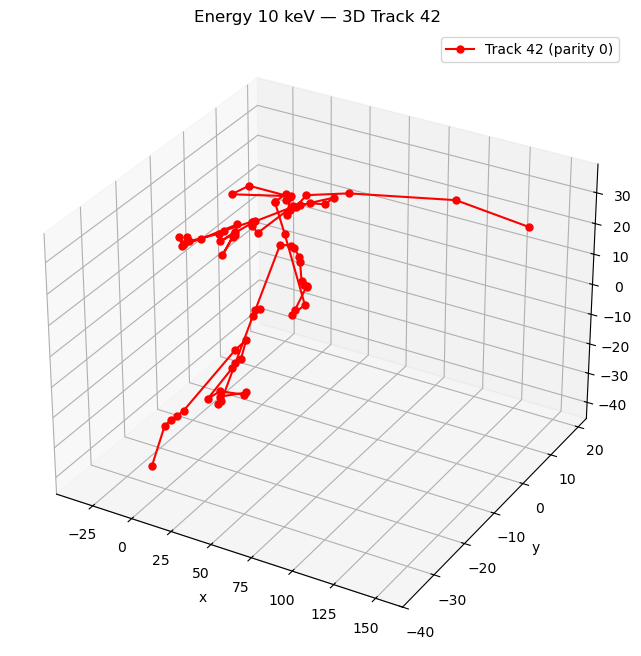

In [5]:
plot_track_3d(df, energy=10, ion_number=42)
plt.show()

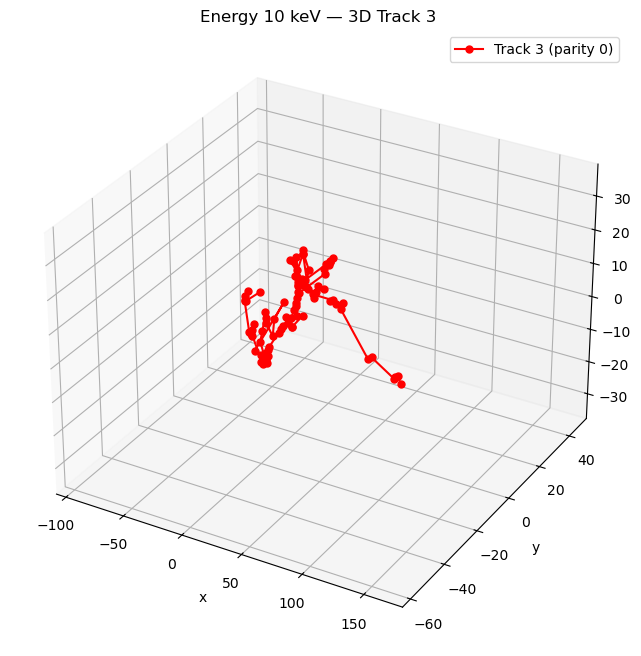

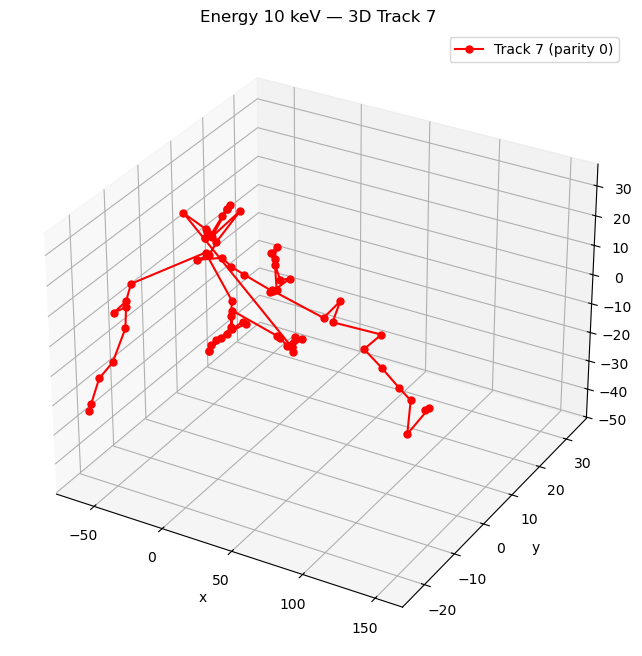

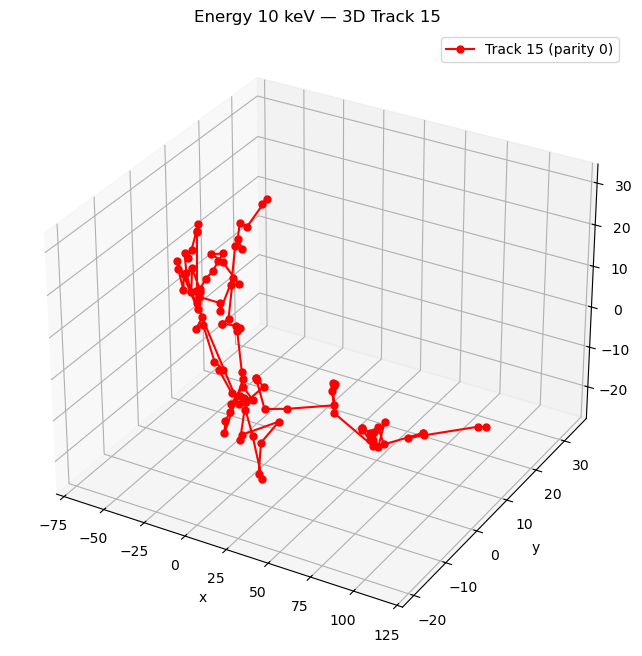

In [6]:
ions = [3, 7, 15]

for ion in ions:
    plot_track_3d(df, energy=10, ion_number=ion)
    plt.show()

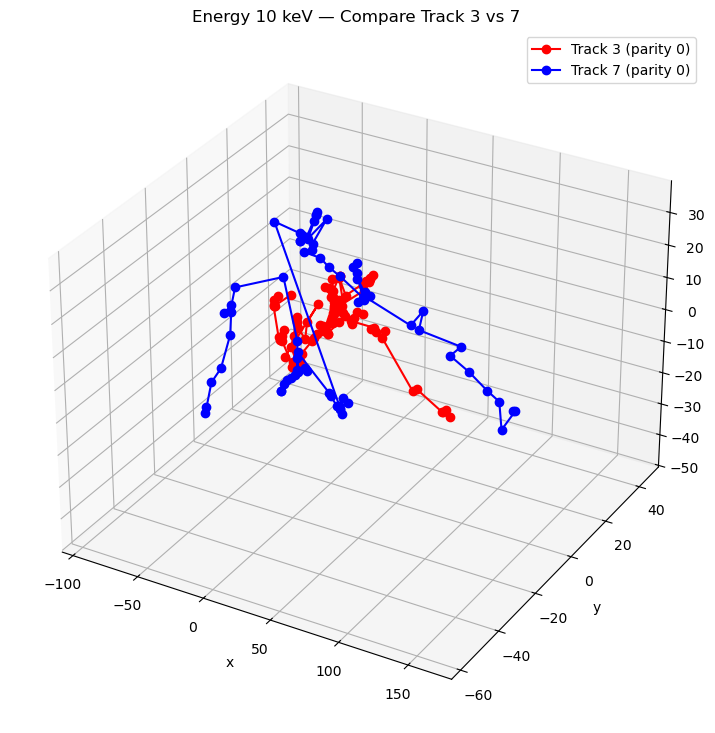

In [7]:
compare_tracks_3d(df, energy=10, ion1=3, ion2=7)

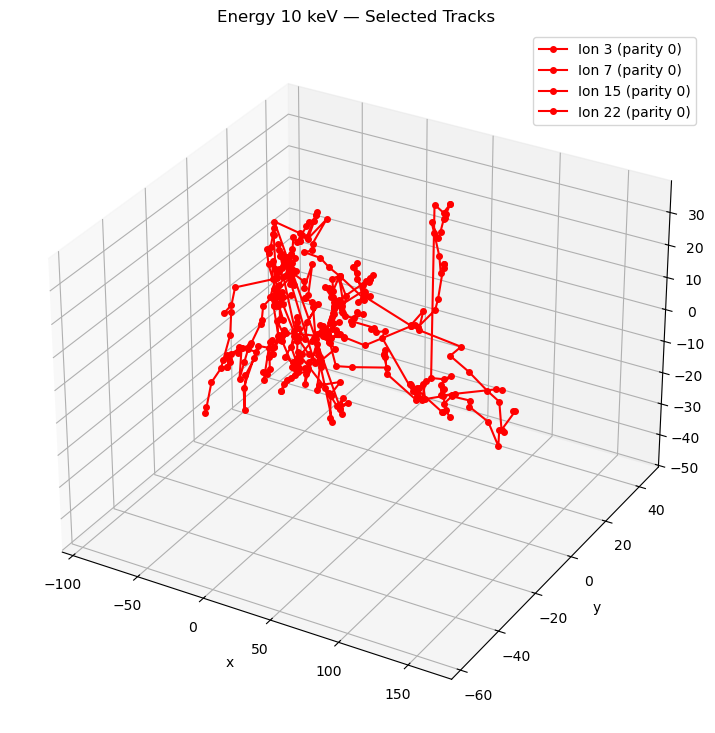

In [9]:
plot_multiple_tracks_3d(df, energy=10, ion_list=[3, 7, 15, 22])

In [10]:
import ipywidgets as widgets
from IPython.display import display
import matplotlib.pyplot as plt

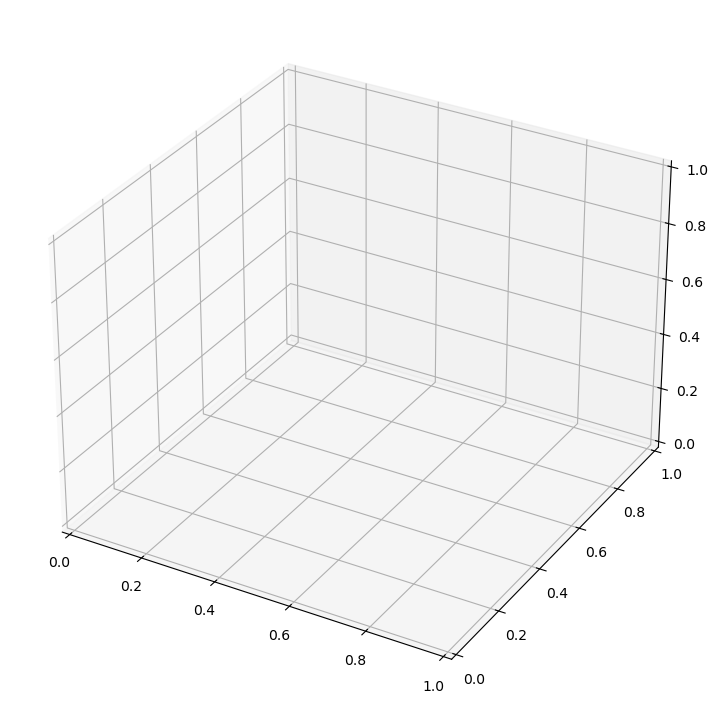

In [ ]:
energies = sorted(df.energy.unique())
energy_widget = widgets.Dropdown(
    options=energies,
    description="Energy (keV):"
)

ion_widget = widgets.Dropdown(
    options=[],
    description="Ion:"
)

In [12]:
def update_ions(change):
    energy = change["new"]
    ions = sorted(df[df.energy == energy].ion_number.unique())
    ion_widget.options = ions

energy_widget.observe(update_ions, names="value")
energy_widget.value = energies[0]

In [13]:
def interactive_plot(energy, ion_number):
    plt.close("all")
    plot_track_3d(df, energy, ion_number)
    plt.show()

ui = widgets.VBox([energy_widget, ion_widget])
out = widgets.interactive_output(
    interactive_plot,
    {"energy": energy_widget, "ion_number": ion_widget}
)

display(ui, out)

Output()

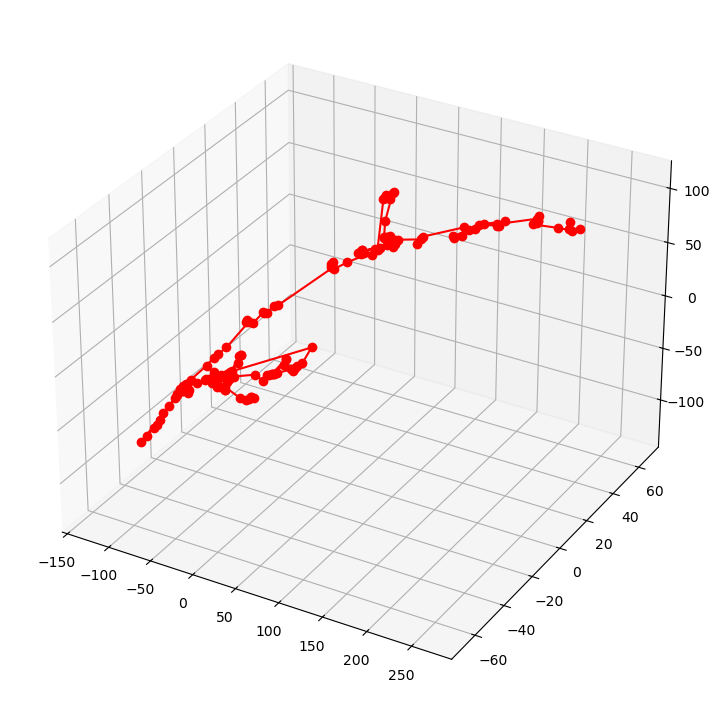

In [14]:
ion1 = widgets.Dropdown(description="Ion 1:")
ion2 = widgets.Dropdown(description="Ion 2:")

def update_compare_ions(change):
    energy = change["new"]
    ions = sorted(df[df.energy == energy].ion_number.unique())
    ion1.options = ions
    ion2.options = ions

energy_widget.observe(update_compare_ions, names="value")

In [17]:


def interactive_compare(energy, ion1, ion2):
    plt.close("all")
    fig = compare_tracks_3d(df, energy, ion1, ion2)
    display(fig)

display(
    widgets.VBox([energy_widget, ion1, ion2]),
    widgets.interactive_output(
        interactive_compare,
        {"energy": energy_widget, "ion1": ion1, "ion2": ion2}
    )
)

Output()

In [24]:
import numpy as np
track = get_track(df, energy=30.0, ion_number=6)


x = track.x.values
y = track.y.values
z = track.z.values

In [25]:
def bin_track_3d(track, n_bins=2):
    x, y, z = track.x.values, track.y.values, track.z.values

    x_edges = np.linspace(x.min(), x.max(), n_bins + 1)
    y_edges = np.linspace(y.min(), y.max(), n_bins + 1)
    z_edges = np.linspace(z.min(), z.max(), n_bins + 1)

    xb = np.digitize(x, x_edges) - 1
    yb = np.digitize(y, y_edges) - 1
    zb = np.digitize(z, z_edges) - 1

    vox = np.zeros((n_bins, n_bins, n_bins))

    for i, j, k in zip(xb, yb, zb):
        if 0 <= i < n_bins and 0 <= j < n_bins and 0 <= k < n_bins:
            vox[i, j, k] += 1

    return vox

In [26]:
voxels = bin_track_3d(track, n_bins=2)
voxels.flatten()

array([59., 11.,  0., 56.,  0., 12.,  1., 12.])

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from IPython.display import display

# ---------- helper: draw a single voxel ----------
def draw_voxel(ax, x0, x1, y0, y1, z0, z1, color="gray", alpha=0.15):
    verts = [
        [(x0,y0,z0),(x1,y0,z0),(x1,y1,z0),(x0,y1,z0)],
        [(x0,y0,z1),(x1,y0,z1),(x1,y1,z1),(x0,y1,z1)],
        [(x0,y0,z0),(x1,y0,z0),(x1,y0,z1),(x0,y0,z1)],
        [(x0,y1,z0),(x1,y1,z0),(x1,y1,z1),(x0,y1,z1)],
        [(x0,y0,z0),(x0,y1,z0),(x0,y1,z1),(x0,y0,z1)],
        [(x1,y0,z0),(x1,y1,z0),(x1,y1,z1),(x1,y0,z1)],
    ]
    ax.add_collection3d(
        Poly3DCollection(verts, facecolors=color, alpha=alpha, edgecolor="k")
    )

# ---------- main plotting function ----------
def plot_track_with_voxels(df, energy, ion):
    plt.close("all")

    track = df[(df.energy == energy) & (df.ion_number == ion)]
    if len(track) == 0:
        return

    x, y, z = track.x.values, track.y.values, track.z.values

    # voxel edges (2 bins per axis)
    x_edges = np.linspace(x.min(), x.max(), 3)
    y_edges = np.linspace(y.min(), y.max(), 3)
    z_edges = np.linspace(z.min(), z.max(), 3)

    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111, projection="3d")

    # plot track
    parity = int(track.parity.iloc[0])
    color = "red" if parity == 0 else "blue"
    ax.plot(x, y, z, "o-", color=color, markersize=4, label=f"Ion {ion}")

    # draw 2x2x2 voxels
    for i in range(2):
        for j in range(2):
            for k in range(2):
                draw_voxel(
                    ax,
                    x_edges[i], x_edges[i+1],
                    y_edges[j], y_edges[j+1],
                    z_edges[k], z_edges[k+1],
                )

    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    ax.set_title(f"Energy {energy} keV — Ion {ion} (2×2×2 voxels)")
    ax.legend()

    return fig

# ---------- UI ----------
energies = sorted(df.energy.unique())

energy_widget = widgets.Dropdown(
    options=energies,
    description="Energy (keV):"
)

ion_widget = widgets.Dropdown(description="Ion:")

def update_ions(change):
    ions = sorted(df[df.energy == change["new"]].ion_number.unique())
    ion_widget.options = ions
    if ions:
        ion_widget.value = ions[0]

energy_widget.observe(update_ions, names="value")
energy_widget.value = energies[0]

ui = widgets.VBox([energy_widget, ion_widget])

out = widgets.interactive_output(
    plot_track_with_voxels,
    {"df": widgets.fixed(df),
     "energy": energy_widget,
     "ion": ion_widget}
)

display(ui, out)

Output()

In [49]:
df = pd.read_csv('/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/200k_raw_tracks_no_rotation.csv')

In [50]:
df.describe()

,x (ang),y (ang),z (ang),ion #,energy
count,4.266474e+07,4.266474e+07,4.266474e+07,4.266474e+07,4.266474e+07
mean,5.930564e+02,6.597974e-02,-3.521990e-02,4.996097e+02,6.047898e+01
std,3.682154e+02,1.307718e+02,1.304378e+02,2.887413e+02,2.587688e+01
min,5.358000e-05,-1.522000e+03,-1.149000e+03,0.000000e+00,1.000000e+00
25%,2.846000e+02,-5.452000e+01,-5.432000e+01,2.500000e+02,4.050000e+01
50%,5.568000e+02,2.458000e-03,-2.945000e-03,4.990000e+02,6.300000e+01
75%,8.664000e+02,5.466000e+01,5.441000e+01,7.500000e+02,8.250000e+01
max,1.943000e+03,1.078000e+03,1.291000e+03,9.990000e+02,1.005000e+02


In [51]:
# Count tracks per (energy, ion_number) pair = number of tracks per energy
tracks_per_energy = (
    df.groupby("energy")["ion #"]
      .nunique()
      .sort_index()
)

print(tracks_per_energy)
print("\nMedian tracks per energy:", tracks_per_energy.median())
print("Min / Max:", tracks_per_energy.min(), "/", tracks_per_energy.max())

energy
1.0      1000
1.5      1000
2.0      1000
2.5      1000
3.0      1000
         ... 
98.5     1000
99.0     1000
99.5     1000
100.0    1000
100.5    1000
Name: ion #, Length: 200, dtype: int64

Median tracks per energy: 1000.0
Min / Max: 1000 / 1000


In [52]:
import pandas as pd


total_tracks = df.groupby(["energy", "ion #"]).ngroups
print("TOTAL TRACKS:", total_tracks)

TOTAL TRACKS: 200000


In [54]:

print(df.columns.tolist())

['x (ang)', 'y (ang)', 'z (ang)', 'ion #', 'energy']


In [55]:
import pandas as pd
import numpy as np

SRC = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/200k_raw_tracks_no_rotation.csv"
OUT = "200k_rotated_8angles.csv"

df = pd.read_csv(SRC)

# ---- AUTO FIX COLUMN NAMES ----
rename_map = {
    "x (ang)": "x", "y (ang)": "y", "z (ang)": "z",
    "x_ang": "x", "y_ang": "y", "z_ang": "z",
    "ion #": "ion_number",
    "energy": "energy_keV", "energy_keV": "energy_keV",
}

df = df.rename(columns={c: rename_map.get(c, c) for c in df.columns})

# ---- VERIFY REQUIRED COLUMNS ----
required = ["x", "y", "z", "ion_number", "energy_keV"]
for col in required:
    if col not in df.columns:
        raise KeyError(f"Missing column: {col}. Found columns: {df.columns.tolist()}")

# ---- 8 ANGLES ----
angles_deg = np.array([0, 45, 90, 135, 180, 225, 270, 315])
angles_rad = np.deg2rad(angles_deg)

rotated_chunks = []

print("Starting rotations...")
for theta_deg, rad in zip(angles_deg, angles_rad):
    print(f" → Rotating {theta_deg}°")

    c, s = np.cos(rad), np.sin(rad)

    rotated = df.copy()
    x_new = df["x"] * c - df["y"] * s
    y_new = df["x"] * s + df["y"] * c

    rotated["x"] = x_new
    rotated["y"] = y_new
    rotated["theta_deg"] = theta_deg
    rotated["cos_theta"] = c
    rotated["sin_theta"] = s

    rotated_chunks.append(rotated)

final_df = pd.concat(rotated_chunks, ignore_index=True)
final_df.to_csv(OUT, index=False)

print("\n[SAVED] →", OUT)
print("Final shape:", final_df.shape)

Starting rotations...
 → Rotating 0°
 → Rotating 45°
 → Rotating 90°
 → Rotating 135°
 → Rotating 180°
 → Rotating 225°
 → Rotating 270°
 → Rotating 315°

[SAVED] → 200k_rotated_8angles.csv
Final shape: (341317912, 8)


In [4]:
unique_tracks = df['ion #'].nunique()
print("Unique tracks:", unique_tracks)

Unique tracks: 1000


In [6]:
import pandas as pd
import numpy as np

# Load your base dataset
df = pd.read_csv("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/200k_raw_tracks_no_rotation.csv")

# Fix column names to simpler ones
df = df.rename(columns={
    'x (ang)': 'x',
    'y (ang)': 'y',
    'z (ang)': 'z'
})

# Angles to generate
angles = [0,45,90,135,180,225,270,315]
TRACKS_PER_ANGLE = 25000  # total rows per angle → 25k * 8 angles = 200k

final_chunks = []

def rotate_xy(df_chunk, theta_deg):
    rad = np.deg2rad(theta_deg)
    c, s = np.cos(rad), np.sin(rad)
    
    out = df_chunk.copy()
    
    # rotate x,y only (z unchanged)
    x, y = out['x'].values, out['y'].values
    out['x'] = x*c - y*s
    out['y'] = x*s + y*c

    # store angle labels for training
    out['theta_deg'] = theta_deg
    out['cos_theta'] = c
    out['sin_theta'] = s
    return out


for theta in angles:
    print(f"\n--- Angle {theta}° ---")

    sub = df.sample(TRACKS_PER_ANGLE, random_state=theta, replace=False)
    rotated = rotate_xy(sub, theta)
    final_chunks.append(rotated)

    print(f"Added {len(rotated)} rotated rows at {theta}°")


# Build final dataset
final_df = pd.concat(final_chunks, ignore_index=True)

OUT = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/200k_ROTATED_BALANCED.csv"
final_df.to_csv(OUT, index=False)

print("\n🎉 DONE!")
print("Saved to:", OUT)
print("Final shape:", final_df.shape)
print("Unique energies:", final_df['energy'].nunique())
print("Tracks per angle:", final_df['theta_deg'].value_counts())


--- Angle 0° ---
Added 25000 rotated rows at 0°

--- Angle 45° ---
Added 25000 rotated rows at 45°

--- Angle 90° ---
Added 25000 rotated rows at 90°

--- Angle 135° ---
Added 25000 rotated rows at 135°

--- Angle 180° ---
Added 25000 rotated rows at 180°

--- Angle 225° ---
Added 25000 rotated rows at 225°

--- Angle 270° ---
Added 25000 rotated rows at 270°

--- Angle 315° ---
Added 25000 rotated rows at 315°

🎉 DONE!
Saved to: /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/200k_ROTATED_BALANCED.csv
Final shape: (200000, 8)
Unique energies: 200
Tracks per angle: theta_deg
0      25000
45     25000
90     25000
135    25000
180    25000
225    25000
270    25000
315    25000
Name: count, dtype: int64


In [20]:
df = pd.read_csv('/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated_OFFGRID.csv')

# training energies
energies_train = sorted(df['energy'].unique())
print(len(energies_train), "unique training energies")
print(energies_train[:], "...")  # show sample

200 unique training energies
[1.1, 1.6, 2.1, 2.6, 3.1, 3.6, 4.1, 4.6, 5.1000000000000005, 5.6000000000000005, 6.1000000000000005, 6.6000000000000005, 7.1000000000000005, 7.6, 8.100000000000001, 8.600000000000001, 9.1, 9.6, 10.1, 10.6, 11.1, 11.6, 12.1, 12.6, 13.1, 13.6, 14.1, 14.6, 15.1, 15.6, 16.1, 16.6, 17.1, 17.6, 18.1, 18.6, 19.1, 19.6, 20.1, 20.6, 21.1, 21.6, 22.1, 22.6, 23.1, 23.6, 24.1, 24.6, 25.1, 25.6, 26.1, 26.6, 27.1, 27.6, 28.1, 28.6, 29.1, 29.6, 30.1, 30.6, 31.1, 31.6, 32.1, 32.6, 33.1, 33.6, 34.1, 34.6, 35.1, 35.6, 36.1, 36.6, 37.1, 37.6, 38.1, 38.6, 39.1, 39.6, 40.1, 40.6, 41.1, 41.6, 42.1, 42.6, 43.1, 43.6, 44.1, 44.6, 45.1, 45.6, 46.1, 46.6, 47.1, 47.6, 48.1, 48.6, 49.1, 49.6, 50.1, 50.6, 51.1, 51.6, 52.1, 52.6, 53.1, 53.6, 54.1, 54.6, 55.1, 55.6, 56.1, 56.6, 57.1, 57.6, 58.1, 58.6, 59.1, 59.6, 60.1, 60.6, 61.1, 61.6, 62.1, 62.6, 63.1, 63.6, 64.1, 64.6, 65.10000000000001, 65.60000000000001, 66.10000000000001, 66.60000000000001, 67.10000000000001, 67.60000000000001, 68.

In [11]:
import pandas as pd
import numpy as np

# -----------------------------
# CONFIG
# -----------------------------
INPUT = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated.csv"
OUTPUT = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_rotated_full.csv"

ANGLES = [0, 45, 90, 135, 180, 225, 270, 315]
ANGLE_TO_CLASS = {ang: idx for idx, ang in enumerate(ANGLES)}

df = pd.read_csv(INPUT)

# Ensure columns exist
required_cols = ["x (ang)", "y (ang)", "z (ang)", "ion #", "energy_keV"]
for c in required_cols:
    assert c in df.columns, f"Missing column: {c}"

rotated_blocks = []

# -----------------------------
# Rotation helper (XY plane)
# -----------------------------
def rotate_xy(x, y, deg):
    theta = np.deg2rad(deg)
    c, s = np.cos(theta), np.sin(theta)
    x_new = c * x - s * y
    y_new = s * x + c * y
    return x_new, y_new

# -----------------------------
# Select 625 unique tracks first
# -----------------------------
unique_tracks = list(df.groupby(["energy_keV", "ion #"]).groups.keys())
np.random.shuffle(unique_tracks)

SELECTED_TRACKS = unique_tracks[:625]  # pick 625 only
print(f"[INFO] Selected {len(SELECTED_TRACKS)} base tracks for rotation")

# -----------------------------
# Rotate only those 625 tracks
# -----------------------------
for (E, ion) in SELECTED_TRACKS:
    g = df[(df["energy_keV"] == E) & (df["ion #"] == ion)]

    x = g["x (ang)"].values
    y = g["y (ang)"].values
    z = g["z (ang)"].values

    for ang in ANGLES:
        xr, yr = rotate_xy(x, y, ang)
        g_rot = g.copy()
        g_rot["x"] = xr
        g_rot["y"] = yr
        g_rot["theta_deg"] = ang
        g_rot["angle_class"] = ANGLE_TO_CLASS[ang]
        g_rot["cos_theta"] = np.cos(np.deg2rad(ang))
        g_rot["sin_theta"] = np.sin(np.deg2rad(ang))
        rotated_blocks.append(g_rot)

# -----------------------------
# Save final dataset
# -----------------------------
df_final = pd.concat(rotated_blocks, ignore_index=True)
df_final.to_csv(OUTPUT, index=False)

# Count logical tracks:
logical_tracks = df_final.groupby(["energy_keV", "ion #", "angle_class"]).ngroups
print(f"\n[DONE] Saved → {OUTPUT}")
print(f"Logical tracks: {logical_tracks}  (expected: 5000)")
print(f"Tracks per angle_class:\n{df_final['angle_class'].value_counts()}")

[INFO] Selected 600 base tracks for rotation

[DONE] Saved → /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_rotated_full.csv
Logical tracks: 4800  (expected: 5000)
Tracks per angle_class:
angle_class
0    127492
1    127492
2    127492
3    127492
4    127492
5    127492
6    127492
7    127492
Name: count, dtype: int64


In [15]:
df = pd.read_csv('/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_rotated_full.csv')
print(df["angle_class"].value_counts())
print(df[["ion #","angle_class"]].head(20))

# group by ion and count unique angle labels
multi_angle = df.groupby("ion #")["angle_class"].nunique()

# show ions that have more than one angle label
problem_ions = multi_angle[multi_angle > 1]
print(problem_ions.head(20))
print(f"\n🚨 Ions with conflicting angles: {problem_ions.shape[0]}")

angle_class
0    127492
1    127492
2    127492
3    127492
4    127492
5    127492
6    127492
7    127492
Name: count, dtype: int64
    ion #  angle_class
0     392            0
1     392            0
2     392            0
3     392            0
4     392            0
5     392            0
6     392            0
7     392            0
8     392            0
9     392            0
10    392            0
11    392            0
12    392            0
13    392            0
14    392            0
15    392            0
16    392            0
17    392            0
18    392            0
19    392            0
ion #
0     8
3     8
7     8
8     8
12    8
13    8
15    8
16    8
18    8
19    8
23    8
26    8
27    8
29    8
31    8
32    8
34    8
35    8
36    8
37    8
Name: angle_class, dtype: int64

🚨 Ions with conflicting angles: 445


In [17]:
import pandas as pd
import numpy as np

df = pd.read_csv("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated.csv")
df = df.rename(columns={'x (ang)':'x','y (ang)':'y','z (ang)':'z'})

angles = [0,45,90,135,180,225,270,315]
tracks_per_class = len(df) // 8  # 625

final = []

def rotate_xy(track, theta):
    r = np.deg2rad(theta)
    c, s = np.cos(r), np.sin(r)
    out = track.copy()
    out['x'], out['y'] = out['x']*c - out['y']*s, out['x']*s + out['y']*c
    
    # --- ADD REQUIRED MDPE COLUMNS ---
    out['theta_deg']  = theta
    out['cos_theta']  = c
    out['sin_theta']  = s
    out['angle_class'] = angles.index(theta)  # 0..7
    
    return out

for theta in angles:
    sub = df.sample(tracks_per_class, replace=False, random_state=theta)
    rotated = rotate_xy(sub, theta)
    final.append(rotated)

eval_fixed = pd.concat(final, ignore_index=True)
eval_fixed.to_csv("EVAL_FIXED_5k.csv", index=False)

print("\n🎯 DONE! 625 tracks/class. Balanced. Clean. Ready for MDPE.")
print("➡️ Saved: EVAL_FIXED_5k.csv")


🎯 DONE! 625 tracks/class. Balanced. Clean. Ready for MDPE.
➡️ Saved: EVAL_FIXED_5k.csv


In [ ]:
#!/usr/bin/env python3
import pandas as pd
import numpy as np
from pathlib import Path

# ============================
# CONFIG – EDIT PATHS
# ============================
TRAIN_CSV = Path("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_dataset.csv")              # your training set
EVAL_CSV  = Path("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/EVAL_FIXED_5k.csv")   # your eval set

# ============================
# SMALL HELPERS
# ============================

def load_and_standardize(path: Path, label: str):
    print(f"\n========== LOAD {label} ==========")
    df = pd.read_csv(path)
    print(f"[{label}] shape: {df.shape}")
    print(f"[{label}] columns:\n  {list(df.columns)}")

    # flatten headers / strip
    df.columns = [str(c).strip() for c in df.columns]

    # standardize common names
    rename_map = {
        "x (ang)": "x",
        "y (ang)": "y",
        "z (ang)": "z",
        "ion #": "ion_number",
        "energy": "energy_keV",   # if present
    }
    df = df.rename(columns={k: v for k, v in rename_map.items() if k in df.columns})

    # drop duplicate names if any
    df = df.loc[:, ~df.columns.duplicated()]

    # energy
    if "energy_keV" not in df.columns:
        raise KeyError(f"[{label}] No energy column called 'energy_keV' or 'energy'.")

    df["energy_keV"] = pd.to_numeric(df["energy_keV"], errors="coerce")

    # angle_class: if not present but theta_deg exists, infer it
    if "angle_class" not in df.columns:
        if "theta_deg" in df.columns:
            ANGLES = np.array([0,45,90,135,180,225,270,315])
            def infer_cls(a):
                return int(np.argmin(np.abs(ANGLES - a)))
            df["angle_class"] = df["theta_deg"].apply(infer_cls)
            print(f"[{label}] angle_class inferred from theta_deg.")
        else:
            print(f"[{label}] WARNING: no angle_class or theta_deg column.")

    # ion_number
    if "ion_number" not in df.columns:
        raise KeyError(f"[{label}] No ion_number / 'ion #' column found.")

    # clean NaNs in key fields
    df = df.dropna(subset=["energy_keV", "ion_number"]).reset_index(drop=True)

    # cast
    df["ion_number"]   = pd.to_numeric(df["ion_number"], errors="coerce").astype(int)
    if "angle_class" in df.columns:
        df["angle_class"] = pd.to_numeric(df["angle_class"], errors="coerce").astype(int)

    return df


def summarize_dataset(df: pd.DataFrame, label: str):
    print(f"\n========== SUMMARY {label} ==========")

    # energies
    uniq_E = np.sort(df["energy_keV"].unique())
    print(f"[{label}] # unique energies: {len(uniq_E)}")
    print(f"[{label}] energy range: {uniq_E.min():.3f} → {uniq_E.max():.3f}")
    print(f"[{label}] first 10 energies: {uniq_E[:10]}")

    # tracks = unique (E, ion)
    n_tracks = df[["energy_keV", "ion_number"]].drop_duplicates().shape[0]
    print(f"[{label}] unique (energy, ion_number) tracks: {n_tracks}")

    # angle_class distribution (if present)
    if "angle_class" in df.columns:
        print(f"\n[{label}] angle_class counts (rows):")
        print(df["angle_class"].value_counts().sort_index())

        per_track = (
            df.groupby(["energy_keV", "ion_number"])["angle_class"]
              .nunique()
              .value_counts()
              .sort_index()
        )
        print(f"\n[{label}] #distinct angle_class per (energy, ion) track:")
        print(per_track)


def compare_train_eval(df_train: pd.DataFrame, df_eval: pd.DataFrame):
    print("\n========== TRAIN vs EVAL: ENERGIES ==========")
    E_train = set(np.round(df_train["energy_keV"].unique(), 3))
    E_eval  = set(np.round(df_eval["energy_keV"].unique(), 3))

    only_train = sorted(E_train - E_eval)
    only_eval  = sorted(E_eval - E_train)
    both       = sorted(E_train & E_eval)

    print(f"Energies in TRAIN only  : {len(only_train)}")
    print(f"Energies in EVAL only   : {len(only_eval)}")
    print(f"Energies in BOTH        : {len(both)}")

    print("\nFirst few energies only in TRAIN:", only_train[:20])
    print("First few energies only in EVAL :", only_eval[:20])

    print("\n========== TRAIN vs EVAL: ANGLE CLASS COVERAGE ==========")
    if "angle_class" in df_train.columns and "angle_class" in df_eval.columns:
        print("\n[TRAIN] angle_class counts:")
        print(df_train["angle_class"].value_counts().sort_index())

        print("\n[EVAL ] angle_class counts:")
        print(df_eval["angle_class"].value_counts().sort_index())

        # per-energy angle coverage
        train_angle_per_E = (
            df_train.groupby("energy_keV")["angle_class"].nunique()
                    .reset_index(name="n_classes")
        )
        eval_angle_per_E = (
            df_eval.groupby("energy_keV")["angle_class"].nunique()
                   .reset_index(name="n_classes")
        )

        print("\n[TRAIN] energies with < 8 classes (head):")
        print(train_angle_per_E[train_angle_per_E["n_classes"] < 8].head(20))

        print("\n[EVAL ] energies with < 8 classes (head):")
        print(eval_angle_per_E[eval_angle_per_E["n_classes"] < 8].head(20))

    # check for conflicting angle labels per track
    if "angle_class" in df_train.columns:
        print("\n[TRAIN] ions with >1 angle_class:")
        train_multi = (
            df_train.groupby(["energy_keV", "ion_number"])["angle_class"]
                    .nunique()
        )
        n_conf_train = (train_multi > 1).sum()
        print(f"  count = {n_conf_train}")

    if "angle_class" in df_eval.columns:
        print("\n[EVAL] ions with >1 angle_class:")
        eval_multi = (
            df_eval.groupby(["energy_keV", "ion_number"])["angle_class"]
                   .nunique()
        )
        n_conf_eval = (eval_multi > 1).sum()
        print(f"  count = {n_conf_eval}")


# ============================
# MAIN
# ============================
if __name__ == "__main__":
    df_train = load_and_standardize(TRAIN_CSV, "TRAIN")
    df_eval  = load_and_standardize(EVAL_CSV,  "EVAL")

    summarize_dataset(df_train, "TRAIN")
    summarize_dataset(df_eval,  "EVAL")

    compare_train_eval(df_train, df_eval)


========== LOAD TRAIN ==========
[TRAIN] shape: (200000, 9)
[TRAIN] columns:
  ['x', 'y', 'z', 'ion #', 'energy', 'theta_deg', 'cos_theta', 'sin_theta', 'angle_class']

========== LOAD EVAL ==========
[EVAL] shape: (127488, 10)
[EVAL] columns:
  ['x', 'y', 'z', 'ion #', 'energy', 'energy_keV', 'theta_deg', 'cos_theta', 'sin_theta', 'angle_class']

========== SUMMARY TRAIN ==========
[TRAIN] # unique energies: 200
[TRAIN] energy range: 1.000 → 100.500
[TRAIN] first 10 energies: [1.  1.5 2.  2.5 3.  3.5 4.  4.5 5.  5.5]
[TRAIN] unique (energy, ion_number) tracks: 119903

[TRAIN] angle_class counts (rows):
angle_class
0    25000
1    25000
2    25000
3    25000
4    25000
5    25000
6    25000
7    25000
Name: count, dtype: int64

[TRAIN] #distinct angle_class per (energy, ion) track:
angle_class
1    71191
2    34723
3    11013
4     2548
5      376
6       46
7        6
Name: count, dtype: int64

========== SUMMARY EVAL ==========
[EVAL] # unique energies: 200
[EVAL] energy range: 1.00

In [19]:
#!/usr/bin/env python3
import pandas as pd
import numpy as np
from pathlib import Path

# ----------------------------------------------------
# CONFIG
# ----------------------------------------------------
RAW_EVAL_UNROTATED = Path(
    "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated.csv"
)

OUT_PATH = Path(
    "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/EVAL_FULLYFIXED_5k.csv"
)

N_TRACKS_TARGET = 5000
ANGLES = [0, 45, 90, 135, 180, 225, 270, 315]
ANGLE_TO_CLASS = {ang: i for i, ang in enumerate(ANGLES)}
RNG_SEED = 42

# ----------------------------------------------------
# 1. LOAD + STANDARDIZE
# ----------------------------------------------------
print(f"[LOAD] {RAW_EVAL_UNROTATED}")
df = pd.read_csv(RAW_EVAL_UNROTATED)

# Normalize column names
rename_map = {
    "x (ang)": "x",
    "y (ang)": "y",
    "z (ang)": "z",
    "ion #": "ion_number",
}
df = df.rename(columns={k: v for k, v in rename_map.items() if k in df.columns})

# Energy handling → energy_keV
if "energy_keV" in df.columns:
    df["energy_keV"] = pd.to_numeric(df["energy_keV"], errors="coerce")
elif "energy" in df.columns:
    e_raw = pd.to_numeric(df["energy"], errors="coerce")
    # assume keV already (your eval is keV)
    df["energy_keV"] = e_raw
else:
    raise KeyError("No 'energy' or 'energy_keV' found in eval-unrotated CSV.")

# Basic sanity
for c in ["x", "y", "z", "ion_number", "energy_keV"]:
    if c not in df.columns:
        raise KeyError(f"Missing column '{c}' in unrotated eval CSV.")
    df[c] = pd.to_numeric(df[c], errors="coerce")

df = df.dropna(subset=["x", "y", "z", "ion_number", "energy_keV"]).reset_index(drop=True)

print(f"[INFO] Rows in unrotated eval CSV: {len(df)}")

# ----------------------------------------------------
# 2. BUILD LOGICAL TRACKS (energy_keV, ion_number)
# ----------------------------------------------------
groups = df.groupby(["energy_keV", "ion_number"], sort=False)
track_keys = list(groups.groups.keys())
n_tracks = len(track_keys)

print(f"[INFO] Found {n_tracks} logical tracks in unrotated eval.")

if n_tracks < N_TRACKS_TARGET:
    raise ValueError(
        f"Only {n_tracks} tracks available, but N_TRACKS_TARGET={N_TRACKS_TARGET}."
    )

# ----------------------------------------------------
# 3. SAMPLE 5000 UNIQUE TRACKS
# ----------------------------------------------------
np.random.seed(RNG_SEED)
selected_idx = np.random.choice(len(track_keys), size=N_TRACKS_TARGET, replace=False)
selected_keys = [track_keys[i] for i in selected_idx]

print(f"[INFO] Selected {len(selected_keys)} base tracks for rotation.")

# ----------------------------------------------------
# 4. ASSIGN ANGLES — 625 TRACKS PER CLASS
# ----------------------------------------------------
# create angle assignments by cycling through 0..7
angle_assignments = []
for i, key in enumerate(selected_keys):
    cls_idx = i % len(ANGLES)
    angle = ANGLES[cls_idx]
    angle_assignments.append((key, angle, cls_idx))

# Shuffle again so energies/classes are mixed
np.random.shuffle(angle_assignments)

# ----------------------------------------------------
# 5. ROTATE EACH TRACK ONCE AND LABEL
# ----------------------------------------------------
def rotate_xy(x, y, deg):
    theta = np.deg2rad(deg)
    c, s = np.cos(theta), np.sin(theta)
    x_new = c * x - s * y
    y_new = s * x + c * y
    return x_new, y_new

rotated_blocks = []

for (E, ion), angle, cls in angle_assignments:
    g = groups.get_group((E, ion)).copy()

    # rotate xy in-place
    x_arr = g["x"].to_numpy(float)
    y_arr = g["y"].to_numpy(float)

    xr, yr = rotate_xy(x_arr, y_arr, angle)
    g["x"] = xr
    g["y"] = yr

    # add MDPE label columns
    g["theta_deg"] = angle
    g["angle_class"] = cls
    g["cos_theta"] = np.cos(np.deg2rad(angle))
    g["sin_theta"] = np.sin(np.deg2rad(angle))

    rotated_blocks.append(g)

# ----------------------------------------------------
# 6. CONCAT + FINAL SANITY CHECKS
# ----------------------------------------------------
df_eval = pd.concat(rotated_blocks, ignore_index=True)

print("\n[CHECK] angle_class counts (rows):")
print(df_eval["angle_class"].value_counts())

# Check 1: number of logical tracks
logical_tracks = df_eval.groupby(["energy_keV", "ion_number", "angle_class"]).ngroups
print(f"\n[CHECK] logical tracks in final eval: {logical_tracks} (target {N_TRACKS_TARGET})")

# Check 2: ensure no ion has multiple angle classes
multi_angle = (
    df_eval.groupby(["energy_keV", "ion_number"])["angle_class"].nunique()
)
n_conflict = (multi_angle > 1).sum()
print(f"[CHECK] ions with >1 angle_class: {n_conflict}")

if n_conflict != 0:
    print("⚠️ WARNING: Somehow still have conflicting angle labels. Investigate before training.")
else:
    print("✅ Each (energy_keV, ion_number) has exactly ONE angle_class.")

# ----------------------------------------------------
# 7. SAVE
# ----------------------------------------------------
OUT_PATH.parent.mkdir(parents=True, exist_ok=True)
df_eval.to_csv(OUT_PATH, index=False)

print("\n[DONE] Clean MDPE eval dataset written to:")
print("      ", OUT_PATH)
print("      rows:", len(df_eval))

[LOAD] /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated.csv
[INFO] Rows in unrotated eval CSV: 127492
[INFO] Found 600 logical tracks in unrotated eval.


ValueError: Only 600 tracks available, but N_TRACKS_TARGET=5000.

In [22]:
import pandas as pd
import numpy as np

IN_FILE  = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated_OFFGRID.csv"          # 5000 unrotated tracks
OUT_FILE = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_ROTATED_BALANCED_OFFGrid.csv"   # final output

ANGLES = [0,45,90,135,180,225,270,315]
ANGLE_TO_CLASS = {ang:i for i,ang in enumerate(ANGLES)}
TRACKS_PER_CLASS = 625  # 5000/8


# ----------------------------------------------------------
# 1) LOAD + GROUP UNIQUE TRACKS
# ----------------------------------------------------------
df = pd.read_csv(IN_FILE)
df = df.rename(columns={"ion #":"ion_number", "energy":"energy_keV"})
df["energy_keV"] = pd.to_numeric(df["energy_keV"], errors="coerce")

groups = list(df.groupby(["energy_keV","ion_number"]))
np.random.shuffle(groups)

if len(groups) < 5000:
    raise ValueError(f"Only {len(groups)} tracks found, need 5000!")


# ----------------------------------------------------------
# 2) SELECT EXACTLY 5000 TRACKS + ASSIGN CLASSES
# ----------------------------------------------------------
selected = groups[:5000]  # pick first 5000 shuffled
assignments = []          # ( (E,ion), angle, class )

for class_idx, start in enumerate(range(0,5000,TRACKS_PER_CLASS)):
    end = start + TRACKS_PER_CLASS
    chunk = selected[start:end]
    angle = ANGLES[class_idx]
    for (key, _) in chunk:
        assignments.append((key, angle, class_idx))


# ----------------------------------------------------------
# 3) ROTATE AND REBUILD DATA
# ----------------------------------------------------------
def rotate_xy(x,y,deg):
    t = np.deg2rad(deg)
    c,s = np.cos(t), np.sin(t)
    return c*x - s*y, s*x + c*y

rotated_rows = []

for (E,ion),ang,cls in assignments:
    g = df[(df.energy_keV==E)&(df.ion_number==ion)].copy()
    xr, yr = rotate_xy(g.x.values, g.y.values, ang)
    g["x"], g["y"] = xr, yr
    g["theta_deg"] = ang
    g["angle_class"] = cls
    g["cos_theta"] = np.cos(np.deg2rad(ang))
    g["sin_theta"] = np.sin(np.deg2rad(ang))
    rotated_rows.append(g)

final = pd.concat(rotated_rows, ignore_index=True)
final.to_csv(OUT_FILE, index=False)

print("====================================================")
print("[DONE] Rotated eval dataset ready!")
print(f"Saved → {OUT_FILE}")
print("Counts per class:")
print(final["angle_class"].value_counts())
print("====================================================")

TypeError: arg must be a list, tuple, 1-d array, or Series

In [28]:
import pandas as pd

FILE1 = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated_OFFGRID.csv"
FILE2 = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_dataset.csv"

df1 = pd.read_csv(FILE1, nrows=1)  # load only header (fast)
df2 = pd.read_csv(FILE2, nrows=1)

print("\n======= FILE 1 COLUMNS =======")
print(list(df1.columns))

print("\n======= FILE 2 COLUMNS =======")
print(list(df2.columns))

print("\n======= DIFFERENCES =======")
print("In FILE1 but not FILE2:", set(df1.columns) - set(df2.columns))
print("In FILE2 but not FILE1:", set(df2.columns) - set(df1.columns))


======= FILE 1 COLUMNS =======
['x (ang)', 'y (ang)', 'z (ang)', 'ion #', 'energy', 'energy_keV']

======= FILE 2 COLUMNS =======
['x', 'y', 'z', 'ion #', 'energy', 'theta_deg', 'cos_theta', 'sin_theta', 'angle_class']

======= DIFFERENCES =======
In FILE1 but not FILE2: {'z (ang)', 'energy_keV', 'y (ang)', 'x (ang)'}
In FILE2 but not FILE1: {'y', 'z', 'x', 'cos_theta', 'sin_theta', 'angle_class', 'theta_deg'}


In [29]:
import pandas as pd

EVAL = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated_OFFGRID.csv"

df = pd.read_csv(EVAL)

df = df.rename(columns={
    "x (ang)": "x",
    "y (ang)": "y",
    "z (ang)": "z",
    "ion #": "ion_number",
})

# Remove duplicate if present
df = df.drop(columns=["energy"], errors="ignore")

df["energy_keV"] = pd.to_numeric(df["energy_keV"], errors="coerce")

df.to_csv(EVAL, index=False)
print("🎉 EVAL dataset normalized and saved.")
print("Columns:", df.columns.tolist())

🎉 EVAL dataset normalized and saved.
Columns: ['x', 'y', 'z', 'ion_number', 'energy_keV']


In [30]:
#!/usr/bin/env python3
import pandas as pd
import numpy as np
from pathlib import Path

# ----------------------------------------------------
# FILES (update to your actual normalized eval path)
# ----------------------------------------------------
IN_FILE  = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated_OFFGRID.csv"
OUT_FILE = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/EVAL_ROTATED_5k_MDPE.csv"

ANGLES = [0,45,90,135,180,225,270,315]       # 8 directions
ANGLE_TO_CLASS = {a:i for i,a in enumerate(ANGLES)}
TARGET_TRACKS = 5000                         # total
TRACKS_PER_CLASS = TARGET_TRACKS // 8        # 625 each
rng = np.random.default_rng(42)

# ----------------------------------------------------
# 1. LOAD + GROUP INTO TRACKS
# ----------------------------------------------------
df = pd.read_csv(IN_FILE)
df = df.rename(columns={"ion #":"ion_number"})  # safety

groups = list(df.groupby(["energy_keV", "ion_number"]))
rng.shuffle(groups)  # randomize order

print(f"[INFO] Found {len(groups)} total tracks available.")
if len(groups) < TARGET_TRACKS:
    raise RuntimeError(f"Not enough unique tracks to build {TARGET_TRACKS} eval set.")


# ----------------------------------------------------
# 2. ASSIGN ANGLES (625 tracks per class)
# ----------------------------------------------------
rot_assignments = []
idx = 0

for cls, angle in enumerate(ANGLES):
    needed = TRACKS_PER_CLASS
    selected = groups[idx:idx+needed]
    idx += needed
    for (key, track) in selected:
        rot_assignments.append((track.copy(), angle, cls))

rng.shuffle(rot_assignments)  # mix energies across classes


# ----------------------------------------------------
# 3. ROTATE EACH TRACK
# ----------------------------------------------------
def rotate(x, y, theta):
    rad = np.deg2rad(theta)
    c, s = np.cos(rad), np.sin(rad)
    return x*c - y*s, x*s + y*c

rotated_blocks = []

for track, angle, cls in rot_assignments:
    x_new, y_new = rotate(track["x"].to_numpy(), track["y"].to_numpy(), angle)
    track["x"] = x_new
    track["y"] = y_new

    track["theta_deg"] = angle
    track["angle_class"] = cls
    track["cos_theta"] = np.cos(np.deg2rad(angle))
    track["sin_theta"] = np.sin(np.deg2rad(angle))

    rotated_blocks.append(track)

# ----------------------------------------------------
# 4. SAVE OUTPUT
# ----------------------------------------------------
df_out = pd.concat(rotated_blocks, ignore_index=True)
df_out.to_csv(OUT_FILE, index=False)

print("\n=========== ROTATION COMPLETE ===========")
print(f"[SAVED]  →  {OUT_FILE}")
print(f"[TRACKS] {df_out.groupby(['energy_keV','ion_number']).ngroups}")
print(f"[CLASS BALANCE]")
print(df_out["angle_class"].value_counts())
print("==========================================\n")

[INFO] Found 5000 total tracks available.

=========== ROTATION COMPLETE ===========
[SAVED]  →  /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/EVAL_ROTATED_5k_MDPE.csv
[TRACKS] 5000
[CLASS BALANCE]
angle_class
1    135392
4    134435
3    134038
0    133574
2    132923
7    132628
5    131324
6    130893
Name: count, dtype: int64



In [31]:
import pandas as pd

df = pd.read_csv("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/EVAL_ROTATED_5k_MDPE.csv")

tracks = df.groupby(["energy_keV","ion_number","angle_class"]).ngroups
print("TRACK COUNT:", tracks)

print("\nTRACKS PER CLASS:")
print(df.groupby(["angle_class"])["ion_number"].nunique())

TRACK COUNT: 5000

TRACKS PER CLASS:
angle_class
0    468
1    465
2    464
3    468
4    472
5    453
6    475
7    457
Name: ion_number, dtype: int64


In [33]:
import pandas as pd
import numpy as np
from pathlib import Path

IN_FILE  = Path("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated_OFFGRID.csv")
OUT_FILE = Path("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/EVAL_ROTATED_5k_MDPE_FIXED.csv")

ANGLES = [0,45,90,135,180,225,270,315]
ANGLE_TO_CLASS = {a:i for i,a in enumerate(ANGLES)}

df = pd.read_csv(IN_FILE)

# unique track identifiers
tracks = df.groupby(["energy_keV","ion_number"], sort=False).groups
keys = list(tracks.keys())
np.random.shuffle(keys)

# assign each track a class
assignments = {}
for i, key in enumerate(keys):
    angle = ANGLES[i % 8]          # cycle classes evenly
    assignments[key] = angle       # store (E,ion)->angle

# apply rotation + labels
rotated = []

def rot(x,y,deg):
    t = np.deg2rad(deg); c,s = np.cos(t), np.sin(t)
    return c*x - s*y, s*x + c*y

for (E,ion), sub in tracks.items():
    g = df.loc[sub].copy()
    ang = assignments[(E,ion)]
    g["x"], g["y"] = rot(g["x"], g["y"], ang)

    g["angle_class"] = ANGLE_TO_CLASS[ang]
    g["theta_deg"]   = ang
    g["cos_theta"]   = np.cos(np.deg2rad(ang))
    g["sin_theta"]   = np.sin(np.deg2rad(ang))
    rotated.append(g)

out = pd.concat(rotated, ignore_index=True)
out.to_csv(OUT_FILE, index=False)

print("DONE:", OUT_FILE)
print("Tracks:", out.groupby(["energy_keV","ion_number","angle_class"]).ngroups)
print(out["angle_class"].value_counts())

DONE: /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/EVAL_ROTATED_5k_MDPE_FIXED.csv
Tracks: 5000
angle_class
0    136128
3    135659
7    134136
1    133052
6    132511
4    132307
2    130795
5    130619
Name: count, dtype: int64


In [35]:
import pandas as pd

df = pd.read_csv("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/EVAL_ROTATED_5k_MDPE_FIXED.csv")

# Count unique tracks per class
tracks_per_class = df.groupby(["angle_class", "energy_keV", "ion_number"]).ngroups

print("TOTAL TRACKS:", df.groupby(["energy_keV", "ion_number", "angle_class"]).ngroups)
print("\nTRACKS PER CLASS:")
print(df.groupby("angle_class")[["energy_keV","ion_number"]].apply(
        lambda x: x.drop_duplicates().shape[0]
     ))

TOTAL TRACKS: 5000

TRACKS PER CLASS:
angle_class
0    625
1    625
2    625
3    625
4    625
5    625
6    625
7    625
dtype: int64


In [36]:
import pandas as pd

FILE = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/EVAL_ROTATED_5k_MDPE_FIXED.csv"
df = pd.read_csv(FILE)

# Count how many angle classes each (energy, ion) combo has
conflict_counts = (
    df.groupby(["energy_keV","ion_number"])["angle_class"]
      .nunique()
      .reset_index(name="num_classes")
)

# Filter where more than 1 class exists for same track
conflicts = conflict_counts[ conflict_counts["num_classes"] > 1 ]

print("\n========== MULTI-LABELED TRACK SUMMARY ==========")
print(conflicts.head(20))   # show first 20
print("\nTOTAL Conflicting Tracks:", conflicts.shape[0])


========== MULTI-LABELED TRACK SUMMARY ==========
Empty DataFrame
Columns: [energy_keV, ion_number, num_classes]
Index: []

TOTAL Conflicting Tracks: 0


In [40]:
import pandas as pd

train = pd.read_csv("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_dataset.csv")
eval_  = pd.read_csv("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/EVAL_ROTATED_5k_MDPE_FIXED.csv")

train_E = set(train["energy"])
eval_E  = set(eval_["energy_keV"])

off_grid = sorted(eval_E - train_E)
print("Energies not trained on →", off_grid[:])
print("COUNT:", len(off_grid))

Energies not trained on → [1.1, 1.6, 2.1, 2.6, 3.1, 3.6, 4.1, 4.6, 5.1, 5.6, 6.1, 6.6, 7.1, 7.6, 8.1, 8.6, 9.1, 9.6, 10.1, 10.6, 11.1, 11.6, 12.1, 12.6, 13.1, 13.6, 14.1, 14.6, 15.1, 15.6, 16.1, 16.6, 17.1, 17.6, 18.1, 18.6, 19.1, 19.6, 20.1, 20.6, 21.1, 21.6, 22.1, 22.6, 23.1, 23.6, 24.1, 24.6, 25.1, 25.6, 26.1, 26.6, 27.1, 27.6, 28.1, 28.6, 29.1, 29.6, 30.1, 30.6, 31.1, 31.6, 32.1, 32.6, 33.1, 33.6, 34.1, 34.6, 35.1, 35.6, 36.1, 36.6, 37.1, 37.6, 38.1, 38.6, 39.1, 39.6, 40.1, 40.6, 41.1, 41.6, 42.1, 42.6, 43.1, 43.6, 44.1, 44.6, 45.1, 45.6, 46.1, 46.6, 47.1, 47.6, 48.1, 48.6, 49.1, 49.6, 50.1, 50.6, 51.1, 51.6, 52.1, 52.6, 53.1, 53.6, 54.1, 54.6, 55.1, 55.6, 56.1, 56.6, 57.1, 57.6, 58.1, 58.6, 59.1, 59.6, 60.1, 60.6, 61.1, 61.6, 62.1, 62.6, 63.1, 63.6, 64.1, 64.6, 65.1, 65.6, 66.1, 66.6, 67.1, 67.6, 68.1, 68.6, 69.1, 69.6, 70.1, 70.6, 71.1, 71.6, 72.1, 72.6, 73.1, 73.6, 74.1, 74.6, 75.1, 75.6, 76.1, 76.6, 77.1, 77.6, 78.1, 78.6, 79.1, 79.6, 80.1, 80.6, 81.1, 81.6, 82.1, 82.6, 83.1, 8

In [41]:
import pandas as pd

train = pd.read_csv("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_TRAIN_200k_ROTATED.csv")
eval  = pd.read_csv("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_5k_ROTATED.csv")

print("TRAIN SHAPE:", train.shape)
print("EVAL SHAPE:", eval.shape)
print("TRAIN COLS:", train.columns.tolist())
print("EVAL COLS:",  eval.columns.tolist())

TRAIN SHAPE: (42801154, 10)
EVAL SHAPE: (1071334, 10)
TRAIN COLS: ['x', 'y', 'z', 'ion #', 'energy', 'energy_keV', 'angle_class', 'theta_deg', 'cos_theta', 'sin_theta']
EVAL COLS: ['x', 'y', 'z', 'ion #', 'energy', 'energy_keV', 'angle_class', 'theta_deg', 'cos_theta', 'sin_theta']


In [45]:
# Count unique full tracks
train_tracks = train.groupby(["energy_keV","ion #","angle_class"]).ngroups
eval_tracks  = eval.groupby(["energy_keV","ion #","angle_class"]).ngroups

print("UNIQUE TRAIN TRACKS:", train_tracks)
print("UNIQUE EVAL TRACKS:",  eval_tracks)

print(
train.groupby("angle_class")[["energy_keV","ion #"]]
.apply(lambda x: x.drop_duplicates().shape[0])
)
print(
eval.groupby("angle_class")[["energy_keV","ion #"]]
.apply(lambda x: x.drop_duplicates().shape[0])
)

UNIQUE TRAIN TRACKS: 200000
UNIQUE EVAL TRACKS: 5000
angle_class
0    25000
1    25000
2    25000
3    25000
4    25000
5    25000
6    25000
7    25000
dtype: int64
angle_class
0    625
1    625
2    625
3    625
4    625
5    625
6    625
7    625
dtype: int64


In [47]:
train_set = set(train[["energy_keV","ion #"]].drop_duplicates().itertuples(index=False))
eval_set  = set(eval[["energy_keV","ion #"]].drop_duplicates().itertuples(index=False))

print("LEAKED TRACKS:", len(train_set & eval_set))

LEAKED TRACKS: 0


In [48]:
print("Train energy sample:", sorted(train.energy_keV.unique())[:10], "...")
print("Eval  energy sample:", sorted(eval.energy_keV.unique())[:10], "...")

Train energy sample: [1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7000000000000002, 1.8, 1.9] ...
Eval  energy sample: [1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7000000000000002, 1.8, 1.9] ...


In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ========================
# Load results
# ========================
path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec25mdpe_eval_results.csv"
df = pd.read_csv(path)

# Expected columns: true_class, pred_class, true_energy, pred_energy
print("Loaded:", df.shape, "rows")

# ========================
# Basic stats
# ========================
df['correct'] = (df['pred_class'] == df['true_class'])
overall_acc = df['correct'].mean()
print(f"\nOverall direction accuracy: {overall_acc:.3f}")

# ========================
# Per-class accuracy
# ========================
class_acc = df.groupby('true_class')['correct'].mean()
print("\nAccuracy by direction class:")
print(class_acc)

# ========================
# Confusion Matrix
# ========================
cm = pd.crosstab(df['true_class'], df['pred_class'], normalize='index')

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, cmap="Blues", fmt=".2f")
plt.title("Confusion Matrix (Normalized by True Class)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# ========================
# Off-by-N class error distribution
# ========================
df['diff'] = (df['pred_class'] - df['true_class']).abs()
df['diff'] = df['diff'].apply(lambda x: min(x, 8-x))  # wrap-around for circular classes

print("\nHow far predictions are from correct:")
print(df['diff'].value_counts(normalize=True).sort_index())

plt.figure()
df['diff'].hist(bins=np.arange(-0.5,8.5,1))
plt.title("Error Distance (0 = correct, 1 = neighbor class, ...)")
plt.xlabel("|class_pred - class_true| (circular)")
plt.ylabel("Frequency")
plt.show()

# ========================
# Accuracy as a function of energy
# ========================
# Make energy bins
df['energy_bin'] = pd.cut(df['true_energy'], bins=[0,5,10,20,40,80,120], include_lowest=True)

energy_acc = df.groupby('energy_bin')['correct'].mean()
print("\nAccuracy by Energy Bin:")
print(energy_acc)

energy_acc.plot(kind='bar', title="Accuracy vs Energy", ylabel="Accuracy", figsize=(8,4))
plt.show()

Loaded: (5000, 8) rows


KeyError: 'pred_class'

Loaded: (5000, 8) rows
   energy_true  energy_pred_mean  energy_error_pct  class_true  class_pred  \
0          1.0          2.273942        127.394152           0           5   
1          1.0          2.325796        132.579613           1           5   
2          1.0          2.221429        122.142935           2           5   
3          1.0          2.282340        128.234029           3           5   
4          1.0          2.717382        171.738219           4           5   

   class_correct  ion_number  n_samples  
0              0         338        500  
1              0         994        500  
2              0         265        500  
3              0         797        500  
4              0         889        500  

Direction Accuracy: 84.12%


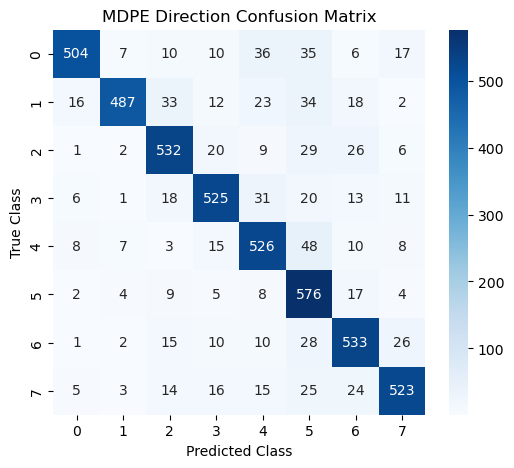


Per-Class Accuracy (%):
class_true
0    80.64
1    77.92
2    85.12
3    84.00
4    84.16
5    92.16
6    85.28
7    83.68
Name: class_correct, dtype: float64


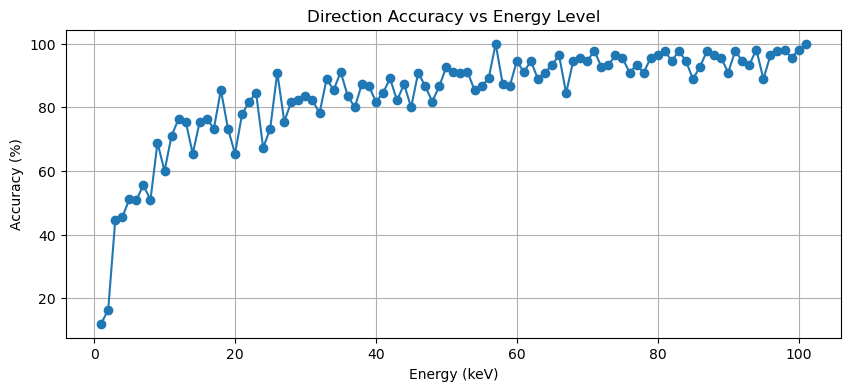


Saved per-class + energy breakdown CSVs.


In [88]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Load results
path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec27_EmbeddingNetHailMary_eval.csv"
df = pd.read_csv(path)

print("Loaded:", df.shape, "rows")
print(df.head())

# =========================
# Overall Accuracy
# =========================
acc = df["class_correct"].mean() * 100
print(f"\nDirection Accuracy: {acc:.2f}%")

# =========================
# Confusion Matrix
# =========================
cm = confusion_matrix(df["class_true"], df["class_pred"])
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=range(8), yticklabels=range(8))
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.title("MDPE Direction Confusion Matrix")
plt.show()

# =========================
# Per-Class Accuracy Breakdown
# =========================
class_acc = df.groupby("class_true")["class_correct"].mean() * 100
print("\nPer-Class Accuracy (%):")
print(class_acc)

# =========================
# Accuracy vs Energy
# =========================
df["energy_bin"] = df["energy_true"].round(0)  # 1 keV bins
energy_acc = df.groupby("energy_bin")["class_correct"].mean() * 100

plt.figure(figsize=(10,4))
plt.plot(energy_acc.index, energy_acc.values, marker="o")
plt.xlabel("Energy (keV)")
plt.ylabel("Accuracy (%)")
plt.title("Direction Accuracy vs Energy Level")
plt.grid(True)
plt.show()

# =========================
# Save breakdown tables
# =========================
class_acc.to_csv("class_accuracy_breakdown.csv")
energy_acc.to_csv("accuracy_vs_energy.csv")
print("\nSaved per-class + energy breakdown CSVs.")

In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. SETUP
# ==========================================
# Replace with the actual path to your latest results CSV
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec25mdpe8_eval_results.csv"

try:
    df = pd.read_csv(results_path)
    print(f"Loaded {len(df)} predictions from {results_path}")
except FileNotFoundError:
    print("Error: File not found. Please check the path.")
    exit()

# ==========================================
# 2. CONFIGURATION
# ==========================================
# Define energy bins (in keV)
# 0-10 is "Blob Zone" (Expect low accuracy)
# 50+ is "Needle Zone" (Expect high accuracy)
bins = [0, 10, 30, 50, 100, 1000]
labels = ["0-10 keV", "10-30 keV", "30-50 keV", "50-100 keV", "100+ keV"]

# Ensure columns are numeric
df["true_energy"] = pd.to_numeric(df["true_energy"])
df["true_angle_class"] = df["true_angle_class"].astype(int)
df["predicted_angle_class"] = df["predicted_angle_class"].astype(int)

# ==========================================
# 3. CALCULATE ACCURACY PER BIN
# ==========================================
df["energy_bin"] = pd.cut(df["true_energy"], bins=bins, labels=labels)

results = []

print("\n" + "="*55)
print(f"{'Energy Range':<15} | {'Accuracy':<10} | {'Tracks':<10} | {'Status'}")
print("="*55)

for label in labels:
    subset = df[df["energy_bin"] == label]
    
    if len(subset) == 0:
        print(f"{label:<15} | {'N/A':<10} | {0:<10} | -")
        continue
        
    # Calculate exact matches
    correct = (subset["true_angle_class"] == subset["predicted_angle_class"]).sum()
    total = len(subset)
    acc = (correct / total) * 100
    
    # Simple status flag
    if acc > 85: status = "EXCELLENT"
    elif acc > 70: status = "GOOD"
    elif acc > 50: status = "OKAY"
    else: status = "BLOB NOISE"
    
    results.append(acc)
    print(f"{label:<15} | {acc:.2f}%     | {total:<10} | {status}")

print("="*55 + "\n")

# ==========================================
# 4. PLOT THE TREND
# ==========================================
plt.figure(figsize=(10, 6))
bars = plt.bar(labels, results, color='#2c7bb6', edgecolor='black', alpha=0.8)

# Add threshold line
plt.axhline(y=80, color='r', linestyle='--', label="80% Target")
plt.axhline(y=12.5, color='gray', linestyle=':', label="Random Guess (12.5%)")

# Labels
plt.title("Directional Accuracy by Energy Level", fontsize=14)
plt.ylabel("Accuracy (%)", fontsize=12)
plt.xlabel("Incident Energy (keV)", fontsize=12)
plt.ylim(0, 105)
plt.legend()
plt.grid(axis='y', alpha=0.3)

# Add values on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 2, f"{yval:.1f}%", ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

Loaded 5000 predictions from /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec25mdpe8_eval_results.csv


KeyError: 'true_energy'

Preprocessing tracks to extract 30D features...
[MDPE] Preprocessed 199964 tracks. Dim: 30 (30D)
Training Random Forest models for importance ranking...


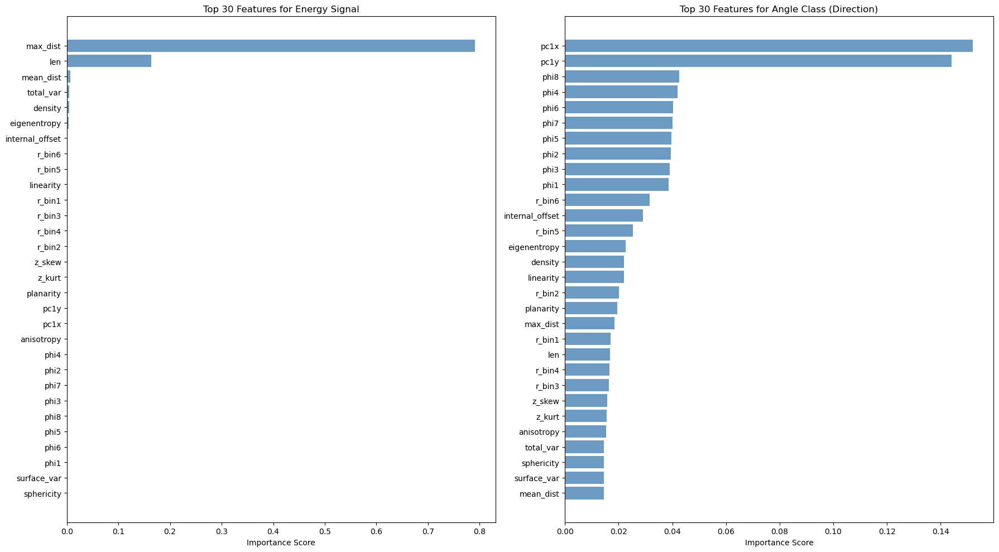

In [70]:
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

# ============================================================
# 1. LOAD AND PREPROCESS A SUBSET
# ============================================================
# Replace with your actual path. We use a subset (e.g., 25k) for speed.
TRAIN_CSV = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_TRAIN_200k_ROTATED.csv" 

print("Preprocessing tracks to extract 30D features...")
x_train, theta_train, _, _, _ = preprocess_mdpe(TRAIN_CSV)

# Convert tensors to numpy for Scikit-Learn
X = x_train.numpy()
y_energy = theta_train.numpy()[:, 0]
y_angle = theta_train.numpy()[:, 1]

# ============================================================
# 2. DEFINE FEATURE NAMES (Must match the 30D assembly order)
# ============================================================
f_names = [
    "len", "mean_dist", "max_dist",                     # Scale (3)
    "r_bin1", "r_bin2", "r_bin3", "r_bin4", "r_bin5", "r_bin6", # Radial (6)
    "phi1", "phi2", "phi3", "phi4", "phi5", "phi6", "phi7", "phi8", # Phi (8)
    "linearity", "planarity", "sphericity",             # PCA Shapes (3)
    "anisotropy", "surface_var", "eigenentropy",        # PCA Shapes (3)
    "pc1x", "pc1y",                                     # Directed Spine (2)
    "total_var", "z_skew", "z_kurt",                    # Moments (3)
    "internal_offset", "density"                        # Specificity (2)
]

# ============================================================
# 3. RUN FEATURE IMPORTANCE ANALYSIS
# ============================================================
print("Training Random Forest models for importance ranking...")
# Energy uses a Regressor; Angle Class uses a Classifier
rf_e = RandomForestRegressor(n_estimators=100, n_jobs=-1, random_state=42).fit(X, y_energy)
rf_a = RandomForestClassifier(n_estimators=100, n_jobs=-1, random_state=42).fit(X, y_angle)

# ============================================================
# 4. VISUALIZE RESULTS
# ============================================================
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))

for ax, model, title in zip([ax1, ax2], [rf_e, rf_a], ["Energy Signal", "Angle Class (Direction)"]):
    importances = model.feature_importances_
    indices = np.argsort(importances)
    ax.barh(range(len(indices)), importances[indices], color='steelblue', alpha=0.8)
    ax.set_yticks(range(len(indices)))
    ax.set_yticklabels([f_names[i] for i in indices])
    ax.set_title(f"Top 30 Features for {title}")
    ax.set_xlabel("Importance Score")

plt.tight_layout()
plt.show()

Loaded 5000 predictions from /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec27_EmbeddingNetHailMary_eval.csv

Energy Range    | Accuracy   | Tracks     | Status
0-1 keV         | 0.00%     | 5          | NOISE LIMIT
1-5 keV         | 35.50%     | 200        | STRUGGLING
5-10 keV        | 56.00%     | 250        | OKAY
10-30 keV       | 76.10%     | 1000       | GREAT
30-50 keV       | 85.30%     | 1000       | EXCELLENT
50-100 keV      | 93.48%     | 2500       | EXCELLENT
100+ keV        | 97.78%     | 45         | EXCELLENT



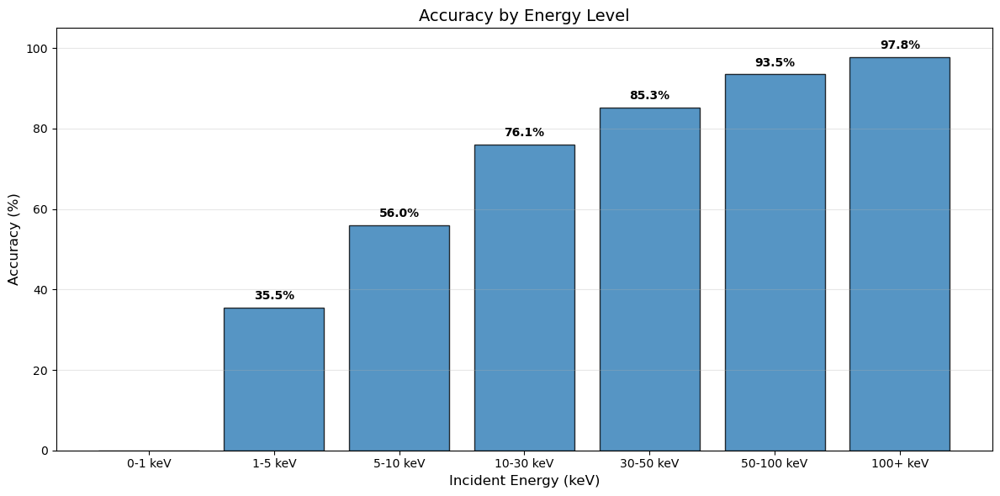

In [91]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. SETUP
# ==========================================
# Replace with the actual path to your results CSV
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec27_EmbeddingNetHailMary_eval.csv"

try:
    df = pd.read_csv(results_path)
    print(f"Loaded {len(df)} predictions from {results_path}")
except FileNotFoundError:
    print("Error: File not found. Please check the path.")
    exit()

# ==========================================
# 2. CONFIGURATION (UPDATED PER DR. ANG)
# ==========================================
# Dr. Ang requested breakdown of <10 keV: 0-1, 1-5, 5-10.
# We keep the higher bins to show the full trend.
bins = [0, 1, 5, 10, 30, 50, 100, 1000]
labels = [
    "0-1 keV", 
    "1-5 keV", 
    "5-10 keV", 
    "10-30 keV", 
    "30-50 keV", 
    "50-100 keV", 
    "100+ keV"
]

# Ensure columns are numeric using YOUR column names
df["energy_true"] = pd.to_numeric(df["energy_true"], errors='coerce')
df["class_true"] = df["class_true"].astype(int)
df["class_pred"] = df["class_pred"].astype(int)

# ==========================================
# 3. CALCULATE ACCURACY PER BIN
# ==========================================
# Binning based on 'energy_true'
df["energy_bin"] = pd.cut(df["energy_true"], bins=bins, labels=labels)

results = []

print("\n" + "="*55)
print(f"{'Energy Range':<15} | {'Accuracy':<10} | {'Tracks':<10} | {'Status'}")
print("="*55)

for label in labels:
    subset = df[df["energy_bin"] == label]
    
    if len(subset) == 0:
        print(f"{label:<15} | {'N/A':<10} | {0:<10} | -")
        results.append(0) # Append 0 to keep plot alignment
        continue
        
    # Calculate exact matches using 'class_true' and 'class_pred'
    correct = (subset["class_true"] == subset["class_pred"]).sum()
    total = len(subset)
    acc = (correct / total) * 100
    
    # Simple status flag
    if acc > 85: status = "EXCELLENT"
    elif acc > 75: status = "GREAT"
    elif acc > 50: status = "OKAY"
    elif acc > 25: status = "STRUGGLING"
    else: status = "NOISE LIMIT"
    
    results.append(acc)
    print(f"{label:<15} | {acc:.2f}%     | {total:<10} | {status}")

print("="*55 + "\n")

# ==========================================
# 4. PLOT THE TREND
# ==========================================
plt.figure(figsize=(12, 6)) # Made figure slightly wider for more bins
bars = plt.bar(labels, results, color='#2c7bb6', edgecolor='black', alpha=0.8)

# Labels
plt.title("Accuracy by Energy Level", fontsize=14)
plt.ylabel("Accuracy (%)", fontsize=12)
plt.xlabel("Incident Energy (keV)", fontsize=12)
plt.ylim(0, 105)
plt.grid(axis='y', alpha=0.3)

# Add values on top of bars
for bar in bars:
    yval = bar.get_height()
    # Only plot text if bar height is > 0
    if yval > 0:
        plt.text(bar.get_x() + bar.get_width()/2, yval + 2, f"{yval:.1f}%", ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

Loading results...
Loading raw point cloud data...
Raw Data Columns: ['x', 'y', 'z', 'ion #', 'energy', 'energy_keV', 'angle_class', 'theta_deg', 'cos_theta', 'sin_theta']
Found 241 failed tracks < 10 keV.


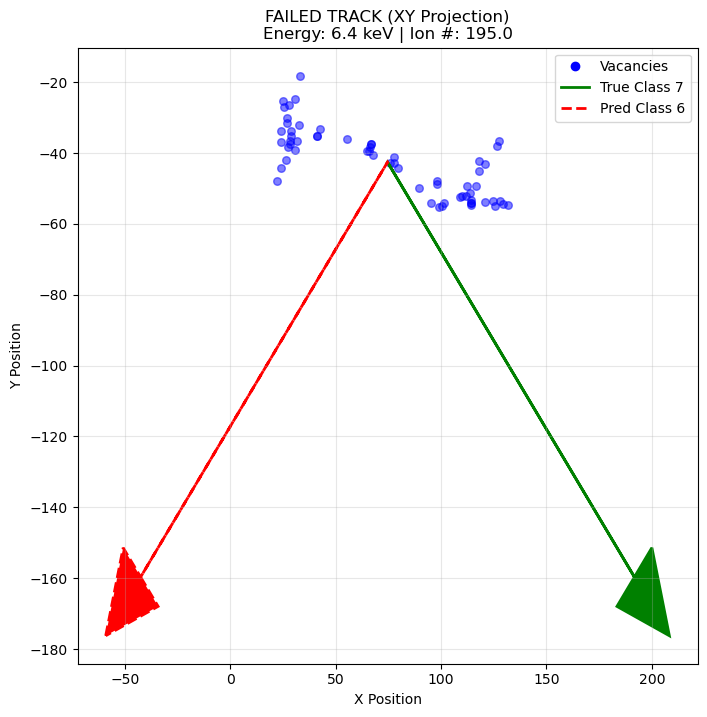

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. FILE PATHS
# ==========================================
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec27_EmbeddingNetHailMary_eval.csv"
raw_data_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_5k_ROTATED.csv"

# ==========================================
# 2. LOAD DATA
# ==========================================
print("Loading results...")
df_results = pd.read_csv(results_path)

print("Loading raw point cloud data...")
df_raw = pd.read_csv(raw_data_path)

# Print columns to confirm we have 'ion #' and 'energy_keV'
print(f"Raw Data Columns: {df_raw.columns.tolist()}")

# ==========================================
# 3. SETUP PLOTTING VECTORS (XY Projection)
# ==========================================
# We define the XY components of your octants.
# Note: This ignores Z. So Class 0 (+,+,+) and Class 4 (+,+,-) 
# will both point Top-Right in this 2D view.
octant_vectors_2d = {
    0: [1, 1],   1: [-1, 1],
    2: [-1, -1], 3: [1, -1],
    4: [1, 1],   5: [-1, 1],
    6: [-1, -1], 7: [1, -1]
}

def get_raw_points(energy_val, ion_val):
    """
    Finds the points using the CORRECT column names from your screenshot:
    'ion #' for the ID and 'energy_keV' for energy.
    """
    # Filter using 'ion #' and 'energy_keV'
    subset = df_raw[
        (df_raw['ion #'] == ion_val) & 
        (np.isclose(df_raw['energy_keV'], energy_val, atol=1e-3))
    ]
    
    if len(subset) == 0:
        print(f"WARNING: No points found for Ion {ion_val} at {energy_val} keV")
        return np.empty((0, 2)) # Return empty 2D array
    
    return subset[['x', 'y']].values # Only grab X and Y

# ==========================================
# 4. SELECT & PLOT
# ==========================================
# Filter for failures at Low Energy
failures = df_results[
    (df_results['class_true'] != df_results['class_pred']) & 
    (df_results['energy_true'] < 10)
]

print(f"Found {len(failures)} failed tracks < 10 keV.")

if len(failures) > 0:
    # Pick random failure
    row = failures.sample(1).iloc[0]
    
    # Get IDs from RESULTS file
    target_energy = row['energy_true']
    target_ion = row['ion_number'] # Results file calls it 'ion_number'
    
    true_cls = int(row['class_true'])
    pred_cls = int(row['class_pred'])
    
    # Get Points from RAW file
    points = get_raw_points(target_energy, target_ion)
    
    if len(points) > 0:
        # --- 2D PLOT SETUP ---
        fig, ax = plt.subplots(figsize=(8, 8))
        
        # 1. Plot the Cloud (Scatter)
        ax.scatter(points[:,0], points[:,1], c='blue', alpha=0.5, s=30, label='Vacancies')
        
        # Center the arrows on the cloud mean
        center = np.mean(points, axis=0)
        
        # Scale arrows to fit the plot
        scale = np.max(np.std(points, axis=0)) * 3
        if scale == 0: scale = 1 # Safety for single points
        
        # 2. True Vector (Green)
        v_true = octant_vectors_2d.get(true_cls)
        ax.arrow(center[0], center[1], v_true[0]*scale, v_true[1]*scale, 
                 head_width=scale*0.2, head_length=scale*0.2, fc='green', ec='green', linewidth=2, label=f'True: {true_cls}')
        
        # 3. Pred Vector (Red)
        v_pred = octant_vectors_2d.get(pred_cls)
        ax.arrow(center[0], center[1], v_pred[0]*scale, v_pred[1]*scale, 
                 head_width=scale*0.2, head_length=scale*0.2, fc='red', ec='red', linewidth=2, linestyle='dashed', label=f'Pred: {pred_cls}')
        
        # Formatting
        ax.set_title(f"FAILED TRACK (XY Projection)\nEnergy: {target_energy} keV | Ion #: {target_ion}")
        ax.set_xlabel("X Position")
        ax.set_ylabel("Y Position")
        ax.grid(True, alpha=0.3)
        
        # Custom Legend to handle arrows
        from matplotlib.lines import Line2D
        custom_lines = [Line2D([0], [0], color='blue', marker='o', linestyle='None'),
                        Line2D([0], [0], color='green', lw=2),
                        Line2D([0], [0], color='red', lw=2, linestyle='--')]
        ax.legend(custom_lines, ['Vacancies', f'True Class {true_cls}', f'Pred Class {pred_cls}'])
        
        plt.show()
    else:
        print("Could not plot: No points found.")
else:
    print("No failures found!")

Loading results...
Loading raw point cloud data...
Scanning Band: 0-10 keV


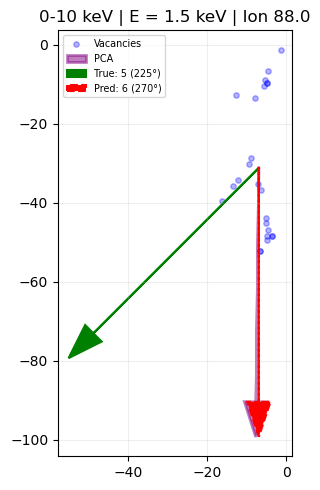

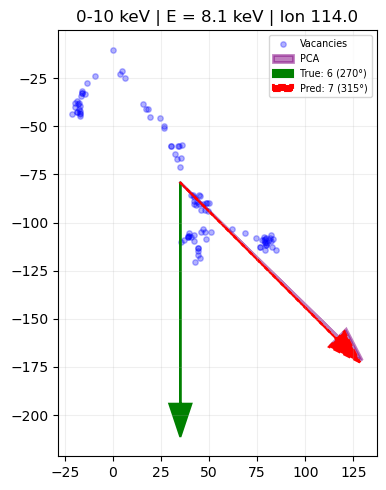

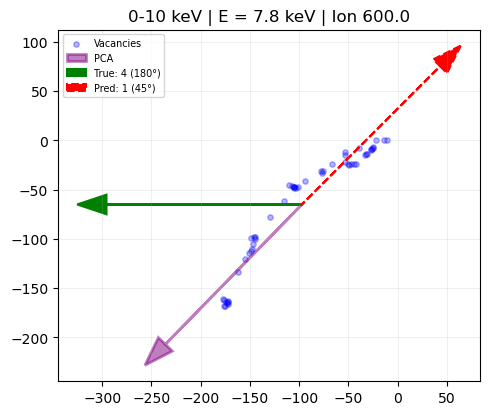

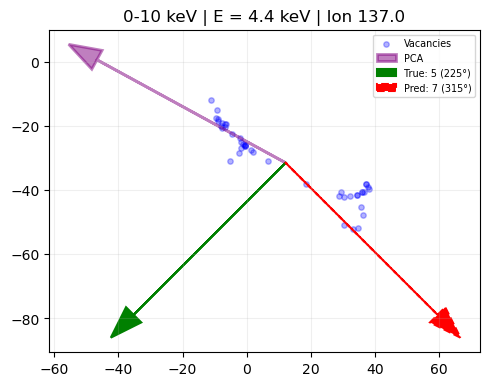

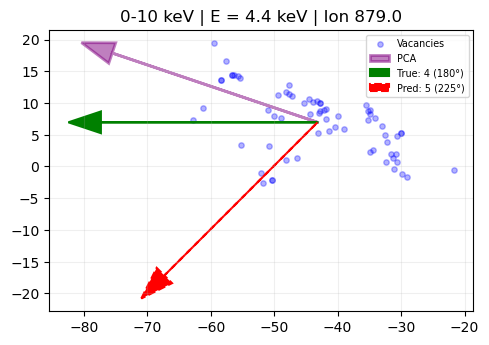

Scanning Band: 10-30 keV


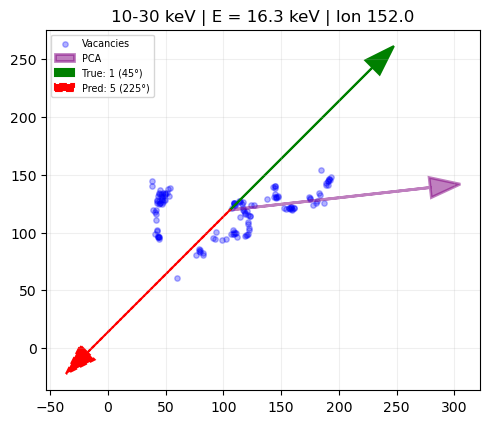

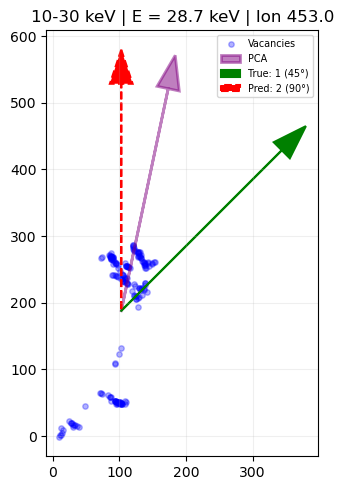

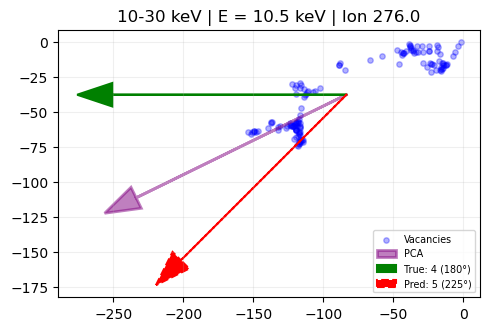

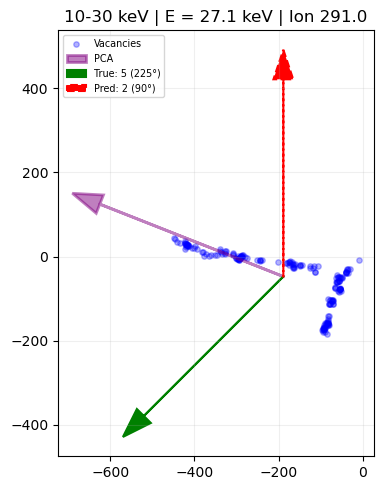

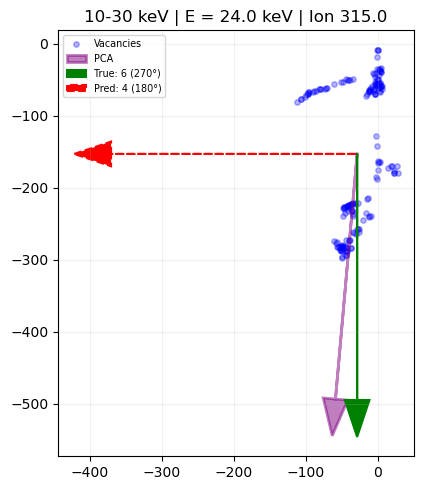

Scanning Band: 30-70 keV


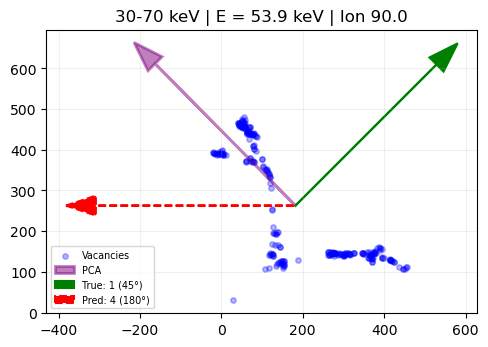

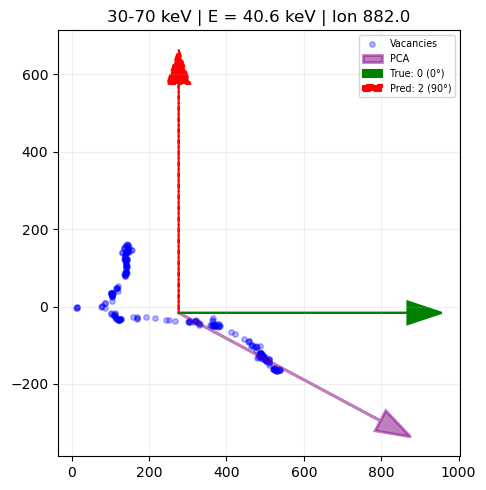

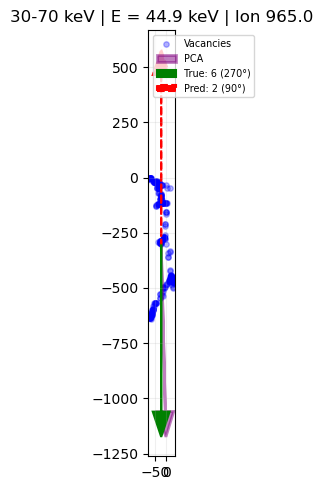

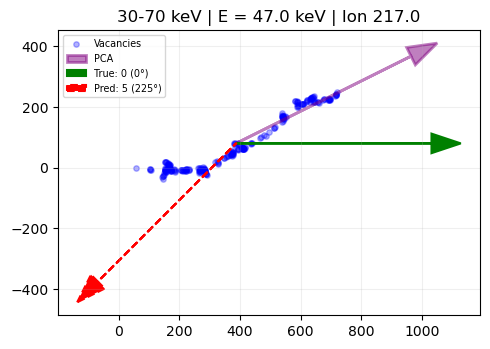

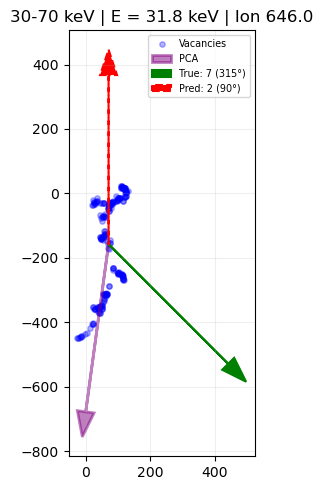

Scanning Band: 70-100 keV


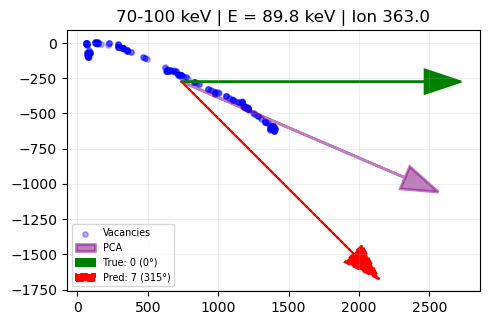

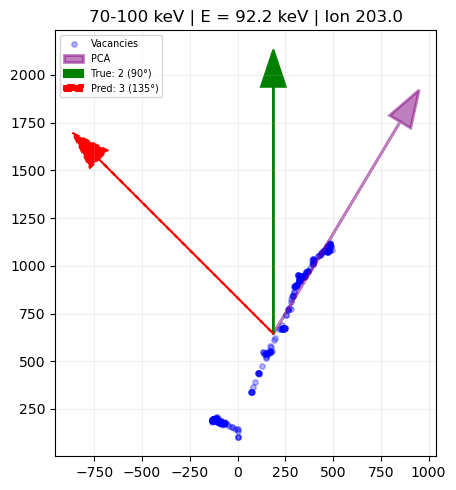

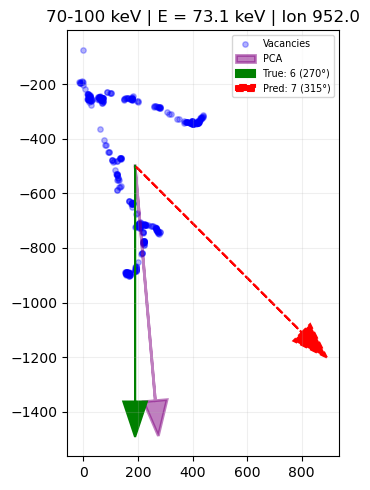

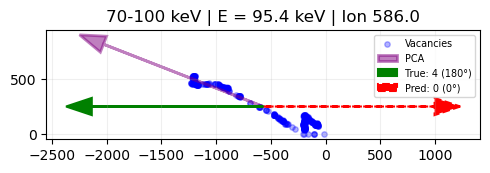

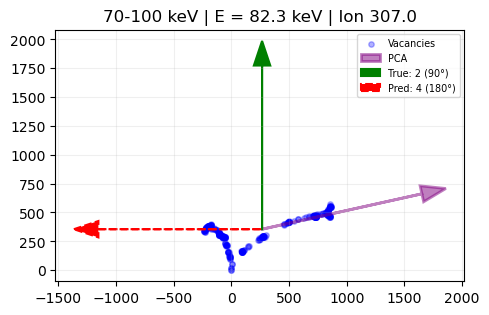

Scanning Band: >100 keV


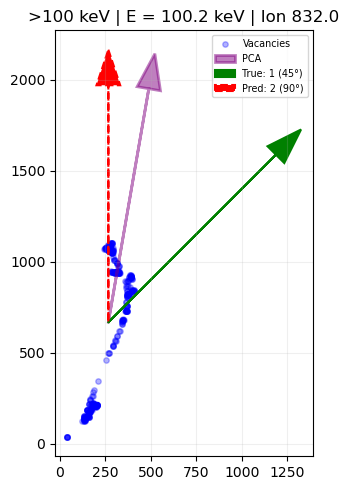

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# ==========================================
# 1. FILE PATHS
# ==========================================
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec27_EmbeddingNetHailMary_eval.csv"
raw_data_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_5k_ROTATED.csv"

# ==========================================
# 2. SETUP & DATA LOADING
# ==========================================
print("Loading results...")
df_results = pd.read_csv(results_path)

print("Loading raw point cloud data...")
df_raw = pd.read_csv(raw_data_path)

# Correct Angle Bins (Pie Slices)
ANGLE_BINS = np.array([0, 45, 90, 135, 180, 225, 270, 315])

def get_class_vector(class_idx):
    """Converts Class ID (0-7) -> Unit Vector (x, y)"""
    class_idx = int(class_idx)
    if class_idx < 0 or class_idx >= len(ANGLE_BINS): return [0, 0]
    angle_rad = np.radians(ANGLE_BINS[class_idx])
    return np.array([np.cos(angle_rad), np.sin(angle_rad)])

def get_raw_points(energy_val, ion_val):
    """Fetches (x,y) points for a specific track"""
    subset = df_raw[
        (df_raw['ion #'] == ion_val) & 
        (np.isclose(df_raw['energy_keV'], energy_val, atol=1e-3))
    ]
    return subset[['x', 'y']].values

# ==========================================
# 3. DEFINE THE 5 BANDS
# ==========================================
bands = [
    (0, 10, "0-10 keV (Noise Zone)"),
    (10, 30, "10-30 keV (The Battleground)"),
    (30, 70, "30-70 keV (Mid-Range)"),
    (70, 100, "70-100 keV (High Energy)"),
    (100, 2000, "100+ keV (The Easy Wins)")
]

# ==========================================
# 4. GENERATE 5 PLOTS PER BAND
# ==========================================
for min_e, max_e, label in bands:
    print(f"\n{'='*40}")
    print(f"Scanning Band: {label}")
    print(f"{'='*40}")
    
    # Filter for failures in this range
    failures = df_results[
        (df_results['class_true'] != df_results['class_pred']) & 
        (df_results['energy_true'] >= min_e) & 
        (df_results['energy_true'] < max_e)
    ]
    
    count = len(failures)
    if count == 0:
        print(f"  -> No failures found in {label}! (Model is perfect here)")
        continue
        
    print(f"  -> Found {count} failures. Showing 5 examples...")

    # Select up to 5 random failures
    n_samples = min(5, count)
    sample_rows = failures.sample(n_samples)

    for i, (_, row) in enumerate(sample_rows.iterrows()):
        target_energy = row['energy_true']
        target_ion = row['ion_number']
        true_cls = int(row['class_true'])
        pred_cls = int(row['class_pred'])
        
        points = get_raw_points(target_energy, target_ion)
        
        if len(points) < 5:
            continue

        # --- PLOTTING ---
        fig, ax = plt.subplots(figsize=(6, 6))
        
        # 1. Vacancies
        ax.scatter(points[:,0], points[:,1], c='blue', alpha=0.4, s=20, label='Vacancies')
        
        # Center & Scale
        center = np.mean(points, axis=0)
        scale = np.max(np.std(points, axis=0)) * 3.5
        if scale == 0: scale = 1
        
        # 2. PCA (Purple - Math Axis)
        pca = PCA(n_components=2)
        pca.fit(points)
        v_pca = pca.components_[0]
        v_true_unit = get_class_vector(true_cls)
        if np.dot(v_pca, v_true_unit) < 0: v_pca = -v_pca
        
        ax.arrow(center[0], center[1], v_pca[0]*scale, v_pca[1]*scale, 
                 head_width=scale*0.15, color='purple', linewidth=3, alpha=0.5, label='PCA')

        # 3. True Vector (Green)
        v_true = get_class_vector(true_cls)
        ax.arrow(center[0], center[1], v_true[0]*scale, v_true[1]*scale, 
                 head_width=scale*0.15, fc='green', ec='green', linewidth=2.5, 
                 label=f'True: {true_cls} ({ANGLE_BINS[true_cls]}°)')
        
        # 4. Pred Vector (Red)
        v_pred = get_class_vector(pred_cls)
        ax.arrow(center[0], center[1], v_pred[0]*scale, v_pred[1]*scale, 
                 head_width=scale*0.15, fc='red', ec='red', linewidth=2.5, linestyle='--', 
                 label=f'Pred: {pred_cls} ({ANGLE_BINS[pred_cls]}°)')

        ax.set_title(f"[{label}] Ex {i+1}/{n_samples}\nEnergy: {target_energy:.1f} keV | Ion #: {target_ion}")
        ax.legend(loc='lower right', fontsize='small')
        ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        

Loading results...
Loading raw point cloud data...

Scanning Band: 0-10 keV (Target: 25)
  -> Generating 25 plots...


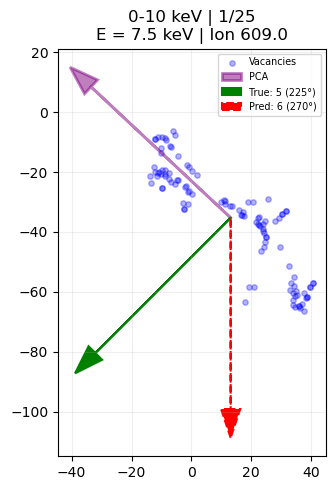

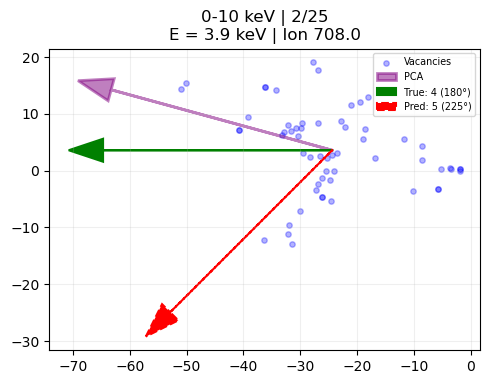

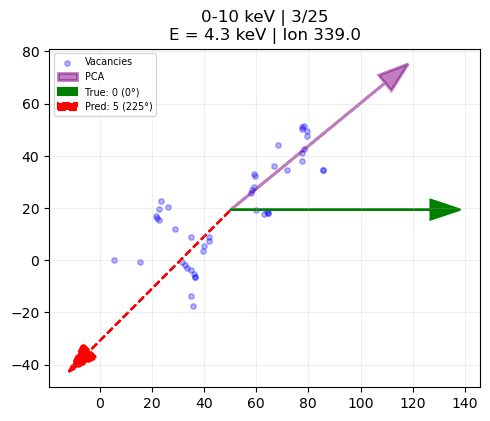

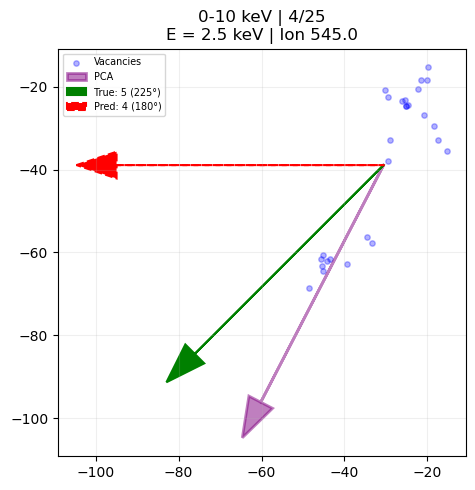

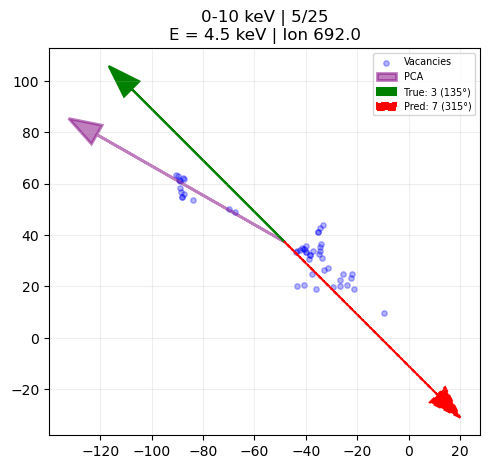

...

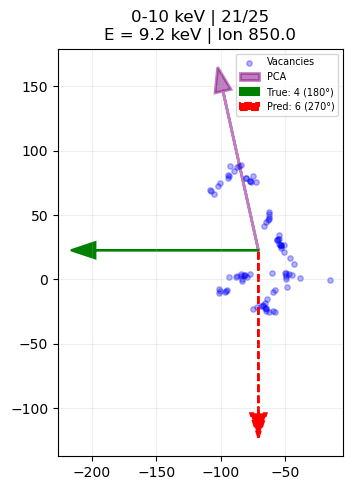

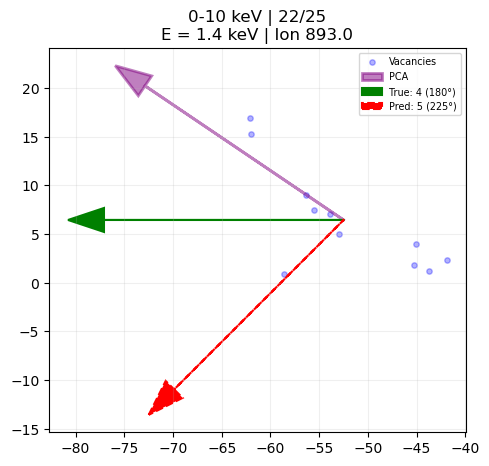

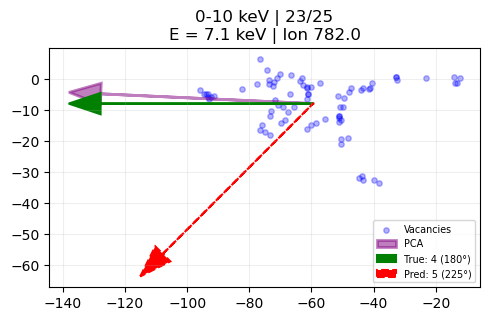

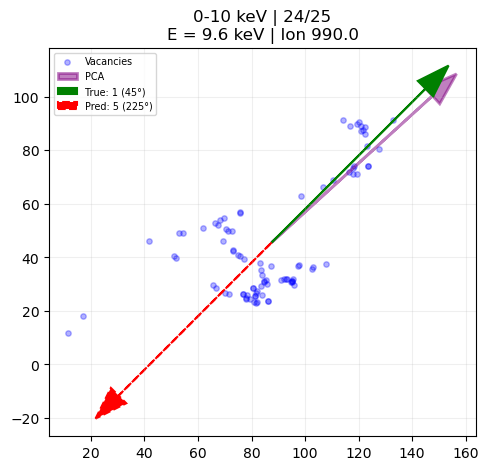

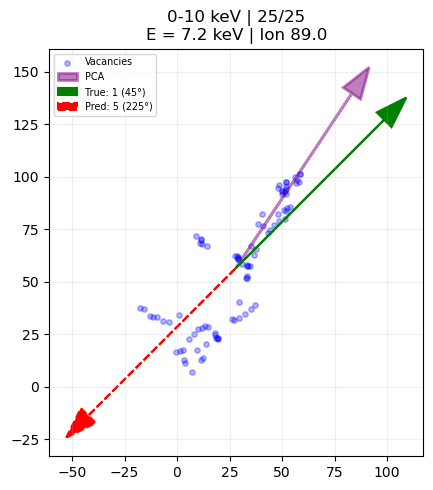


Scanning Band: 10-30 keV (Target: 25)
  -> Generating 25 plots...


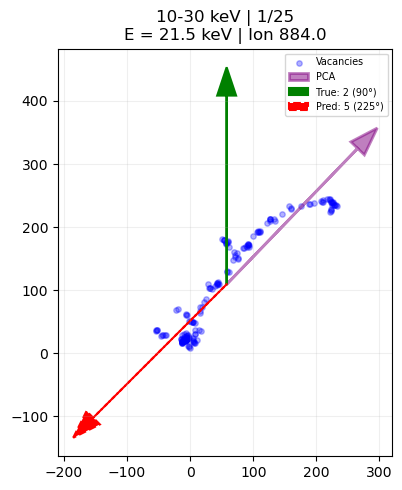

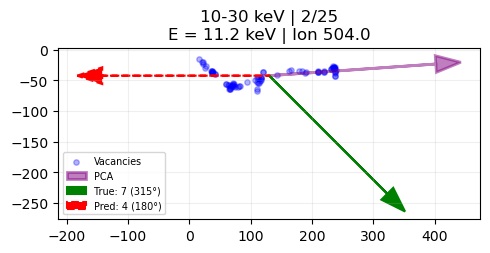

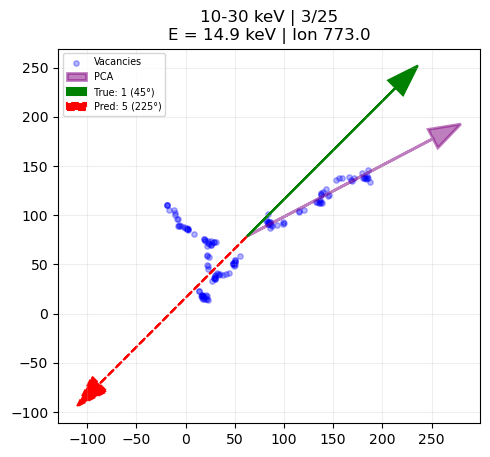

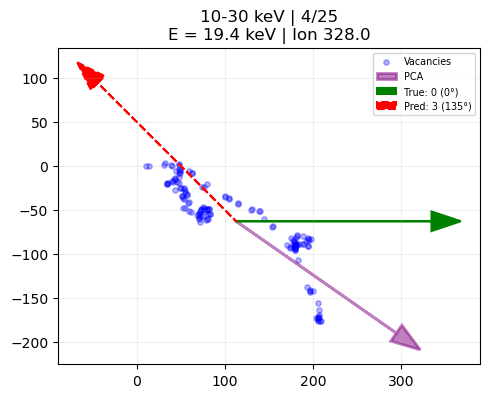

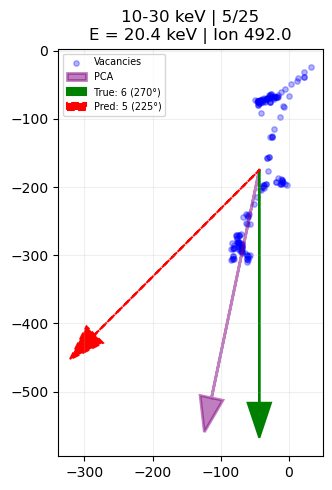

...

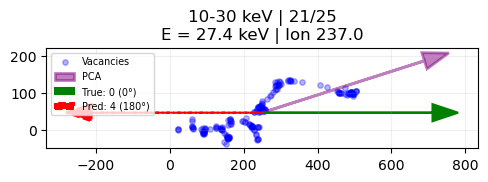

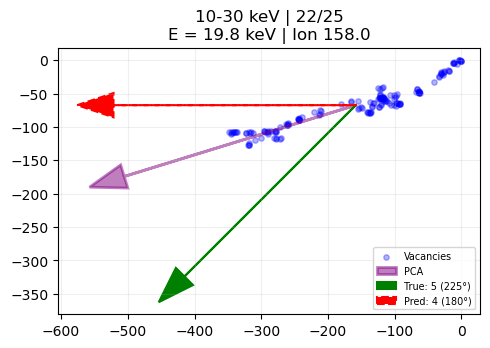

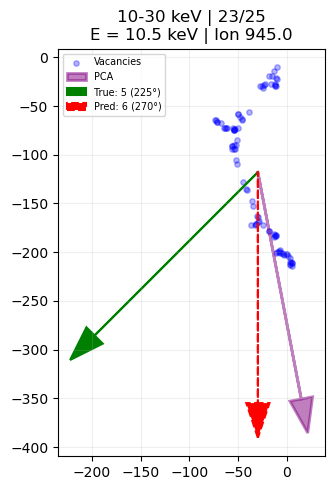

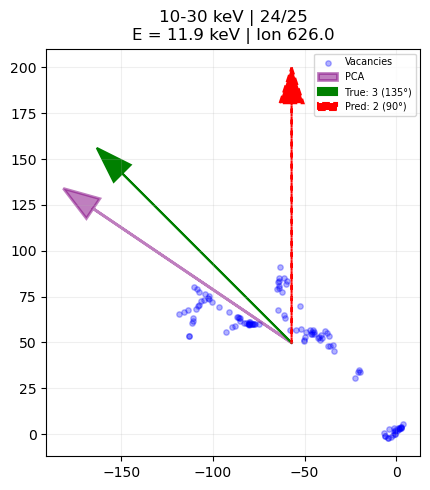

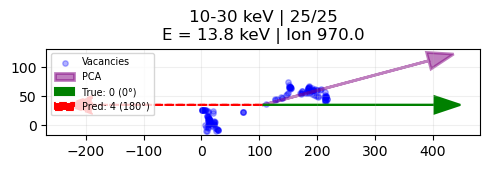


Scanning Band: 30-70 keV (Target: 5)
  -> Generating 5 plots...


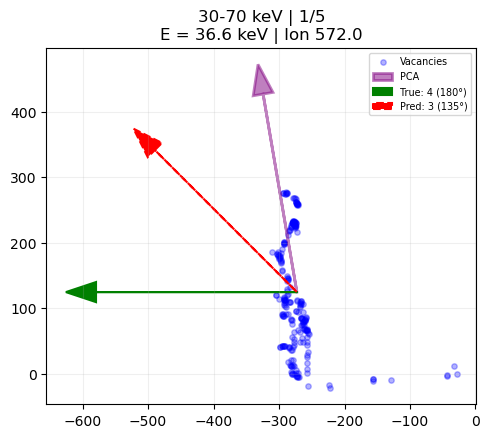

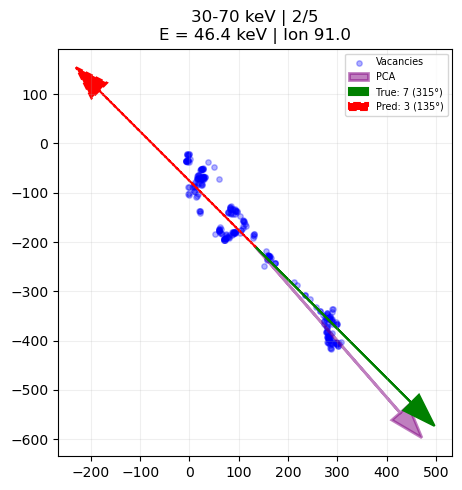

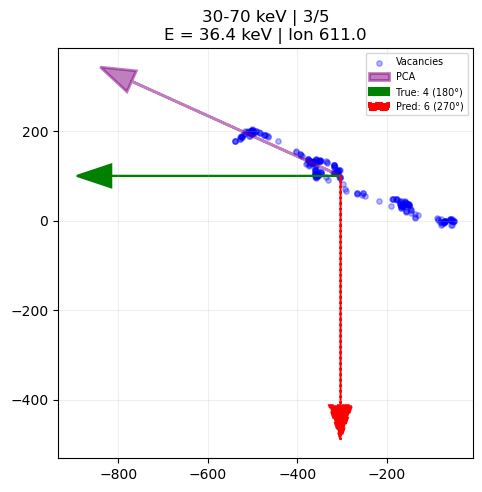

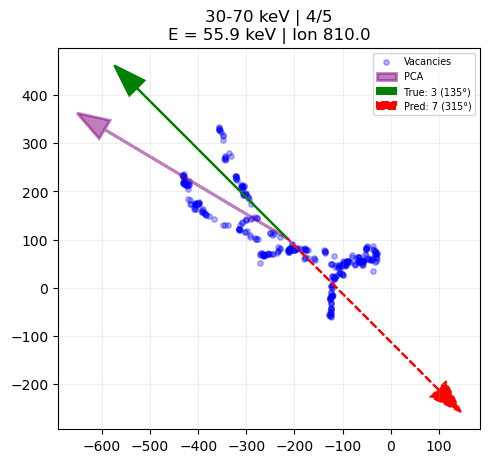

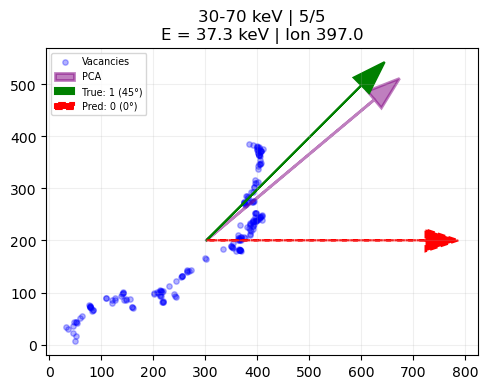


Scanning Band: 70-100 keV (Target: 5)
  -> Generating 5 plots...


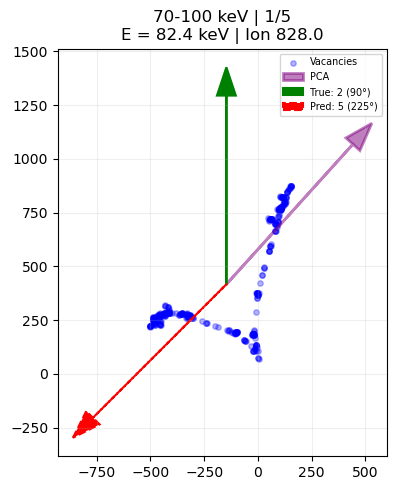

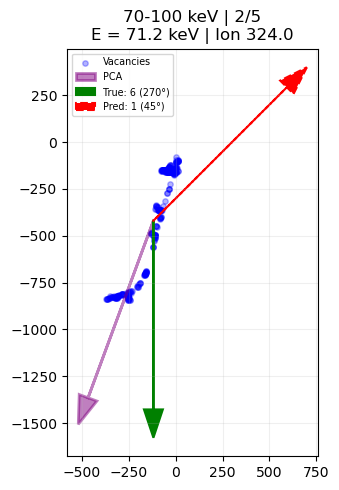

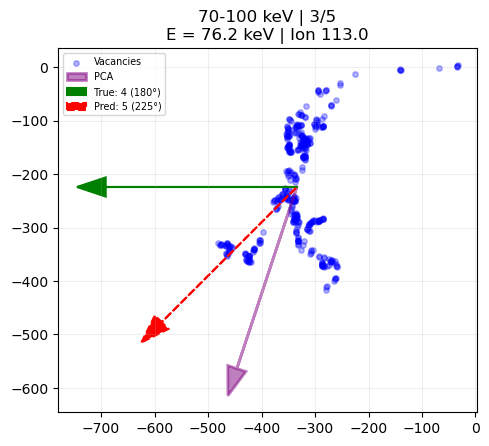

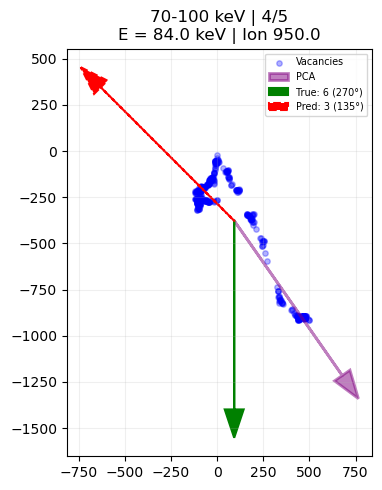

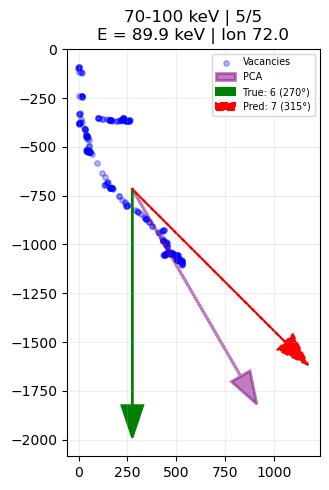


Scanning Band: >100 keV (Target: 5)
  -> Generating 1 plots...


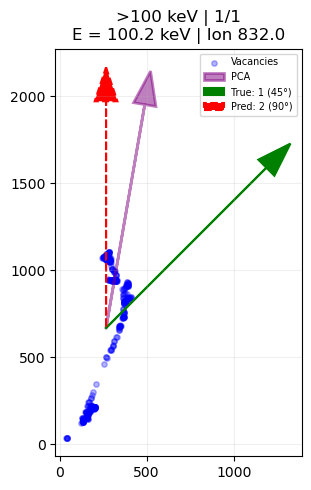

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# ==========================================
# 1. FILE PATHS
# ==========================================
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec27_EmbeddingNetHailMary_eval.csv"
raw_data_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_5k_ROTATED.csv"

# ==========================================
# 2. SETUP & DATA LOADING
# ==========================================
print("Loading results...")
df_results = pd.read_csv(results_path)

print("Loading raw point cloud data...")
df_raw = pd.read_csv(raw_data_path)

ANGLE_BINS = np.array([0, 45, 90, 135, 180, 225, 270, 315])

def get_class_vector(class_idx):
    """Converts Class ID (0-7) -> Unit Vector (x, y)"""
    class_idx = int(class_idx)
    if class_idx < 0 or class_idx >= len(ANGLE_BINS): return [0, 0]
    angle_rad = np.radians(ANGLE_BINS[class_idx])
    return np.array([np.cos(angle_rad), np.sin(angle_rad)])

def get_raw_points(energy_val, ion_val):
    """Fetches (x,y) points for a specific track"""
    subset = df_raw[
        (df_raw['ion #'] == ion_val) & 
        (np.isclose(df_raw['energy_keV'], energy_val, atol=1e-3))
    ]
    return subset[['x', 'y']].values

# ==========================================
# 3. DEFINE BANDS & SAMPLE SIZES
# ==========================================
# Format: (Min Energy, Max Energy, Label, Sample Count)
bands = [
    (0, 10, "0-10 keV", 25),      # <--- 25 Examples requested
    (10, 30, "10-30 keV", 25),    # <--- 25 Examples requested
    (30, 70, "30-70 keV", 5),     # Keep others manageable
    (70, 100, "70-100 keV", 5),
    (100, 2000, ">100 keV", 5)
]

# ==========================================
# 4. GENERATE PLOTS
# ==========================================
for min_e, max_e, label, target_count in bands:
    print(f"\nScanning Band: {label} (Target: {target_count})")
    
    # Filter for failures
    failures = df_results[
        (df_results['class_true'] != df_results['class_pred']) & 
        (df_results['energy_true'] >= min_e) & 
        (df_results['energy_true'] < max_e)
    ]
    
    count = len(failures)
    if count == 0:
        print(f"  -> No failures found in {label}.")
        continue

    # Select samples (up to target_count)
    n_samples = min(target_count, count)
    sample_rows = failures.sample(n_samples)
    
    print(f"  -> Generating {n_samples} plots...")

    for i, (_, row) in enumerate(sample_rows.iterrows()):
        target_energy = row['energy_true']
        target_ion = row['ion_number']
        true_cls = int(row['class_true'])
        pred_cls = int(row['class_pred'])
        
        points = get_raw_points(target_energy, target_ion)
        if len(points) < 5: continue

        # --- PLOTTING ---
        fig, ax = plt.subplots(figsize=(5, 5))
        
        # 1. Vacancies
        ax.scatter(points[:,0], points[:,1], c='blue', alpha=0.3, s=15, label='Vacancies')
        
        # Center & Scale
        center = np.mean(points, axis=0)
        scale = np.max(np.std(points, axis=0)) * 3.5
        if scale == 0: scale = 1
        
        # 2. PCA (Purple - Math Axis)
        pca = PCA(n_components=2)
        pca.fit(points)
        v_pca = pca.components_[0]
        v_true_unit = get_class_vector(true_cls)
        if np.dot(v_pca, v_true_unit) < 0: v_pca = -v_pca
        
        ax.arrow(center[0], center[1], v_pca[0]*scale, v_pca[1]*scale, 
                 head_width=scale*0.1, color='purple', linewidth=2, alpha=0.5, label='PCA')

        # 3. True Vector (Green) - THIN
        v_true = get_class_vector(true_cls)
        ax.arrow(center[0], center[1], v_true[0]*scale, v_true[1]*scale, 
                 head_width=scale*0.1, fc='green', ec='green', linewidth=1.5, 
                 label=f'True: {true_cls} ({ANGLE_BINS[true_cls]}°)')
        
        # 4. Pred Vector (Red) - THIN
        v_pred = get_class_vector(pred_cls)
        ax.arrow(center[0], center[1], v_pred[0]*scale, v_pred[1]*scale, 
                 head_width=scale*0.1, fc='red', ec='red', linewidth=1.5, linestyle='--', 
                 label=f'Pred: {pred_cls} ({ANGLE_BINS[pred_cls]}°)')

        # Standard Scientific Title
        ax.set_title(f"{label} | {i+1}/{n_samples}\nE = {target_energy:.1f} keV | Ion {target_ion}")
        ax.legend(loc='best', fontsize='x-small')
        ax.grid(True, alpha=0.2)
        ax.set_aspect('equal')
        
        plt.tight_layout()
        plt.show()

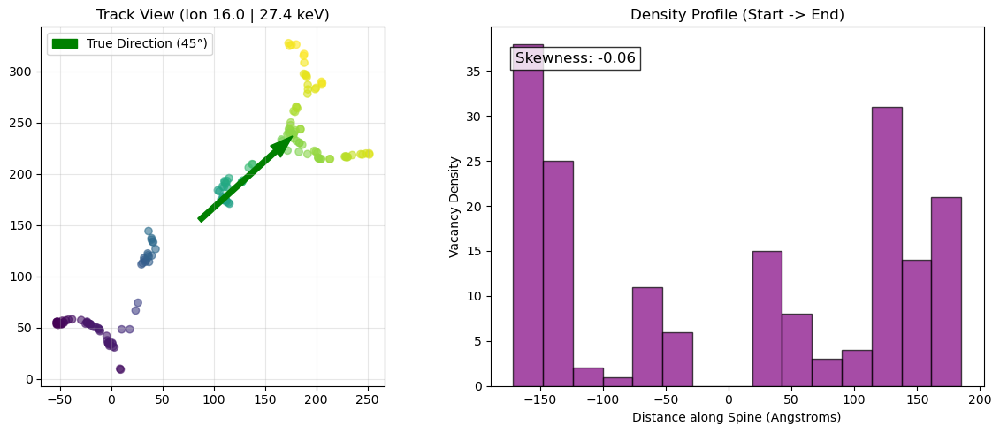

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# ==========================================
# 1. SETUP
# ==========================================
# Update paths if needed
df_raw = pd.read_csv("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_5k_ROTATED.csv")

# ==========================================
# 2. SELECT ION 16.0 (27.4 keV)
# ==========================================
target_ion = 16.0
target_energy = 27.4

subset = df_raw[
    (df_raw['ion #'] == target_ion) & 
    (np.isclose(df_raw['energy_keV'], target_energy, atol=1e-1))
]
points = subset[['x', 'y']].values

if len(points) == 0:
    print("Error: Track not found! Check your CSV path or Ion ID.")
    exit()

# ==========================================
# 3. COMPUTE DENSITY PROFILE
# ==========================================
# A. Find the Principal Axis (The "Line")
pca = PCA(n_components=1)
points_projected = pca.fit_transform(points).flatten()

# B. Orient it correctly (so "Positive" means "True Direction")
# True Class is 1 (45 deg, Top-Right). 
# We want the axis to align roughly with (1, 1).
# PCA sign is arbitrary, so we check dot product with (1, 1) vector.
v_pca = pca.components_[0]
v_true = [0.707, 0.707] # Unit vector for 45 deg

# If PCA points opposite to True, flip the projection
if np.dot(v_pca, v_true) < 0:
    points_projected = -points_projected
    v_pca = -v_pca

# ==========================================
# 4. PLOT
# ==========================================
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Plot 1: The Track (Visual Reference)
# Color by "Projected Distance" (Purple -> Yellow)
ax1.scatter(points[:,0], points[:,1], c=points_projected, cmap='viridis', alpha=0.6)
ax1.set_title(f"Track View (Ion {target_ion} | 27.4 keV)")
# Draw Arrow for True Direction
center = np.mean(points, axis=0)
ax1.arrow(center[0], center[1], v_pca[0]*100, v_pca[1]*100, 
          width=5, color='green', label='True Direction (45°)')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.set_aspect('equal')

# Plot 2: The Density Profile
# X-Axis: Start (Left) -> End (Right)
counts, bins, _ = ax2.hist(points_projected, bins=15, color='purple', alpha=0.7, edgecolor='black')
ax2.set_title("Density Profile (Start -> End)")
ax2.set_xlabel("Distance along Spine (Angstroms)")
ax2.set_ylabel("Vacancy Density")

# Calculate & Display Skewness
skew = (np.mean(points_projected) - np.median(points_projected))
# Also use Scipy's proper skew calculation for a robust number
from scipy.stats import skew as scipy_skew
robust_skew = scipy_skew(points_projected)

ax2.text(0.05, 0.9, f"Skewness: {robust_skew:.2f}", transform=ax2.transAxes, 
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8, edgecolor='black'))

plt.tight_layout()
plt.show()

Loading data...
Analyzing 2000 tracks in the 10-50 keV range...


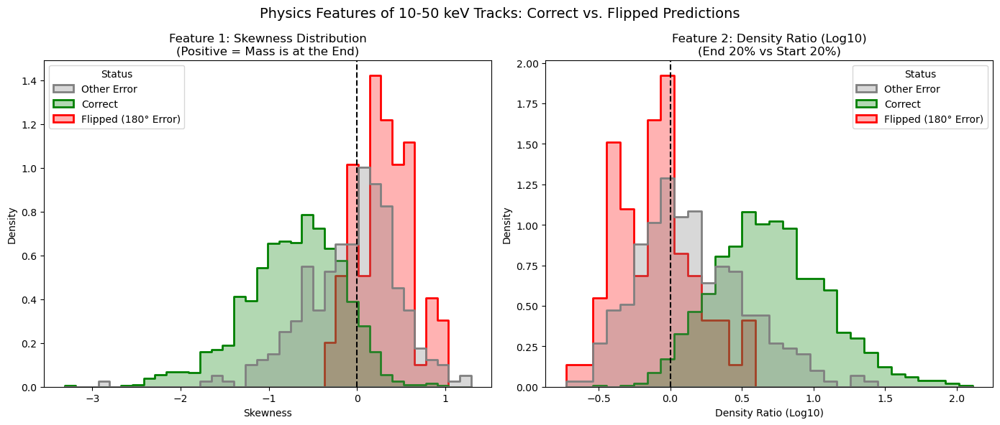


=== STATISTICS ===
[Correct] Mean Skewness: -0.725
[Correct] Mean Density Ratio (Log): 0.700
[Flipped (180° Error)] Mean Skewness: 0.297
[Flipped (180° Error)] Mean Density Ratio (Log): -0.094


In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from scipy.stats import skew
import seaborn as sns

# ==========================================
# 1. SETUP
# ==========================================
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec27_EmbeddingNetHailMary_eval.csv"
raw_data_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_5k_ROTATED.csv"

print("Loading data...")
df_results = pd.read_csv(results_path)
df_raw = pd.read_csv(raw_data_path)

# Filter for the "Danger Zone" (10 - 50 keV)
min_e, max_e = 10, 50
df_subset = df_results[
    (df_results['energy_true'] >= min_e) &
    (df_results['energy_true'] < max_e)
].copy()

print(f"Analyzing {len(df_subset)} tracks in the {min_e}-{max_e} keV range...")

# ==========================================
# 2. DEFINE METRIC CALCULATOR
# ==========================================
def calculate_metrics(points, v_true_unit):
    """
    Calculates physics metrics along the TRUE direction axis.
    """
    if len(points) < 5: return None

    # 1. Project points onto the Principal Axis
    pca = PCA(n_components=1)
    proj = pca.fit_transform(points).flatten()

    # 2. Align projection with True Direction
    # (So +x means "Towards the Tail")
    v_pca = pca.components_[0]
    if np.dot(v_pca, v_true_unit) < 0:
        proj = -proj

    # 3. Metric A: Skewness (Global Asymmetry)
    val_skew = skew(proj)

    # 4. Metric B: Density Ratio (Tail Density / Head Density)
    # Define Head (first 20%) and Tail (last 20%)
    p_min, p_max = np.min(proj), np.max(proj)
    length = p_max - p_min

    # Avoid zero-length crash
    if length == 0: return None

    tail_cut = p_max - 0.2 * length
    head_cut = p_min + 0.2 * length

    n_tail = np.sum(proj > tail_cut)
    n_head = np.sum(proj < head_cut)

    # Avoid div by zero
    density_ratio = n_tail / (n_head + 1e-9)

    return val_skew, density_ratio

# ==========================================
# 3. LOOP & CALCULATE
# ==========================================
metrics_data = []

ANGLE_BINS = np.array([0, 45, 90, 135, 180, 225, 270, 315])

for idx, row in df_subset.iterrows():
    E = row['energy_true']
    ion = row['ion_number']
    true_cls = int(row['class_true'])
    pred_cls = int(row['class_pred'])

    # Get Unit Vector for True Class
    angle_rad = np.radians(ANGLE_BINS[true_cls])
    v_true = np.array([np.cos(angle_rad), np.sin(angle_rad)])

    # Get Points
    try:
        track_pts = df_raw[
            (df_raw['ion #'] == ion) &
            (np.isclose(df_raw['energy_keV'], E, atol=1e-3))
        ][['x', 'y']].values
    except:
        continue

    if len(track_pts) < 5: continue

    res = calculate_metrics(track_pts, v_true)
    if res is None: continue

    s_val, d_ratio = res

    # Categorize Result
    if true_cls == pred_cls:
        status = "Correct"
    elif abs(true_cls - pred_cls) == 4: # 180 degree flip
        status = "Flipped (180° Error)"
    else:
        status = "Other Error"

    metrics_data.append({
        "Skewness": s_val,
        "Density_Ratio": np.log10(d_ratio + 1e-9), # Log scale for plotting
        "Status": status
    })

df_metrics = pd.DataFrame(metrics_data)

# ==========================================
# 4. PLOT DISTRIBUTIONS
# ==========================================
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Define colors
palette = {"Correct": "green", "Flipped (180° Error)": "red", "Other Error": "gray"}

# Plot A: Skewness
sns.histplot(data=df_metrics, x="Skewness", hue="Status",
             element="step", stat="density", common_norm=False,
             palette=palette, ax=axes[0], alpha=0.3, linewidth=2)
axes[0].set_title("Feature 1: Skewness Distribution\n(Positive = Mass is at the End)")
axes[0].axvline(0, color='black', linestyle='--')

# Plot B: Density Ratio (Log Scale)
sns.histplot(data=df_metrics, x="Density_Ratio", hue="Status",
             element="step", stat="density", common_norm=False,
             palette=palette, ax=axes[1], alpha=0.3, linewidth=2)
# UPDATED TITLE & LABEL
axes[1].set_title("Feature 2: Density Ratio (Log10)\n(End 20% vs Start 20%)")
axes[1].set_xlabel("Density Ratio (Log10)")
axes[1].axvline(0, color='black', linestyle='--') # 0 on log scale = Ratio of 1.0

# SIMPLIFIED MAIN TITLE
plt.suptitle("Physics Features of 10-50 keV Tracks: Correct vs. Flipped Predictions", fontsize=14)
plt.tight_layout()
plt.show()

# Stats
print("\n=== STATISTICS ===")
for status in ["Correct", "Flipped (180° Error)"]:
    subset = df_metrics[df_metrics["Status"] == status]
    print(f"[{status}] Mean Skewness: {subset['Skewness'].mean():.3f}")
    print(f"[{status}] Mean Density Ratio (Log): {subset['Density_Ratio'].mean():.3f}")

Loading data...
Analyzing 794 FAILED tracks (All Energies)...

=== FAILURE ANALYSIS REPORT (ALL ENERGIES) ===
Total Failures Analyzed: 794
----------------------------------------
Case 1: Head/Tail Flip (180°): 147 (18.5%)
Case 2: Physics Mismatch (Visual != True): 102 (12.8%)
Case 3: Neighbor Error (45°): 272 (34.3%)
Other: 273 (34.4%)
----------------------------------------


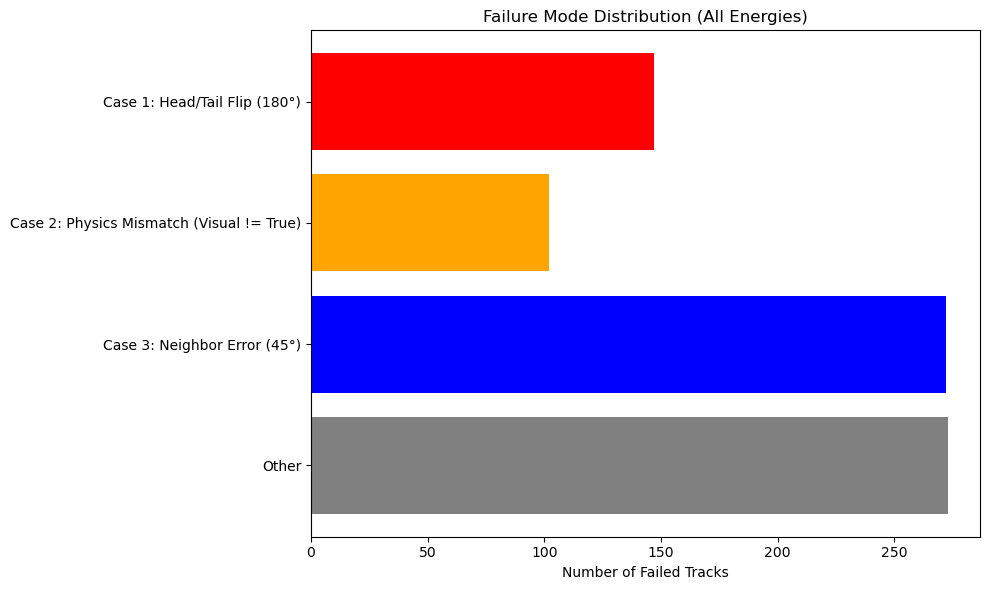

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# ==========================================
# 1. SETUP
# ==========================================
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec27_EmbeddingNetHailMary_eval.csv"
raw_data_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_5k_ROTATED.csv"

print("Loading data...")
df_results = pd.read_csv(results_path)
df_raw = pd.read_csv(raw_data_path)

# Filter for FAILURES ONLY (All Energies)
df_subset = df_results[
    (df_results['class_true'] != df_results['class_pred']) 
].copy()

print(f"Analyzing {len(df_subset)} FAILED tracks (All Energies)...")

# ==========================================
# 2. CLASSIFICATION LOGIC
# ==========================================
ANGLE_BINS = np.array([0, 45, 90, 135, 180, 225, 270, 315])

def get_vector(cls):
    rad = np.radians(ANGLE_BINS[int(cls)])
    return np.array([np.cos(rad), np.sin(rad)])

classification_counts = {
    "Case 1: Head/Tail Flip (180°)": 0,
    "Case 2: Physics Mismatch (Visual != True)": 0,
    "Case 3: Neighbor Error (45°)": 0,
    "Other": 0
}

for idx, row in df_subset.iterrows():
    E = row['energy_true']
    ion = row['ion_number']
    true_cls = int(row['class_true'])
    pred_cls = int(row['class_pred'])
    
    # 1. Calculate Prediction Difference
    diff = abs(true_cls - pred_cls)
    if diff > 4: diff = 8 - diff 
    
    # 2. Get PCA (Visual Axis)
    try:
        pts = df_raw[
            (df_raw['ion #'] == ion) & 
            (np.isclose(df_raw['energy_keV'], E, atol=1e-3))
        ][['x', 'y']].values
    except:
        continue
        
    if len(pts) < 5: 
        classification_counts["Other"] += 1
        continue

    pca = PCA(n_components=2)
    pca.fit(pts)
    v_pca = pca.components_[0] 
    
    # 3. Calculate "Visual Disagreement"
    v_true = get_vector(true_cls)
    dot = np.abs(np.dot(v_pca, v_true))
    visual_mismatch_deg = np.degrees(np.arccos(min(dot, 1.0)))
    
    # --- ASSIGN CASE ---
    
    # PRIORITY 1: Is the visual track completely wrong? (Case 2)
    # PCA > 60 degrees away from Truth
    if visual_mismatch_deg > 60:
        classification_counts["Case 2: Physics Mismatch (Visual != True)"] += 1
        
    # PRIORITY 2: Is it a 180 flip? (Case 1)
    elif diff == 4:
        classification_counts["Case 1: Head/Tail Flip (180°)"] += 1
        
    # PRIORITY 3: Is it a close call? (Case 3)
    elif diff == 1:
        classification_counts["Case 3: Neighbor Error (45°)"] += 1
        
    else:
        classification_counts["Other"] += 1

# ==========================================
# 3. PRINT REPORT
# ==========================================
total = sum(classification_counts.values())

print("\n=== FAILURE ANALYSIS REPORT (ALL ENERGIES) ===")
print(f"Total Failures Analyzed: {total}")
print("-" * 40)
for case, count in classification_counts.items():
    pct = (count / total) * 100
    print(f"{case}: {count} ({pct:.1f}%)")
print("-" * 40)

plt.figure(figsize=(10, 6))
keys = list(classification_counts.keys())
vals = list(classification_counts.values())
bars = plt.barh(keys, vals, color=['red', 'orange', 'blue', 'gray'])
plt.xlabel("Number of Failed Tracks")
plt.title("Failure Mode Distribution (All Energies)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

Loading data...
Analyzing 794 FAILED tracks (All Energies)...


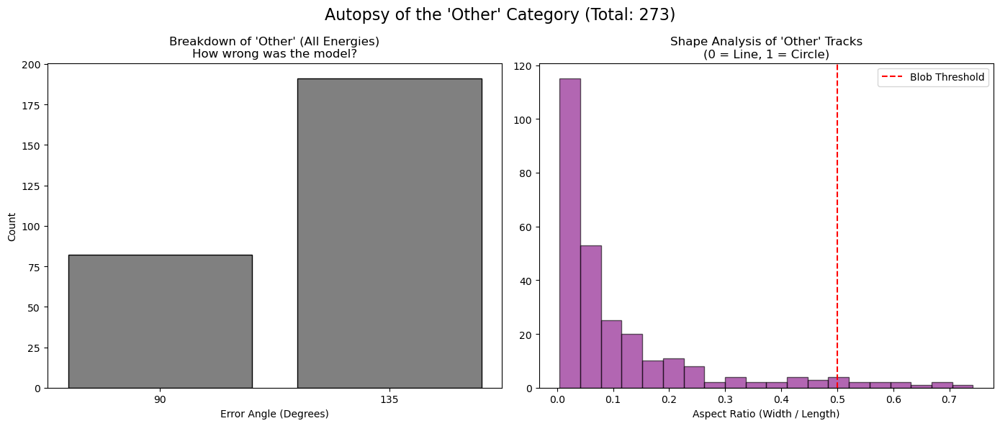

Analyzed 273 'Other' tracks.
Mean Energy of 'Other' tracks: 26.3 keV


In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# ==========================================
# 1. SETUP
# ==========================================
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec27_EmbeddingNetHailMary_eval.csv"
raw_data_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_5k_ROTATED.csv"

print("Loading data...")
df_results = pd.read_csv(results_path)
df_raw = pd.read_csv(raw_data_path)

# Filter for ALL FAILURES (No Energy Limit)
df_subset = df_results[
    (df_results['class_true'] != df_results['class_pred']) 
].copy()

print(f"Analyzing {len(df_subset)} FAILED tracks (All Energies)...")

# ==========================================
# 2. IDENTIFY "OTHER" TRACKS
# ==========================================
ANGLE_BINS = np.array([0, 45, 90, 135, 180, 225, 270, 315])

def get_vector(cls):
    rad = np.radians(ANGLE_BINS[int(cls)])
    return np.array([np.cos(rad), np.sin(rad)])

other_stats = []

for idx, row in df_subset.iterrows():
    E = row['energy_true']
    ion = row['ion_number']
    true_cls = int(row['class_true'])
    pred_cls = int(row['class_pred'])
    
    # Diff (0-4 scale)
    diff = abs(true_cls - pred_cls)
    if diff > 4: diff = 8 - diff
    
    # Get PCA
    try:
        pts = df_raw[
            (df_raw['ion #'] == ion) & 
            (np.isclose(df_raw['energy_keV'], E, atol=1e-3))
        ][['x', 'y']].values
    except:
        continue
    
    if len(pts) < 5: continue

    pca = PCA(n_components=2)
    pca.fit(pts)
    v_pca = pca.components_[0]
    
    # Visual Mismatch Angle
    v_true = get_vector(true_cls)
    dot = np.abs(np.dot(v_pca, v_true))
    visual_mismatch_deg = np.degrees(np.arccos(min(dot, 1.0)))

    # Aspect Ratio (Blob Check)
    evals = pca.explained_variance_
    aspect_ratio = evals[1] / (evals[0] + 1e-9)

    # RE-APPLY LOGIC TO FIND "OTHER"
    is_case_1 = diff == 4                 # 180 flip
    is_case_2 = visual_mismatch_deg > 60  # Visual Mismatch
    is_case_3 = diff == 1                 # Neighbor
    
    if not (is_case_1 or is_case_2 or is_case_3):
        # THIS IS AN "OTHER" TRACK
        error_deg = diff * 45
        other_stats.append({
            "Error Angle": error_deg,
            "Aspect Ratio": aspect_ratio,
            "Visual Mismatch": visual_mismatch_deg,
            "Energy": E
        })

df_other = pd.DataFrame(other_stats)

# ==========================================
# 3. VISUALIZE THE "OTHER" CATEGORY
# ==========================================
if len(df_other) > 0:
    fig, ax = plt.subplots(1, 2, figsize=(14, 6))

    # Plot A: Error Angle Distribution
    counts = df_other["Error Angle"].value_counts().sort_index()
    ax[0].bar(counts.index.astype(str), counts.values, color='gray', edgecolor='black')
    ax[0].set_title("Breakdown of 'Other' (All Energies)\nHow wrong was the model?")
    ax[0].set_xlabel("Error Angle (Degrees)")
    ax[0].set_ylabel("Count")

    # Plot B: Shape Analysis (Aspect Ratio)
    ax[1].hist(df_other["Aspect Ratio"], bins=20, color='purple', alpha=0.6, edgecolor='black')
    ax[1].set_title("Shape Analysis of 'Other' Tracks\n(0 = Line, 1 = Circle)")
    ax[1].set_xlabel("Aspect Ratio (Width / Length)")
    ax[1].axvline(0.5, color='red', linestyle='--', label="Blob Threshold")
    ax[1].legend()

    plt.suptitle(f"Autopsy of the 'Other' Category (Total: {len(df_other)})", fontsize=16)
    plt.tight_layout()
    plt.show()

    print(f"Analyzed {len(df_other)} 'Other' tracks.")
    print(f"Mean Energy of 'Other' tracks: {df_other['Energy'].mean():.1f} keV")
else:
    print("No 'Other' tracks found!")

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# ==========================================
# 1. SETUP
# ==========================================
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec27_EmbeddingNetHailMary_eval.csv"
raw_data_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_5k_ROTATED.csv"

df_results = pd.read_csv(results_path)
df_raw = pd.read_csv(raw_data_path)

# Filter for FAILURES
df_subset = df_results[
    (df_results['class_true'] != df_results['class_pred']) 
].copy()

# ==========================================
# 2. RIGOROUS CLASSIFICATION LOGIC
# ==========================================
ANGLE_BINS = np.array([0, 45, 90, 135, 180, 225, 270, 315])

def get_vector(cls):
    rad = np.radians(ANGLE_BINS[int(cls)])
    return np.array([np.cos(rad), np.sin(rad)])

classification_counts = {
    "Case 1: Head/Tail Flip (180°)": 0,
    "Case 2: Verified Physics Mismatch": 0, # Rigorous Definition
    "Case 3: Neighbor Error (45°)": 0,
    "Other": 0
}

# Counters for "Hallucinations" (Where physics lied, but model ALSO guessed a random 3rd direction)
hallucination_count = 0 

for idx, row in df_subset.iterrows():
    E = row['energy_true']
    ion = row['ion_number']
    true_cls = int(row['class_true'])
    pred_cls = int(row['class_pred'])
    
    # 1. Prediction Error (Diff between True & Pred)
    diff = abs(true_cls - pred_cls)
    if diff > 4: diff = 8 - diff 
    
    # 2. Get PCA (The "Visual Truth")
    try:
        pts = df_raw[
            (df_raw['ion #'] == ion) & 
            (np.isclose(df_raw['energy_keV'], E, atol=1e-3))
        ][['x', 'y']].values
    except:
        continue
    if len(pts) < 5: 
        classification_counts["Other"] += 1
        continue

    pca = PCA(n_components=2)
    pca.fit(pts)
    v_pca = pca.components_[0]
    
    # 3. CALCULATE ANGLES (The Triangulation)
    
    # A. Visual vs. True (Did the physics lie?)
    v_true = get_vector(true_cls)
    dot_vt = np.abs(np.dot(v_pca, v_true))
    angle_visual_true = np.degrees(np.arccos(min(dot_vt, 1.0))) # 0-90 scale
    
    # B. Visual vs. Pred (Did the model see the track?)
    v_pred = get_vector(pred_cls)
    dot_vp = np.abs(np.dot(v_pca, v_pred))
    angle_visual_pred = np.degrees(np.arccos(min(dot_vp, 1.0))) # 0-90 scale

    # --- THE DECISION TREE ---
    
    # CASE 2 CHECK:
    # 1. The Physics lied (Visual is > 60 deg from True)
    # 2. The Model believed the lie (Visual is < 30 deg from Pred)
    if angle_visual_true > 60:
        if angle_visual_pred < 30:
            classification_counts["Case 2: Verified Physics Mismatch"] += 1
        else:
            # Physics lied, but model guessed a 3rd random direction
            hallucination_count += 1 
            classification_counts["Other"] += 1

    # CASE 1: 180 Flip
    elif diff == 4:
        classification_counts["Case 1: Head/Tail Flip (180°)"] += 1
        
    # CASE 3: Neighbor
    elif diff == 1:
        classification_counts["Case 3: Neighbor Error (45°)"] += 1
        
    else:
        classification_counts["Other"] += 1

# ==========================================
# 3. REPORT
# ==========================================
total = sum(classification_counts.values())

print("\n=== RIGOROUS FAILURE AUDIT ===")
print(f"Total Failures: {total}")
print("-" * 40)
for case, count in classification_counts.items():
    pct = (count / total) * 100
    print(f"{case}: {count} ({pct:.1f}%)")
print("-" * 40)
print(f"Note: {hallucination_count} tracks were 'Chaotic' (Physics lied AND Model failed to track).")


=== RIGOROUS FAILURE AUDIT ===
Total Failures: 794
----------------------------------------
Case 1: Head/Tail Flip (180°): 147 (18.5%)
Case 2: Verified Physics Mismatch: 71 (8.9%)
Case 3: Neighbor Error (45°): 272 (34.3%)
Other: 304 (38.3%)
----------------------------------------
Note: 31 tracks were 'Chaotic' (Physics lied AND Model failed to track).


In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# ==========================================
# 1. SETUP
# ==========================================
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec27_EmbeddingNetHailMary_eval.csv"
raw_data_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_5k_ROTATED.csv"

df_results = pd.read_csv(results_path)
df_raw = pd.read_csv(raw_data_path)

# Filter for FAILURES
df_subset = df_results[
    (df_results['class_true'] != df_results['class_pred']) 
].copy()

# ==========================================
# 2. YOUR 3-CASE SYSTEM
# ==========================================
ANGLE_BINS = np.array([0, 45, 90, 135, 180, 225, 270, 315])

def get_vector(cls):
    rad = np.radians(ANGLE_BINS[int(cls)])
    return np.array([np.cos(rad), np.sin(rad)])

classification_counts = {
    "Case 2: odd shape (perpendicular PCA and true direction)": 0,
    "Case 1: Head/Tail Flip (180°)": 0,
    "Case 3: Neighbor Error (45°)": 0,
    "Other": 0
}

for idx, row in df_subset.iterrows():
    E = row['energy_true']
    ion = row['ion_number']
    true_cls = int(row['class_true'])
    pred_cls = int(row['class_pred'])
    
    # Prediction Diff (0-4 scale)
    diff = abs(true_cls - pred_cls)
    if diff > 4: diff = 8 - diff 
    
    # Get PCA (Visual Axis)
    try:
        pts = df_raw[
            (df_raw['ion #'] == ion) & 
            (np.isclose(df_raw['energy_keV'], E, atol=1e-3))
        ][['x', 'y']].values
    except:
        continue
    if len(pts) < 5: 
        classification_counts["Other (90° Error on a Good Track)"] += 1
        continue

    pca = PCA(n_components=2)
    pca.fit(pts)
    v_pca = pca.components_[0]
    
    # --- CHECK 1: DID THE PHYSICS LIE? (Case 2) ---
    v_true = get_vector(true_cls)
    dot_vt = np.abs(np.dot(v_pca, v_true))
    angle_visual_true = np.degrees(np.arccos(min(dot_vt, 1.0))) 
    
    # If Visual is > 60 degrees from Truth, it is Case 2.
    if angle_visual_true > 60:
        classification_counts["Case 2: odd shape (perpendicular PCA and true direction)"] += 1

    # --- CHECK 2: WAS IT A FLIP? (Case 1) ---
    elif diff == 4:
        classification_counts["Case 1: Head/Tail Flip (180°)"] += 1
        
    # --- CHECK 3: WAS IT CLOSE? (Case 3) ---
    elif diff == 1:
        classification_counts["Case 3: Neighbor Error (45°)"] += 1
        
    # --- EVERYTHING ELSE (Other) ---
    else:
        classification_counts["Other"] += 1

# ==========================================
# 3. REPORT
# ==========================================
total = sum(classification_counts.values())

print("\n=== FAILURE DIAGNOSIS ===")
print(f"Total Failures: {total}")
print("-" * 40)
for case, count in classification_counts.items():
    pct = (count / total) * 100
    print(f"{case}: {count} ({pct:.1f}%)")
print("-" * 40)


=== FAILURE DIAGNOSIS ===
Total Failures: 794
----------------------------------------
Case 2: odd shape (perpendicular PCA and true direction): 102 (12.8%)
Case 1: Head/Tail Flip (180°): 147 (18.5%)
Case 3: Neighbor Error (45°): 272 (34.3%)
Other: 273 (34.4%)
----------------------------------------


Total Tracks: 5000
Perfect Matches: 3999 (Removed from plot)
Remaining Errors: 1001
180° Flips: 160
Flips as % of Errors: 16.0%


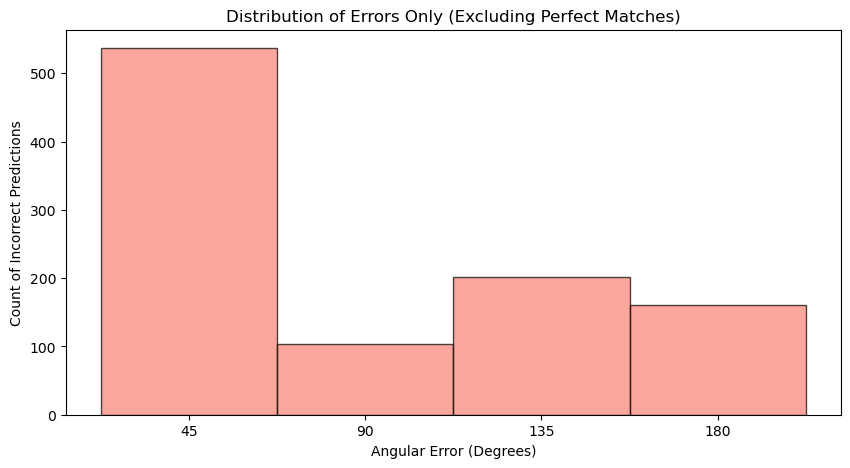

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 1. Load your results
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Jan21_SummaryFeatures_eval.csv"
df = pd.read_csv(results_path)

# 2. Calculate angular error
pred_deg = df['class_pred'] * 45
true_deg = df['class_true'] * 45

diff = np.abs(pred_deg - true_deg)
diff = np.minimum(diff, 360 - diff) # Fix wrap-around

# 3. FILTER: Remove perfect matches (0 degree error)
error_mask = diff > 0
diff_errors_only = diff[error_mask]

# 4. PLOT
plt.figure(figsize=(10, 5))

# We use bins centered on the errors: 45, 90, 135, 180
bins = [22.5, 67.5, 112.5, 157.5, 202.5] 

counts, _, _ = plt.hist(diff_errors_only, bins=bins, 
                        edgecolor='black', alpha=0.7, color='salmon')

plt.xticks([45, 90, 135, 180])
plt.xlabel("Angular Error (Degrees)")
plt.ylabel("Count of Incorrect Predictions")
plt.title(f"Distribution of Errors Only (Excluding Perfect Matches)")

# Stats for context
n_total = len(df)
n_perfect = (~error_mask).sum()
n_errors = error_mask.sum()
n_flipped = (diff == 180).sum()

print(f"Total Tracks: {n_total}")
print(f"Perfect Matches: {n_perfect} (Removed from plot)")
print(f"Remaining Errors: {n_errors}")
print(f"180° Flips: {n_flipped}")
if n_errors > 0:
    print(f"Flips as % of Errors: {n_flipped / n_errors:.1%}")

plt.show()

Total Tracks: 5000
Perfect Matches: 3968 (Removed from plot)
Remaining Errors: 1032
180° Flips: 176
Flips as % of Errors: 17.1%


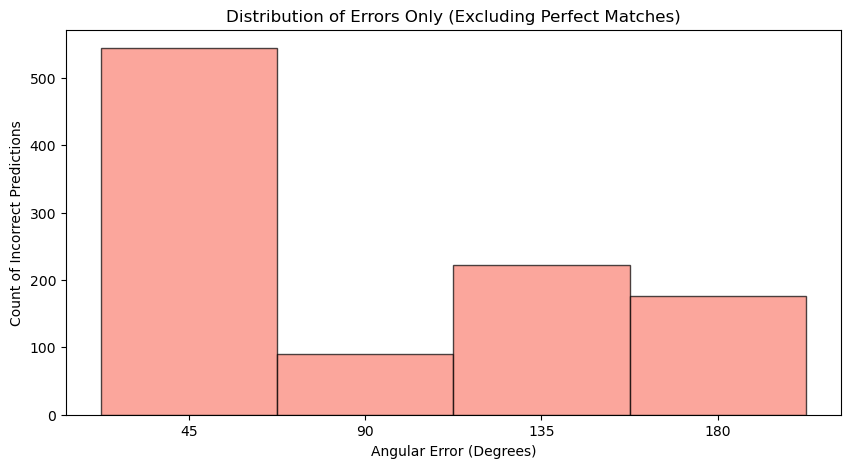

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 1. Load your results
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec25mdpe9_eval_results.csv"
df = pd.read_csv(results_path)

# 2. Calculate angular error
pred_deg = df['class_pred'] * 45
true_deg = df['class_true'] * 45

diff = np.abs(pred_deg - true_deg)
diff = np.minimum(diff, 360 - diff) # Fix wrap-around

# 3. FILTER: Remove perfect matches (0 degree error)
error_mask = diff > 0
diff_errors_only = diff[error_mask]

# 4. PLOT
plt.figure(figsize=(10, 5))

# We use bins centered on the errors: 45, 90, 135, 180
bins = [22.5, 67.5, 112.5, 157.5, 202.5] 

counts, _, _ = plt.hist(diff_errors_only, bins=bins, 
                        edgecolor='black', alpha=0.7, color='salmon')

plt.xticks([45, 90, 135, 180])
plt.xlabel("Angular Error (Degrees)")
plt.ylabel("Count of Incorrect Predictions")
plt.title(f"Distribution of Errors Only (Excluding Perfect Matches)")

# Stats for context
n_total = len(df)
n_perfect = (~error_mask).sum()
n_errors = error_mask.sum()
n_flipped = (diff == 180).sum()

print(f"Total Tracks: {n_total}")
print(f"Perfect Matches: {n_perfect} (Removed from plot)")
print(f"Remaining Errors: {n_errors}")
print(f"180° Flips: {n_flipped}")
if n_errors > 0:
    print(f"Flips as % of Errors: {n_flipped / n_errors:.1%}")

plt.show()

Total Tracks: 5000
Perfect Matches: 4206 (Removed from plot)
Remaining Errors: 794
180° Flips: 150
Flips as % of Errors: 18.9%


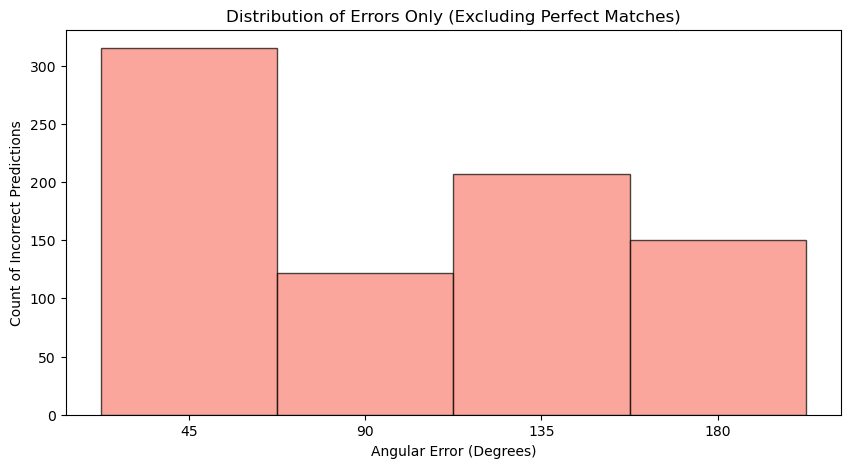

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# 1. Load your results
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Dec27_EmbeddingNetHailMary_eval.csv"
df = pd.read_csv(results_path)

# 2. Calculate angular error
pred_deg = df['class_pred'] * 45
true_deg = df['class_true'] * 45

diff = np.abs(pred_deg - true_deg)
diff = np.minimum(diff, 360 - diff) # Fix wrap-around

# 3. FILTER: Remove perfect matches (0 degree error)
error_mask = diff > 0
diff_errors_only = diff[error_mask]

# 4. PLOT
plt.figure(figsize=(10, 5))

# We use bins centered on the errors: 45, 90, 135, 180
bins = [22.5, 67.5, 112.5, 157.5, 202.5] 

counts, _, _ = plt.hist(diff_errors_only, bins=bins, 
                        edgecolor='black', alpha=0.7, color='salmon')

plt.xticks([45, 90, 135, 180])
plt.xlabel("Angular Error (Degrees)")
plt.ylabel("Count of Incorrect Predictions")
plt.title(f"Distribution of Errors Only (Excluding Perfect Matches)")

# Stats for context
n_total = len(df)
n_perfect = (~error_mask).sum()
n_errors = error_mask.sum()
n_flipped = (diff == 180).sum()

print(f"Total Tracks: {n_total}")
print(f"Perfect Matches: {n_perfect} (Removed from plot)")
print(f"Remaining Errors: {n_errors}")
print(f"180° Flips: {n_flipped}")
if n_errors > 0:
    print(f"Flips as % of Errors: {n_flipped / n_errors:.1%}")

plt.show()

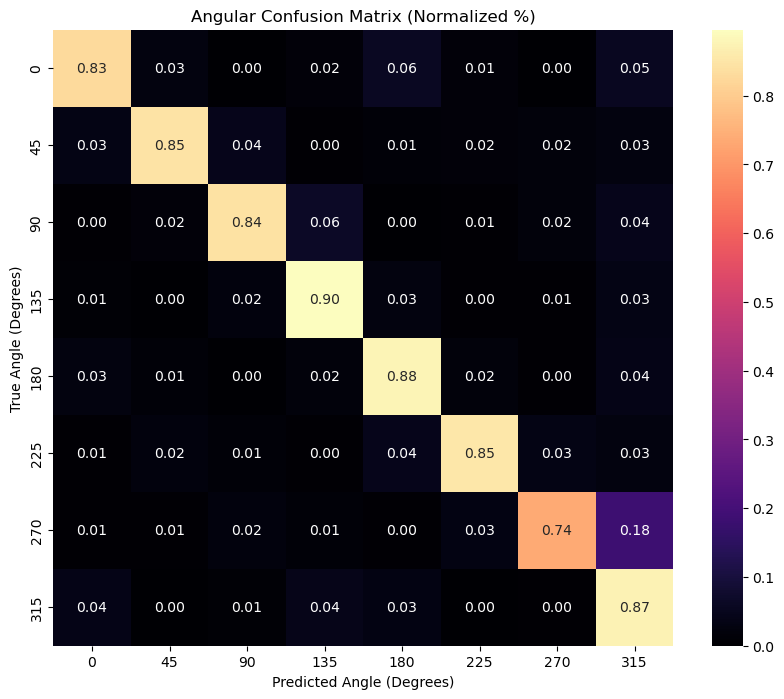


--- GEOMETRIC ERROR ANALYSIS ---
Perfect Match (0° error): 84.34%
Near Miss (+/- 45° error): 8.22%
Head-Tail Flip (180° error): 2.98%


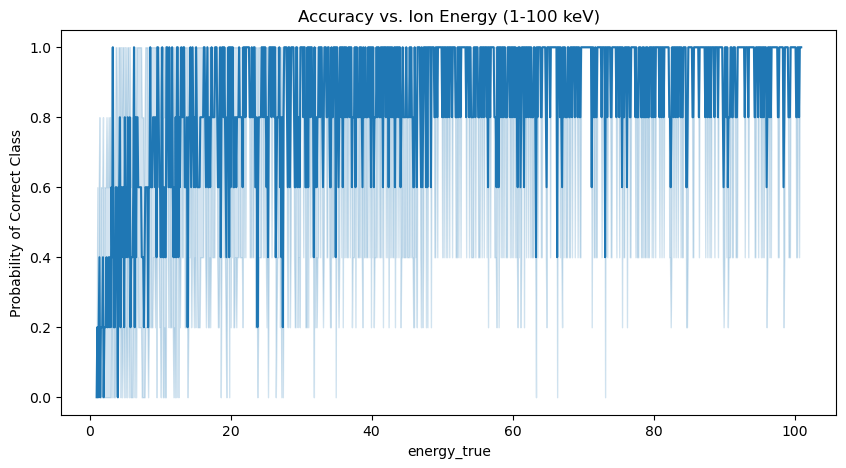

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# 1. Load Data
file_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Jan22_EmbeddingNetHailMary_eval.csv"
df = pd.read_csv(file_path)

# Extract True and Predicted (assuming rounded predictions)
y_true = df['class_true']
y_pred = df['class_pred']

# 2. Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
# Normalize to see percentages
cm_perc = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(10, 8))
sns.heatmap(cm_perc, annot=True, fmt='.2f', cmap='magma',
            xticklabels=np.arange(8)*45, yticklabels=np.arange(8)*45)
plt.title('Angular Confusion Matrix (Normalized %)')
plt.xlabel('Predicted Angle (Degrees)')
plt.ylabel('True Angle (Degrees)')
plt.show()

# 3. Analyze "Circular" Errors
# In a robust model, errors should only be in adjacent bins (e.g., +/- 45 degrees)
df['angular_diff'] = np.abs(df['class_true'] - df['class_pred'])
# Handle wrap-around (e.g., diff between 7 and 0 is 1, not 7)
df['circular_diff'] = df['angular_diff'].apply(lambda x: x if x <= 4 else 8 - x)

print("\n--- GEOMETRIC ERROR ANALYSIS ---")
off_by_0 = (df['circular_diff'] == 0).mean() * 100
off_by_1 = (df['circular_diff'] == 1).mean() * 100
off_by_4 = (df['circular_diff'] == 4).mean() * 100 # This is the 180-degree Head-Tail flip

print(f"Perfect Match (0° error): {off_by_0:.2f}%")
print(f"Near Miss (+/- 45° error): {off_by_1:.2f}%")
print(f"Head-Tail Flip (180° error): {off_by_4:.2f}%")

# 4. Energy vs. Accuracy
plt.figure(figsize=(10, 5))
sns.lineplot(data=df, x='energy_true', y='class_correct')
plt.title('Accuracy vs. Ion Energy (1-100 keV)')
plt.ylabel('Probability of Correct Class')
plt.show()

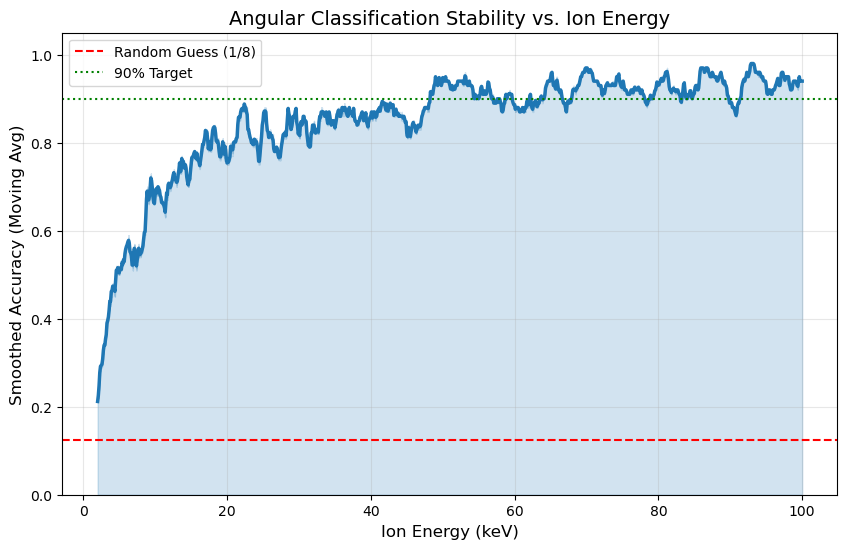

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
df = pd.read_csv("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Jan22_EmbeddingNetHailMary_eval.csv")

# 1. Sort by energy for proper smoothing
df = df.sort_values('energy_true')

# 2. Calculate Rolling Accuracy (Window of 100 tracks)
# This converts the 0/1 noise into a local probability (0.0 to 1.0)
df['smoothed_acc'] = df['class_correct'].rolling(window=100, center=True).mean()

plt.figure(figsize=(10, 6))

# Plot the smoothed trend line
sns.lineplot(data=df, x='energy_true', y='smoothed_acc', color='#1f77b4', linewidth=2.5)

# Add a shaded region for the raw data density (optional but looks pro)
plt.fill_between(df['energy_true'], df['smoothed_acc'], alpha=0.2, color='#1f77b4')

# 3. Add Physics Benchmarks
plt.axhline(y=0.125, color='r', linestyle='--', label='Random Guess (1/8)')
plt.axhline(y=0.90, color='g', linestyle=':', label='90% Target')

plt.title('Angular Classification Stability vs. Ion Energy', fontsize=14)
plt.xlabel('Ion Energy (keV)', fontsize=12)
plt.ylabel('Smoothed Accuracy (Moving Avg)', fontsize=12)
plt.ylim(0, 1.05)
plt.grid(alpha=0.3)
plt.legend()
plt.show()

Loaded 5000 predictions from /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Jan22_EmbeddingNetHailMary_eval.csv

Energy Range    | Accuracy   | Tracks     | Status
0-1 keV         | 0.00%     | 5          | NOISE LIMIT
1-5 keV         | 35.00%     | 200        | STRUGGLING
5-10 keV        | 59.20%     | 250        | OKAY
10-30 keV       | 78.30%     | 1000       | GREAT
30-50 keV       | 86.40%     | 1000       | EXCELLENT
50-100 keV      | 92.40%     | 2500       | EXCELLENT
100+ keV        | 93.33%     | 45         | EXCELLENT



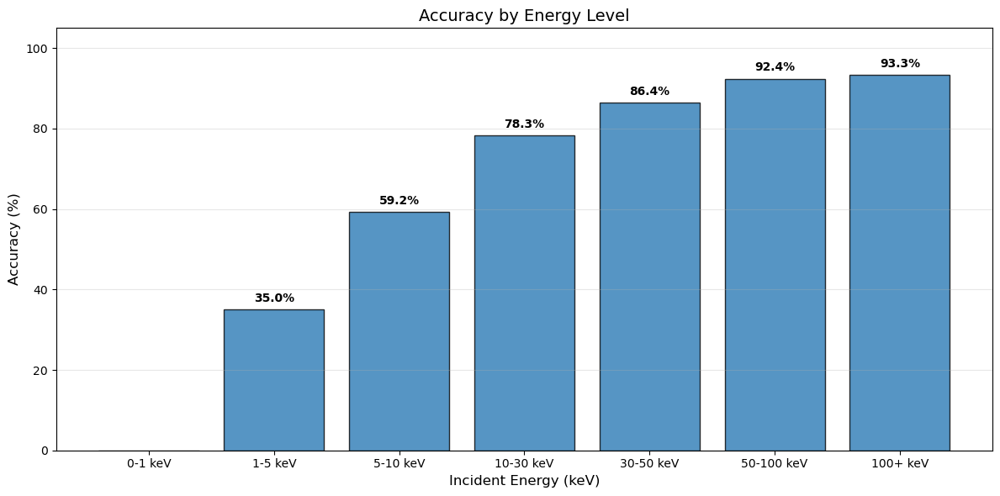

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. SETUP
# ==========================================
# Replace with the actual path to your results CSV
results_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Jan22_EmbeddingNetHailMary_eval.csv"

try:
    df = pd.read_csv(results_path)
    print(f"Loaded {len(df)} predictions from {results_path}")
except FileNotFoundError:
    print("Error: File not found. Please check the path.")
    exit()

# ==========================================
# 2. CONFIGURATION (UPDATED PER DR. ANG)
# ==========================================
# Dr. Ang requested breakdown of <10 keV: 0-1, 1-5, 5-10.
# We keep the higher bins to show the full trend.
bins = [0, 1, 5, 10, 30, 50, 100, 1000]
labels = [
    "0-1 keV", 
    "1-5 keV", 
    "5-10 keV", 
    "10-30 keV", 
    "30-50 keV", 
    "50-100 keV", 
    "100+ keV"
]

# Ensure columns are numeric using YOUR column names
df["energy_true"] = pd.to_numeric(df["energy_true"], errors='coerce')
df["class_true"] = df["class_true"].astype(int)
df["class_pred"] = df["class_pred"].astype(int)

# ==========================================
# 3. CALCULATE ACCURACY PER BIN
# ==========================================
# Binning based on 'energy_true'
df["energy_bin"] = pd.cut(df["energy_true"], bins=bins, labels=labels)

results = []

print("\n" + "="*55)
print(f"{'Energy Range':<15} | {'Accuracy':<10} | {'Tracks':<10} | {'Status'}")
print("="*55)

for label in labels:
    subset = df[df["energy_bin"] == label]
    
    if len(subset) == 0:
        print(f"{label:<15} | {'N/A':<10} | {0:<10} | -")
        results.append(0) # Append 0 to keep plot alignment
        continue
        
    # Calculate exact matches using 'class_true' and 'class_pred'
    correct = (subset["class_true"] == subset["class_pred"]).sum()
    total = len(subset)
    acc = (correct / total) * 100
    
    # Simple status flag
    if acc > 85: status = "EXCELLENT"
    elif acc > 75: status = "GREAT"
    elif acc > 50: status = "OKAY"
    elif acc > 25: status = "STRUGGLING"
    else: status = "NOISE LIMIT"
    
    results.append(acc)
    print(f"{label:<15} | {acc:.2f}%     | {total:<10} | {status}")

print("="*55 + "\n")

# ==========================================
# 4. PLOT THE TREND
# ==========================================
plt.figure(figsize=(12, 6)) # Made figure slightly wider for more bins
bars = plt.bar(labels, results, color='#2c7bb6', edgecolor='black', alpha=0.8)

# Labels
plt.title("Accuracy by Energy Level", fontsize=14)
plt.ylabel("Accuracy (%)", fontsize=12)
plt.xlabel("Incident Energy (keV)", fontsize=12)
plt.ylim(0, 105)
plt.grid(axis='y', alpha=0.3)

# Add values on top of bars
for bar in bars:
    yval = bar.get_height()
    # Only plot text if bar height is > 0
    if yval > 0:
        plt.text(bar.get_x() + bar.get_width()/2, yval + 2, f"{yval:.1f}%", ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

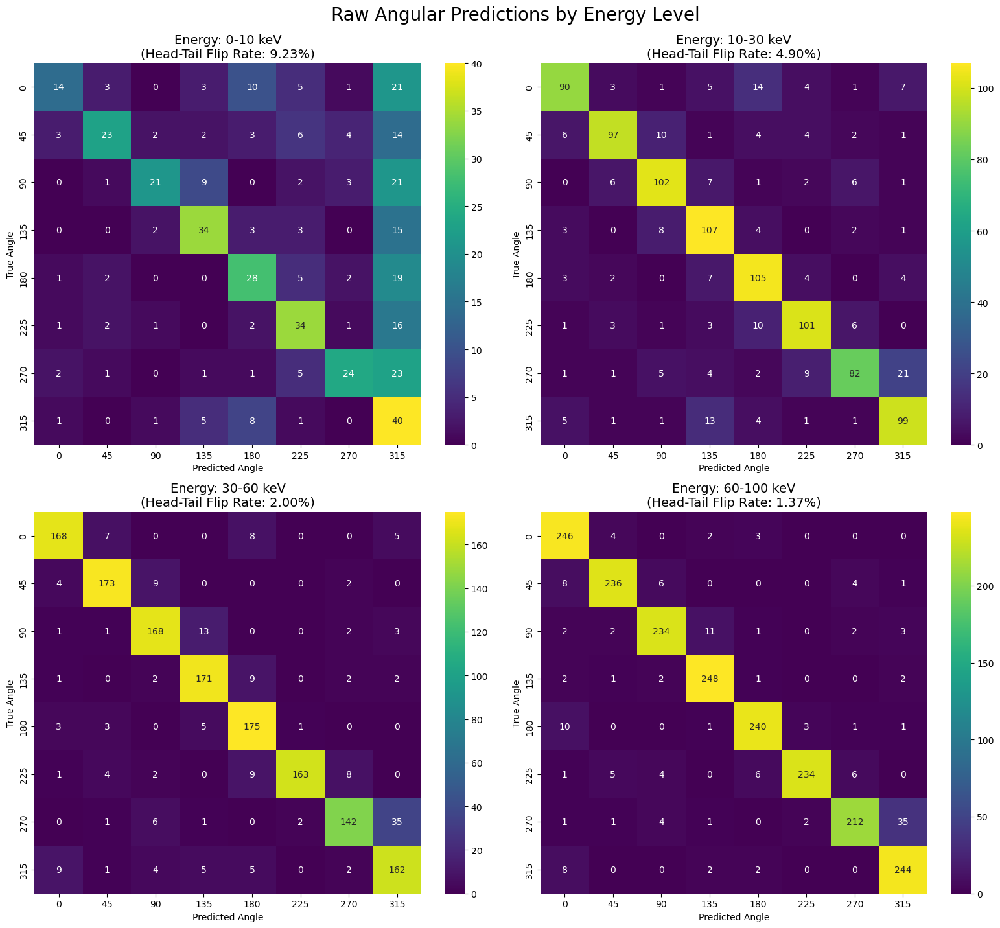

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# 1. Load results
file_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/results/Jan22_EmbeddingNetHailMary_eval.csv"
df = pd.read_csv(file_path)

# 2. Define Energy Bins
bins = [0, 10, 30, 60, 101]
labels = ['0-10 keV', '10-30 keV', '30-60 keV', '60-100 keV']
df['energy_bin'] = pd.cut(df['energy_true'], bins=bins, labels=labels)

# 3. Plotting Setup
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.flatten()
angles = np.arange(8) * 45

for i, label in enumerate(labels):
    subset = df[df['energy_bin'] == label]
    
    if len(subset) > 0:
        # Calculate RAW confusion matrix for integer display
        cm = confusion_matrix(subset['class_true'], subset['class_pred'], labels=np.arange(8))
        
        sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', ax=axes[i],
                    xticklabels=angles, yticklabels=angles, cbar=True)
        
        # Calculate Head-Tail flip percentage
        diff = np.abs(subset['class_true'] - subset['class_pred'])
        circ_diff = np.where(diff <= 4, diff, 8 - diff)
        ht_flip_perc = (circ_diff == 4).mean() * 100
        
        # Updated title with percentage
        axes[i].set_title(f'Energy: {label}\n(Head-Tail Flip Rate: {ht_flip_perc:.2f}%)', fontsize=14)
        axes[i].set_xlabel('Predicted Angle')
        axes[i].set_ylabel('True Angle')

plt.tight_layout()
plt.suptitle('Raw Angular Predictions by Energy Level', fontsize=20, y=1.02)
plt.show()

In [2]:
import pandas as pd
import numpy as np
import os

# ============================================================
# CONFIGURATION
# ============================================================
RAW_DATA_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/200k_raw_tracks_no_rotation.csv"
OUTPUT_PATH   = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_TRAIN_CONTINUOUS_200k.csv"

def main():
    if not os.path.exists(RAW_DATA_PATH):
        print(f"Error: Could not find {RAW_DATA_PATH}")
        return

    print(f"Loading raw data...")
    df = pd.read_csv(RAW_DATA_PATH)
    
    # 1. SHUFFLE FOR ENERGY BALANCE
    # Ensures that every energy level is distributed evenly across the circle.
    df = df.sample(frac=1, random_state=42).reset_index(drop=True)
    num_tracks = len(df)

    # 2. GENERATE CONTINUOUS ANGLES (15° Bins + 7.5° Blur)
    print("Generating continuous angles and trigonometric targets...")
    base_bins = np.linspace(0, 345, 24)
    bin_assignments = np.array([base_bins[i % 24] for i in range(num_tracks)])
    
    # Add blur to fill the gaps between the 15-degree steps
    blur = np.random.uniform(-7.5, 7.5, size=num_tracks)
    theta_deg = (bin_assignments + blur) % 360
    
    # 3. ADD NEW COLUMNS TO MATCH YOUR FORMAT
    df['theta_deg'] = theta_deg
    df['cos_theta'] = np.cos(np.radians(theta_deg))
    df['sin_theta'] = np.sin(np.radians(theta_deg))

    # 4. ROTATE PHYSICS FEATURES (X, Y, Z)
    # Rotating in the XY plane to match the new theta_deg.
    print("Rotating track coordinates...")
    phi_rad = np.radians(theta_deg)
    c, s = np.cos(phi_rad), np.sin(phi_rad)

    # Use your specific column names
    x_orig = df['x (ang)'].copy()
    y_orig = df['y (ang)'].copy()
    
    df['x (ang)'] = x_orig * c - y_orig * s
    df['y (ang)'] = x_orig * s + y_orig * c
    # z (ang) remains unchanged in a 2D XY rotation

    # 5. REORDER COLUMNS TO MATCH SCREENSHOT
    expected_cols = ['x (ang)', 'y (ang)', 'z (ang)', 'ion #', 'energy', 'theta_deg', 'cos_theta', 'sin_theta']
    df_final = df[expected_cols]

    # 6. SAVE
    print(f"Saving to: {OUTPUT_PATH}")
    df_final.to_csv(OUTPUT_PATH, index=False)
    print("\nSuccess! Data format matches requested columns.")
    print(df_final.head())

if __name__ == "__main__":
    main()

Loading raw data...
Generating continuous angles and trigonometric targets...
Rotating track coordinates...
Saving to: /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_TRAIN_CONTINUOUS_200k.csv

Success! Data format matches requested columns.
       x (ang)      y (ang)  z (ang)  ion #  energy   theta_deg  cos_theta  \
0   806.489354   127.924868    51.44    600    51.0  358.513735   0.999664   
1  1028.245152   307.842044  -143.50    116    82.0   19.528295   0.942477   
2   492.284444   551.499162   128.30    841    45.0   35.039722   0.818754   
3   195.191283   354.870413   -73.25    786    29.5   52.257459   0.612114   
4   306.063296  1038.478126   494.30    907   100.5   60.140450   0.497876   

   sin_theta  
0  -0.025937  
1   0.334272  
2   0.574144  
3   0.790769  
4   0.867248  


In [6]:
import pandas as pd
import numpy as np

# Path configuration
RAW_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/200k_raw_tracks_no_rotation.csv"
OUT_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_TRAIN_CONTINUOUS_FIXED2_200k.csv"

def main():
    print(f"Loading {RAW_PATH}...")
    df = pd.read_csv(RAW_PATH)
    
    # 1. IDENTIFY UNIQUE TRACKS (Energy + Ion #)
    # We create a composite key because ion # repeats for each energy level
    print("Identifying unique tracks by (energy, ion #)...")
    track_ids = df[['energy', 'ion #']].drop_duplicates()
    num_tracks = len(track_ids)
    print(f"Detected {num_tracks} unique energy-ion tracks.")

    # 2. GENERATE ONE ANGLE PER UNIQUE TRACK
    # Create a unique angle for every specific energy/ion combination
    track_ids['theta_deg'] = np.random.uniform(0, 360, size=num_tracks)
    
    # 3. MERGE ANGLES BACK TO THE MAIN DATAFRAME
    # This acts like a 'map' that respects both columns
    print("Mapping angles back to individual vacancies...")
    df = df.merge(track_ids, on=['energy', 'ion #'], how='left')
    
    # 4. CALCULATE TRIG TARGETS
    df['cos_theta'] = np.cos(np.radians(df['theta_deg']))
    df['sin_theta'] = np.sin(np.radians(df['theta_deg']))

    # 5. ROTATE THE COORDINATES (XY Plane)
    print("Applying 1:1 rotations to coordinates...")
    phi_rad = np.radians(df['theta_deg'])
    c, s = np.cos(phi_rad), np.sin(phi_rad)
    
    x_orig = df['x (ang)'].copy()
    y_orig = df['y (ang)'].copy()
    
    # New X/Y coordinates based on track-specific rotation
    df['x (ang)'] = x_orig * c - y_orig * s
    df['y (ang)'] = x_orig * s + y_orig * c

    # 6. FINAL CLEANUP AND SAVE
    # Reorder to match your desired format
    cols = ['x (ang)', 'y (ang)', 'z (ang)', 'ion #', 'energy', 'theta_deg', 'cos_theta', 'sin_theta']
    df = df[cols]

    df.to_csv(OUT_PATH, index=False)
    print(f"Successfully created 1:1 rotated dataset with {num_tracks} unique tracks.")

if __name__ == "__main__":
    main()

Loading /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/200k_raw_tracks_no_rotation.csv...
Identifying unique tracks by (energy, ion #)...
Detected 200000 unique energy-ion tracks.
Mapping angles back to individual vacancies...
Applying 1:1 rotations to coordinates...
Successfully created 1:1 rotated dataset with 200000 unique tracks.


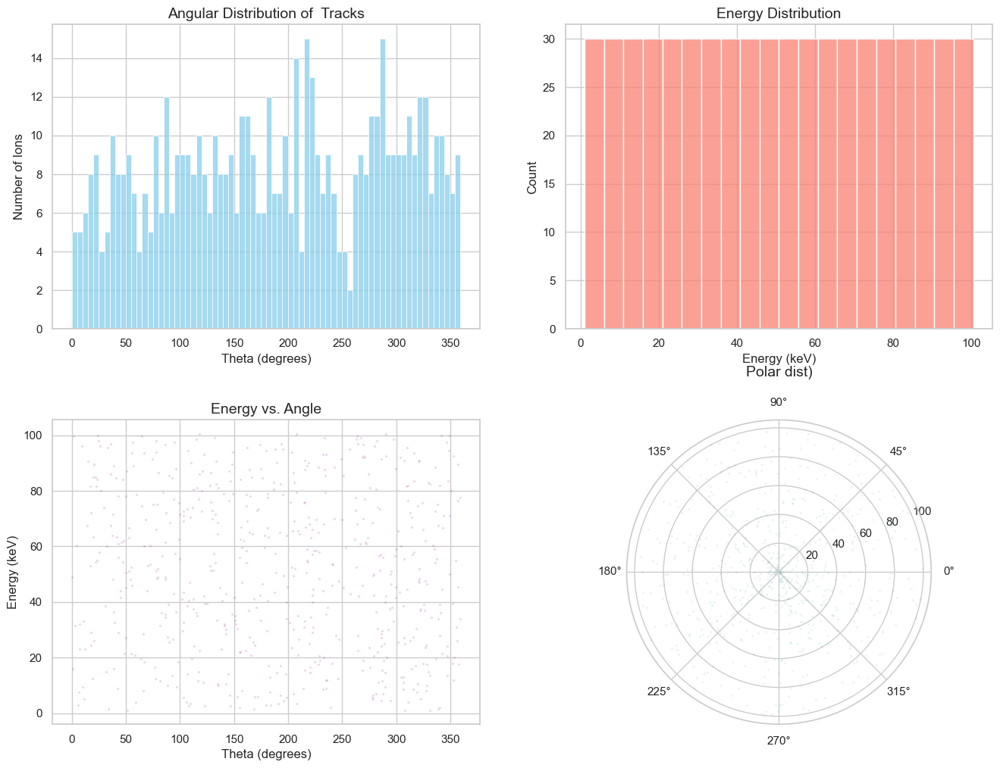

------------------------------
DATASET VERIFICATION SUMMARY (TRACK-BASED)
------------------------------
Total Vacancy Rows: 127,492
Total Unique Ion Tracks: 600
Energy Range: 1.0 to 100.5 keV
Unique Energy Levels: 200
Average Vacancies per Track: 212.5


In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Path to your corrected dataset
file_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_CONTINUOUS_5k.csv"

# Load the data
df = pd.read_csv(file_path)

# ---------------------------------------------------------
# CRITICAL FIX: DEFINE TRACKS BY ION # AND ENERGY
# ---------------------------------------------------------
# We drop duplicate entries of (ion #, energy) to get one row per unique track.
# This ensures we are plotting the distribution of IONS, not VACANCIES.
tracks_df = df.drop_duplicates(subset=['ion #', 'energy']).copy()

# Setup the plotting environment
plt.style.use('seaborn-v0_8-muted')
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
plt.subplots_adjust(hspace=0.3)

# 1. DISTRIBUTION OF ANGLES (Verify the "Blur" & Coverage)
# Using tracks_df ensures we see the angle distribution of the actual ions.
sns.histplot(tracks_df['theta_deg'], bins=72, ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('Angular Distribution of  Tracks', fontsize=14)
axes[0, 0].set_xlabel('Theta (degrees)')
axes[0, 0].set_ylabel('Number of Ions')

# 2. DISTRIBUTION OF ENERGIES
# Using tracks_df reveals if you have an equal number of ions per energy level.
sns.histplot(tracks_df['energy'], bins=20, ax=axes[0, 1], color='salmon')
axes[0, 1].set_title('Energy Distribution', fontsize=14)
axes[0, 1].set_xlabel('Energy (keV)')

# 3. ENERGY VS. ANGLE SCATTER (Verify Balance)
# Every dot here represents one unique ion track.
axes[1, 0].scatter(tracks_df['theta_deg'], tracks_df['energy'], alpha=0.1, s=2, color='purple')
axes[1, 0].set_title('Energy vs. Angle', fontsize=14)
axes[1, 0].set_xlabel('Theta (degrees)')
axes[1, 0].set_ylabel('Energy (keV)')

# 4. POLAR PLOT (The Physical Phase Space)
ax_polar = fig.add_subplot(2, 2, 4, projection='polar')
axes[1, 1].axis('off') 
ax_polar.scatter(np.radians(tracks_df['theta_deg']), tracks_df['energy'], alpha=0.05, s=2, color='teal')
ax_polar.set_title('Polar dist)', pad=20, fontsize=14)

plt.show()

# ---------------------------------------------------------
# SUMMARY STATS (BASED ON TRACKS)
# ---------------------------------------------------------
print("-" * 30)
print("DATASET VERIFICATION SUMMARY (TRACK-BASED)")
print("-" * 30)
print(f"Total Vacancy Rows: {len(df):,}")
print(f"Total Unique Ion Tracks: {len(tracks_df):,}")
print(f"Energy Range: {tracks_df['energy'].min():.1f} to {tracks_df['energy'].max():.1f} keV")
print(f"Unique Energy Levels: {tracks_df['energy'].nunique()}")
print(f"Average Vacancies per Track: {len(df)/len(tracks_df):.1f}")

In [ ]:
import pandas as pd
import numpy as np
import os

# Path configuration
RAW_INPUT_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated.csv"
OUTPUT_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_CONTINUOUS_5k.csv"


def main():
    if not os.path.exists(RAW_INPUT_PATH):
        print(f"Error: Could not find {RAW_INPUT_PATH}")
        return

    print(f"Loading {RAW_INPUT_PATH}...")
    df = pd.read_csv(RAW_INPUT_PATH)
    
    # 1. Clean column names
    df.columns = [c.strip() for c in df.columns]
    
    # 2. Stitch Batches (Fix Ion IDs)
    print("Fixing Ion IDs...")
    # Handle the difference between 'ion_number' and 'ion #'
    ion_col = 'ion_number' if 'ion_number' in df.columns else 'ion #'
    
    if ion_col not in df.columns:
        print(f"Error: Could not find ion column. Available: {df.columns.tolist()}")
        return

    # Handle Energy Column
    if 'energy_keV' in df.columns:
        df['energy'] = df['energy_keV']
    elif 'energy' in df.columns:
        df['energy_keV'] = df['energy']

    # Create Unique ID
    ion_diff = df[ion_col].diff().fillna(0)
    batch_counter = (ion_diff < 0).cumsum()
    df['unique_ion_id'] = (batch_counter * 10000) + df[ion_col]
    
    # 3. Assign Random Angles
    # Use .copy() to ensure we have a clean dataframe
    track_ids = df[['unique_ion_id']].drop_duplicates().copy()
    num_tracks = len(track_ids)
    print(f"Processing {num_tracks} unique tracks...")
    
    # Assign angles
    track_ids['theta_deg'] = np.random.uniform(0, 360, size=num_tracks)
    
    # --- THE FIX IS HERE ---
    # If the file already has 'theta_deg' (the 0.0s from generator), 
    # we MUST drop it before merging, otherwise we get theta_deg_x and theta_deg_y
    if 'theta_deg' in df.columns:
        print("Dropping old 'theta_deg' column to avoid merge conflicts...")
        df = df.drop(columns=['theta_deg'])
        
    # Merge new angles
    df = df.merge(track_ids, on='unique_ion_id', how='left')
    
    # 4. Rotate Coordinates
    print("Rotating coordinates...")
    phi_rad = np.radians(df['theta_deg'])
    c, s = np.cos(phi_rad), np.sin(phi_rad)
    
    df['cos_theta'] = c
    df['sin_theta'] = s
    
    # Handle x/y vs x (ang)/y (ang)
    x_col = 'x' if 'x' in df.columns else 'x (ang)'
    y_col = 'y' if 'y' in df.columns else 'y (ang)'
    z_col = 'z' if 'z' in df.columns else 'z (ang)'
    
    x_old = df[x_col]
    y_old = df[y_col]
    
    # Apply Rotation
    df['x'] = x_old * c - y_old * s
    df['y'] = x_old * s + y_old * c
    df['z'] = df[z_col]
    
    # Update Ion #
    df['ion #'] = df['unique_ion_id']
    
    # 5. Save Final
    # We explicitly select the columns we want for MCPE
    final_cols = ['x', 'y', 'z', 'ion #', 'energy', 'energy_keV', 'theta_deg', 'cos_theta', 'sin_theta']
    
    df_final = df[final_cols]
    df_final.to_csv(OUTPUT_PATH, index=False)
    print(f"Success! Saved to: {OUTPUT_PATH}")

if __name__ == "__main__":
    main()

Loading /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated.csv...
Processing 600 unique evaluation tracks.
Success! Created evaluation dataset at /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_CONTINUOUS_5k.csv


In [36]:
import pandas as pd
import numpy as np
import os

# CONFIGURATION
# Input: Your OFFGRID raw file
RAW_INPUT_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL.csv"
# Output: The fixed 5k file
OUTPUT_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_250k.csv"

def main():
    if not os.path.exists(RAW_INPUT_PATH):
        print(f"Error: Could not find {RAW_INPUT_PATH}")
        return

    print(f"Loading {RAW_INPUT_PATH}...")
    df = pd.read_csv(RAW_INPUT_PATH)
    
    # 1. Clean column names
    df.columns = [c.strip() for c in df.columns]
    
    # 2. Stitch Batches (Fix Ion IDs)
    print("Fixing Ion IDs...")
    # Handle the difference between 'ion_number' and 'ion #'
    ion_col = 'ion_number' if 'ion_number' in df.columns else 'ion #'
    
    if ion_col not in df.columns:
        print(f"Error: Could not find ion column. Available: {df.columns.tolist()}")
        return

    # Handle Energy Column
    if 'energy_keV' in df.columns:
        df['energy'] = df['energy_keV']
    elif 'energy' in df.columns:
        df['energy_keV'] = df['energy']

    # Create Unique ID
    ion_diff = df[ion_col].diff().fillna(0)
    batch_counter = (ion_diff < 0).cumsum()
    df['unique_ion_id'] = (batch_counter * 10000) + df[ion_col]
    
    # 3. Assign Random Angles
    # Use .copy() to ensure we have a clean dataframe
    track_ids = df[['unique_ion_id']].drop_duplicates().copy()
    num_tracks = len(track_ids)
    print(f"Processing {num_tracks} unique tracks...")
    
    # Assign angles
    track_ids['theta_deg'] = np.random.uniform(0, 360, size=num_tracks)
    
    # --- THE FIX IS HERE ---
    # If the file already has 'theta_deg' (the 0.0s from generator), 
    # we MUST drop it before merging, otherwise we get theta_deg_x and theta_deg_y
    if 'theta_deg' in df.columns:
        print("Dropping old 'theta_deg' column to avoid merge conflicts...")
        df = df.drop(columns=['theta_deg'])
        
    # Merge new angles
    df = df.merge(track_ids, on='unique_ion_id', how='left')
    
    # 4. Rotate Coordinates
    print("Rotating coordinates...")
    phi_rad = np.radians(df['theta_deg'])
    c, s = np.cos(phi_rad), np.sin(phi_rad)
    
    df['cos_theta'] = c
    df['sin_theta'] = s
    
    # Handle x/y vs x (ang)/y (ang)
    x_col = 'x' if 'x' in df.columns else 'x (ang)'
    y_col = 'y' if 'y' in df.columns else 'y (ang)'
    z_col = 'z' if 'z' in df.columns else 'z (ang)'
    
    x_old = df[x_col]
    y_old = df[y_col]
    
    # Apply Rotation
    df['x'] = x_old * c - y_old * s
    df['y'] = x_old * s + y_old * c
    df['z'] = df[z_col]
    
    # Update Ion #
    df['ion #'] = df['unique_ion_id']
    
    # 5. Save Final
    # We explicitly select the columns we want for MCPE
    final_cols = ['x', 'y', 'z', 'ion #', 'energy', 'energy_keV', 'theta_deg', 'cos_theta', 'sin_theta']
    
    df_final = df[final_cols]
    df_final.to_csv(OUTPUT_PATH, index=False)
    print(f"Success! Saved to: {OUTPUT_PATH}")

if __name__ == "__main__":
    main()

Loading /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL.csv...
Fixing Ion IDs...
Processing 202000 unique tracks...
Dropping old 'theta_deg' column to avoid merge conflicts...
Rotating coordinates...
Success! Saved to: /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_250k.csv


In [40]:
import pandas as pd
import numpy as np
import os

# ============================================================
# CONFIGURATION
# ============================================================
# INPUT: Your huge rotated evaluation file
INPUT_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_250k.csv"

# OUTPUT: The clean, small 5k file for quick testing
OUTPUT_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_50k.csv"

TARGET_SIZE = 50000

def main():
    if not os.path.exists(INPUT_PATH):
        print(f"Error: Could not find {INPUT_PATH}")
        return

    print(f"Loading {INPUT_PATH}...")
    df = pd.read_csv(INPUT_PATH)
    
    # 1. Get Unique Tracks (One row per ion)
    # We group by 'ion #' to get the metadata for stratification
    print("Grouping by track to extract metadata...")
    track_meta = df.groupby('ion #').agg({
        'energy_keV': 'first',
        'theta_deg': 'first'
    }).reset_index()
    
    total_tracks = len(track_meta)
    print(f"Found {total_tracks} total tracks. Downsampling to {TARGET_SIZE}...")

    # 2. Create Stratification Bins
    # We create bins for Energy and Angle to ensure we pick fairly from all regions
    
    # Energy Bins: 10 bins from min to max
    e_bins = np.linspace(track_meta['energy_keV'].min(), track_meta['energy_keV'].max(), 10)
    
    # Angle Bins: 8 bins (every 45 degrees)
    a_bins = np.linspace(0, 360, 9) 
    
    # Assign each track to a "Bin ID"
    track_meta['e_bin'] = pd.cut(track_meta['energy_keV'], bins=e_bins, labels=False, include_lowest=True)
    track_meta['a_bin'] = pd.cut(track_meta['theta_deg'], bins=a_bins, labels=False, include_lowest=True)
    
    # Combine into a single Stratification Class
    track_meta['strat_class'] = track_meta['e_bin'].astype(str) + "_" + track_meta['a_bin'].astype(str)

    # 3. Perform Stratified Sampling
    # We sample 'frac' percent from each bin
    sampling_frac = TARGET_SIZE / total_tracks
    
    sampled_meta = track_meta.groupby('strat_class', group_keys=False).apply(
        lambda x: x.sample(frac=sampling_frac, random_state=42)
    )
    
    # Safety Check: If rounding errors make us slightly off, trim or fill
    if len(sampled_meta) > TARGET_SIZE:
        sampled_meta = sampled_meta.sample(n=TARGET_SIZE, random_state=42)
    
    selected_ion_ids = sampled_meta['ion #'].values
    print(f"Selected {len(selected_ion_ids)} unique tracks.")

    # 4. Filter the Original Dataframe
    # We only keep the rows belonging to the selected ions
    print("Filtering full dataset...")
    df_small = df[df['ion #'].isin(selected_ion_ids)]
    
    # 5. Save
    df_small.to_csv(OUTPUT_PATH, index=False)
    print(f"Success! Stratified 5k dataset saved to:\n{OUTPUT_PATH}")

if __name__ == "__main__":
    main()

Loading /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_250k.csv...
Grouping by track to extract metadata...
Found 202000 total tracks. Downsampling to 50000...
Selected 50000 unique tracks.
Filtering full dataset...


/var/folders/wv/wqt6hj5j10x18q4_x16rqnvc0000gn/T/ipykernel_1329/3752379872.py:55: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_meta = track_meta.groupby('strat_class', group_keys=False).apply(


Success! Stratified 5k dataset saved to:
/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_50k.csv


In [ ]:
import pandas as pd
import numpy as np

# CONFIGURATION
INPUT_CSV = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated.csv"
OUTPUT_CSV = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_CONTINUOUS_5k_FIXED.csv"

def fix_tracks_geometry_aware():
    print(f"Loading {INPUT_CSV}...")
    df = pd.read_csv(INPUT_CSV)
    
    # 1. Clean Columns
    df.columns = [c.strip() for c in df.columns]
    
    # Identify key columns
    ion_col = 'ion_number' if 'ion_number' in df.columns else 'ion #'
    x_col = 'x (ang)' if 'x (ang)' in df.columns else 'x' # Beam axis
    
    print("Detecting track boundaries using Geometry (X-reset)...")
    
    # 2. Geometry Logic: Detect when X drops significantly (Reset to Surface)
    # If X drops by more than 100 Angstroms, it's definitely a new ion 
    # (even if Ion # says it's the same)
    x_diff = df[x_col].diff().fillna(0)
    
    # Condition A: Ion Number changes
    ion_change = df[ion_col].diff().fillna(0) != 0
    
    # Condition B: X resets (Large negative drop)
    # We use -50 as a safe threshold. Within a single track, X grows or jitters slightly.
    # A drop of -50 means we went from End of Track back to Origin.
    x_reset = x_diff < -50
    
    # Condition C: Energy changes (Just to be safe)
    if 'energy' in df.columns:
        energy_change = df['energy'].diff().fillna(0) != 0
    else:
        energy_change = False
        
    # Combine signals: It is a new track if ANY of these happen
    is_new_track = ion_change | x_reset | energy_change
    
    # 3. Generate Global Unique ID
    # cumsum() increments every time 'is_new_track' is True
    df['unique_track_id'] = is_new_track.cumsum()
    
    # 4. Verify Count
    # We expect roughly 5000 unique IDs now
    num_found = df['unique_track_id'].nunique()
    print(f"FIXED: Found {num_found} unique tracks (Target: ~5000)")
    
    if num_found < 1000:
        print("WARNING: Still seeing low track count. Check if 'x (ang)' is the correct depth column.")
    else:
        print("SUCCESS: The 'Frankenstein' tracks have been split!")

    # 5. Apply the Random Rotation (Since we are here)
    print("Applying random rotations...")
    unique_ids = df['unique_track_id'].unique()
    
    # Map ID -> Random Angle
    random_angles = np.random.uniform(0, 360, size=len(unique_ids))
    id_to_angle = dict(zip(unique_ids, random_angles))
    
    df['theta_deg'] = df['unique_track_id'].map(id_to_angle)
    
    # Calculate Targets
    rads = np.radians(df['theta_deg'])
    df['cos_theta'] = np.cos(rads)
    df['sin_theta'] = np.sin(rads)
    df['energy_keV'] = df['energy'] if 'energy' in df.columns else df['energy_keV']
    
    # Perform Rotation
    c, s = df['cos_theta'], df['sin_theta']
    x_old = df[x_col]
    y_old = df['y (ang)'] if 'y (ang)' in df.columns else df['y']
    
    df['x'] = x_old * c - y_old * s
    df['y'] = x_old * s + y_old * c
    df['z'] = df['z (ang)'] if 'z (ang)' in df.columns else df['z']
    
    # Overwrite 'ion #' with unique ID so mcpe.py groups correctly
    df['ion #'] = df['unique_track_id']
    
    # 6. Save
    # Keep only necessary columns
    final_cols = ['x', 'y', 'z', 'ion #', 'energy_keV', 'theta_deg', 'cos_theta', 'sin_theta']
    # Add any missing columns just in case
    for c in final_cols:
        if c not in df.columns: df[c] = 0
            
    df[final_cols].to_csv(OUTPUT_CSV, index=False)
    print(f"Saved corrected evaluation set to: {OUTPUT_CSV}")

if __name__ == "__main__":
    fix_tracks_geometry_aware()

In [17]:
import pandas as pd
import numpy as np

# CONFIGURATION
INPUT_CSV = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated.csv"
OUTPUT_CSV = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_CONTINUOUS_5k_FIXEDMAYBE.csv"

def fix_tracks_geometry_aware():
    print(f"Loading {INPUT_CSV}...")
    df = pd.read_csv(INPUT_CSV)
    
    # 1. Clean Columns
    df.columns = [c.strip() for c in df.columns]
    
    # Identify key columns
    ion_col = 'ion_number' if 'ion_number' in df.columns else 'ion #'
    x_col = 'x (ang)' if 'x (ang)' in df.columns else 'x' # Beam axis
    
    print("Detecting track boundaries using Geometry (X-reset)...")
    
    # 2. Geometry Logic: Detect when X drops significantly (Reset to Surface)
    # If X drops by more than 100 Angstroms, it's definitely a new ion 
    # (even if Ion # says it's the same)
    x_diff = df[x_col].diff().fillna(0)
    
    # Condition A: Ion Number changes
    ion_change = df[ion_col].diff().fillna(0) != 0
    
    # Condition B: X resets (Large negative drop)
    # We use -50 as a safe threshold. Within a single track, X grows or jitters slightly.
    # A drop of -50 means we went from End of Track back to Origin.
    x_reset = x_diff < -50
    
    # Condition C: Energy changes (Just to be safe)
    if 'energy' in df.columns:
        energy_change = df['energy'].diff().fillna(0) != 0
    else:
        energy_change = False
        
    # Combine signals: It is a new track if ANY of these happen
    is_new_track = ion_change | x_reset | energy_change
    
    # 3. Generate Global Unique ID
    # cumsum() increments every time 'is_new_track' is True
    df['unique_track_id'] = is_new_track.cumsum()
    
    # 4. Verify Count
    # We expect roughly 5000 unique IDs now
    num_found = df['unique_track_id'].nunique()
    print(f"FIXED: Found {num_found} unique tracks (Target: ~5000)")
    
    if num_found < 1000:
        print("WARNING: Still seeing low track count. Check if 'x (ang)' is the correct depth column.")
    else:
        print("SUCCESS: The 'Frankenstein' tracks have been split!")

    # 5. Apply the Random Rotation (Since we are here)
    print("Applying random rotations...")
    unique_ids = df['unique_track_id'].unique()
    
    # Map ID -> Random Angle
    random_angles = np.random.uniform(0, 360, size=len(unique_ids))
    id_to_angle = dict(zip(unique_ids, random_angles))
    
    df['theta_deg'] = df['unique_track_id'].map(id_to_angle)
    
    # Calculate Targets
    rads = np.radians(df['theta_deg'])
    df['cos_theta'] = np.cos(rads)
    df['sin_theta'] = np.sin(rads)
    df['energy_keV'] = df['energy'] if 'energy' in df.columns else df['energy_keV']
    
    # Perform Rotation
    c, s = df['cos_theta'], df['sin_theta']
    x_old = df[x_col]
    y_old = df['y (ang)'] if 'y (ang)' in df.columns else df['y']
    
    df['x'] = x_old * c - y_old * s
    df['y'] = x_old * s + y_old * c
    df['z'] = df['z (ang)'] if 'z (ang)' in df.columns else df['z']
    
    # Overwrite 'ion #' with unique ID so mcpe.py groups correctly
    df['ion #'] = df['unique_track_id']
    
    # 6. Save
    # Keep only necessary columns
    final_cols = ['x', 'y', 'z', 'ion #', 'energy_keV', 'theta_deg', 'cos_theta', 'sin_theta']
    # Add any missing columns just in case
    for c in final_cols:
        if c not in df.columns: df[c] = 0
            
    df[final_cols].to_csv(OUTPUT_CSV, index=False)
    print(f"Saved corrected evaluation set to: {OUTPUT_CSV}")

if __name__ == "__main__":
    fix_tracks_geometry_aware()

Loading /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/mdpe_eval_unrotated.csv...
Detecting track boundaries using Geometry (X-reset)...
FIXED: Found 627 unique tracks (Target: ~5000)
Applying random rotations...
Saved corrected evaluation set to: /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_CONTINUOUS_5k_FIXEDMAYBE.csv


Loading results from: /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe_continuous_eval_results.csv
Successfully loaded 5000 tracks.

   PERFORMANCE BY ENERGY BIN


,energy_error,angular_error
energy_bin,,
Low (0-10 keV),0.376391,25.562241
Mid (10-30 keV),1.297212,14.667694
High (30-100 keV),3.580063,8.640327



----------------------------------------
   HEAD/TAIL FAILURE RATE (>150°)
----------------------------------------
energy_bin
Low (0-10 keV)      10.67%
Mid (10-30 keV)      4.60%
High (30-100 keV)    1.51%




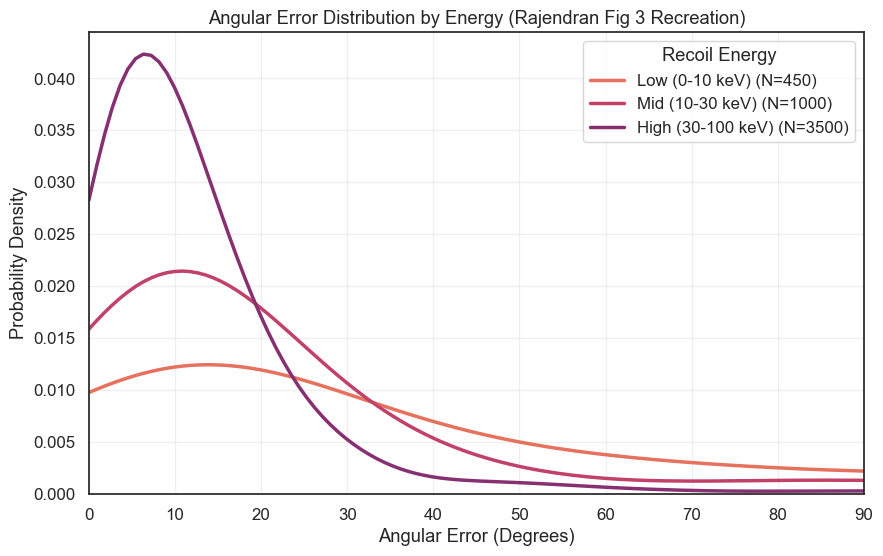

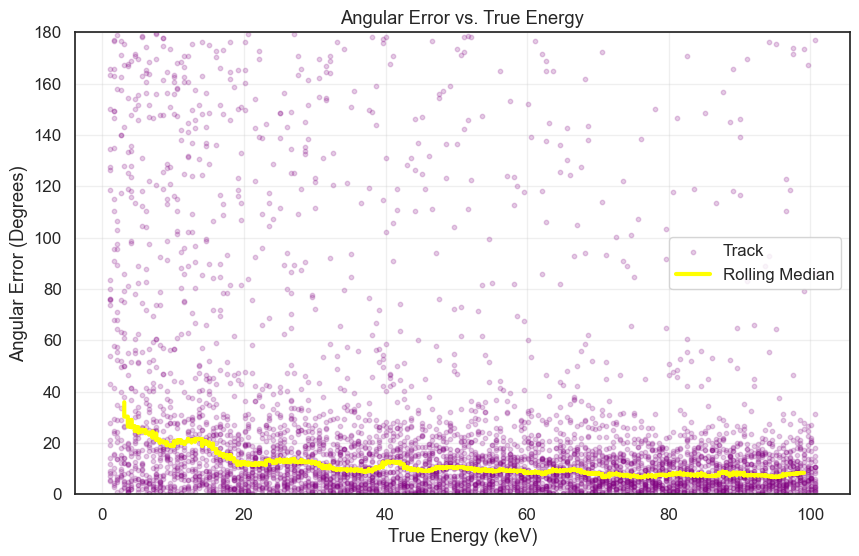

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# Ensure plots display inline in the notebook
%matplotlib inline

# ==========================================
# 1. CONFIGURATION
# ==========================================
RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe_continuous_eval_results.csv"

# Set visual style
sns.set_theme(style="white", font_scale=1.1)

def run_analysis():
    # ==========================================
    # 2. LOAD DATA
    # ==========================================
    if not Path(RESULTS_PATH).exists():
        print(f"ERROR: File not found at {RESULTS_PATH}")
        return

    print(f"Loading results from: {RESULTS_PATH}")
    df = pd.read_csv(RESULTS_PATH)
    print(f"Successfully loaded {len(df)} tracks.\n")

    # ==========================================
    # 3. STATISTICAL ANALYSIS
    # ==========================================
    # A. Energy Binning (Rajendran Logic)
    bins = [0, 10, 30, 100]
    labels = ['Low (0-10 keV)', 'Mid (10-30 keV)', 'High (30-100 keV)']
    df['energy_bin'] = pd.cut(df['true_energy'], bins=bins, labels=labels)

    # B. Performance Summary
    print("="*40)
    print("   PERFORMANCE BY ENERGY BIN")
    print("="*40)
    summary = df.groupby('energy_bin', observed=True)[['energy_error', 'angular_error']].median()
    display(summary) # Use display() for pretty Pandas formatting in Jupyter

    # C. Head/Tail Failure Rate (>150 deg error)
    df['is_flipped'] = df['angular_error'] > 150
    flip_rate = df.groupby('energy_bin', observed=True)['is_flipped'].mean() * 100
    
    print("\n" + "-"*40)
    print("   HEAD/TAIL FAILURE RATE (>150°)")
    print("-" * 40)
    print(flip_rate.to_string(float_format="{:.2f}%".format))
    print("\n")

    # ==========================================
    # 4. PLOT 1: RAJENDRAN RECREATION (KDE)
    # ==========================================
    plt.figure(figsize=(10, 6))
    palette = sns.color_palette("flare", n_colors=len(labels))

    for i, bin_label in enumerate(labels):
        subset = df[df['energy_bin'] == bin_label]
        if len(subset) > 10:
            sns.kdeplot(
                subset['angular_error'], 
                label=f"{bin_label} (N={len(subset)})", 
                linewidth=2.5, 
                color=palette[i],
                clip=(0, 180) # Physics limits
            )

    plt.xlim(0, 90)
    plt.title("Angular Error Distribution by Energy (Rajendran Fig 3 Recreation)")
    plt.xlabel("Angular Error (Degrees)")
    plt.ylabel("Probability Density")
    plt.legend(title="Recoil Energy")
    plt.grid(True, alpha=0.3)
    
    plt.show() # Render inline

    # ==========================================
    # 5. PLOT 2: ENERGY vs ERROR TREND
    # ==========================================
    plt.figure(figsize=(10, 6))
    
    # Scatter points
    plt.scatter(df['true_energy'], df['angular_error'], alpha=0.2, s=10, c='purple', label='Track')
    
    # Rolling Median Line
    df_sorted = df.sort_values('true_energy')
    rolling_median = df_sorted['angular_error'].rolling(window=200, center=True).median()
    plt.plot(df_sorted['true_energy'], rolling_median, color='yellow', linewidth=3.0, label='Rolling Median')
    
    plt.ylim(0, 180)
    plt.title("Angular Error vs. True Energy")
    plt.xlabel("True Energy (keV)")
    plt.ylabel("Angular Error (Degrees)")
    plt.legend()
    plt.grid(True, alpha=0.3)

    plt.show() # Render inline

# Execute
run_analysis()

<>:86: SyntaxWarning: invalid escape sequence '\m'
<>:86: SyntaxWarning: invalid escape sequence '\s'
<>:86: SyntaxWarning: invalid escape sequence '\m'
<>:86: SyntaxWarning: invalid escape sequence '\s'
/var/folders/wv/wqt6hj5j10x18q4_x16rqnvc0000gn/T/ipykernel_1329/3673310062.py:86: SyntaxWarning: invalid escape sequence '\m'
  plt.title(f"Percent Error Dist ($\mu$={mu:.3f}, $\sigma$={sigma:.3f})")
/var/folders/wv/wqt6hj5j10x18q4_x16rqnvc0000gn/T/ipykernel_1329/3673310062.py:86: SyntaxWarning: invalid escape sequence '\s'
  plt.title(f"Percent Error Dist ($\mu$={mu:.3f}, $\sigma$={sigma:.3f})")


Loading /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv...
[Heatmap] Scaling colors to 95th percentile: 33.41°
[Plot 1] Saved Robust Heatmap to /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/analysis/diagnostic_heatmap_robust2.png
[Plot 2] Saved Energy Resolution to /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/analysis/energy_resolution2.png
[Plot 3] Saved Compass Plot to /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/analysis/compass_bias_check2.png


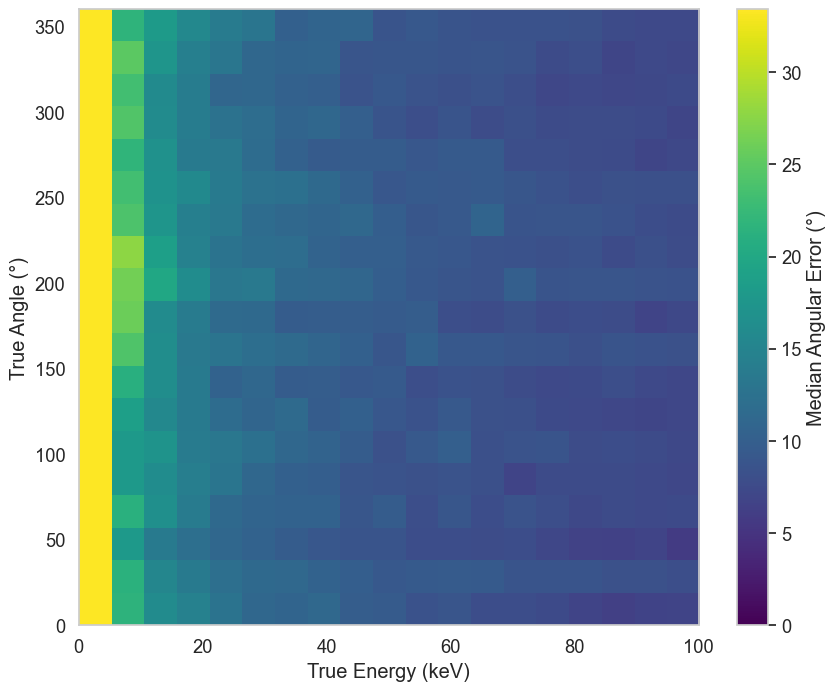

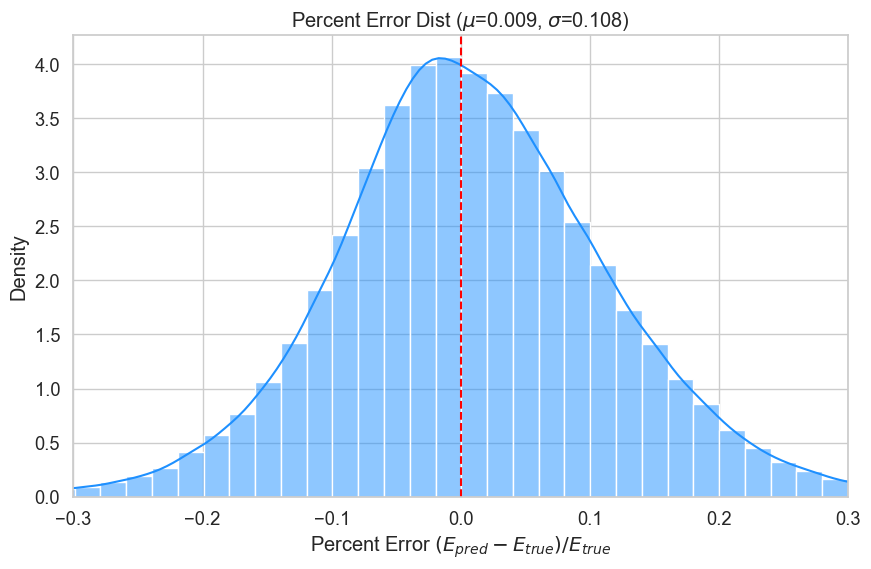

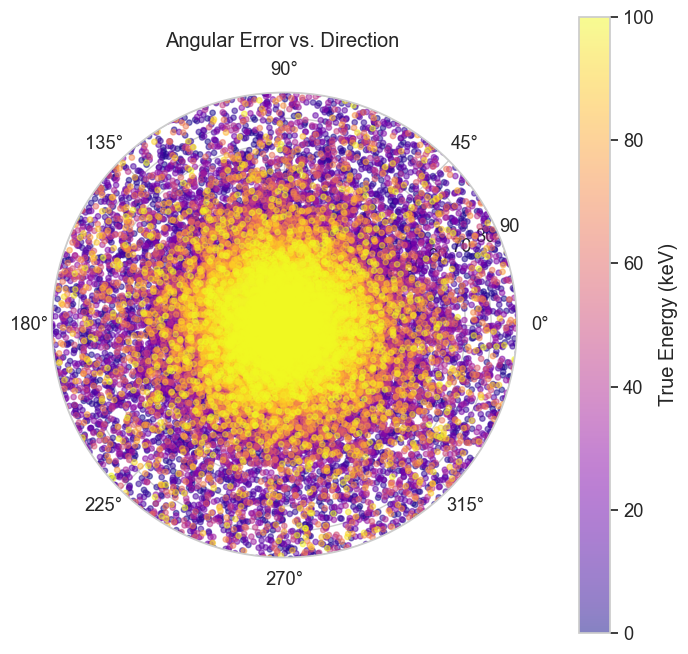

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# CONFIGURATION
RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv"
OUTPUT_DIR = Path("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/analysis")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

sns.set_theme(style="whitegrid", font_scale=1.2)

def main():
    print(f"Loading {RESULTS_PATH}...")
    df = pd.read_csv(RESULTS_PATH)
    
 # ---------------------------------------------------------
    # PLOT 1: The "Blind Spot" Heatmap (Robust Scaling)
    # ---------------------------------------------------------
    plt.figure(figsize=(10, 8))
    
    # 1. Define Bins
    x_bins = np.linspace(0, 100, 20)
    y_bins = np.linspace(0, 360, 20)
    
    # 2. Compute Median Error in each bin
    ret = stats.binned_statistic_2d(
        df['true_energy'], 
        df['true_angle'], 
        df['angular_error'], 
        statistic='median', 
        bins=[x_bins, y_bins]
    )
    
    # 3. ROBUST SCALING LOGIC
    # We set the max color (vmax) to the 95th percentile of the errors.
    # This means the worst 5% of bins will be bright yellow, but they won't 
    # stretch the scale and wash out the other 95% of the data.
    robust_max = np.nanpercentile(ret.statistic, 95)
    print(f"[Heatmap] Scaling colors to 95th percentile: {robust_max:.2f}°")

    plt.imshow(
        ret.statistic.T, 
        origin='lower', 
        extent=[0, 100, 0, 360], 
        aspect='auto', 
        cmap='viridis',
        vmin=0, vmax=robust_max # <--- Uses robust max instead of absolute max
    )
    
    cbar = plt.colorbar()
    cbar.set_label('Median Angular Error (°)')
    plt.xlabel('True Energy (keV)')
    plt.ylabel('True Angle (°)')
    plt.title(f'')
    plt.grid(False)
    
    save_path = OUTPUT_DIR / "diagnostic_heatmap_robust2.png"
    plt.savefig(save_path, dpi=300)
    print(f"[Plot 1] Saved Robust Heatmap to {save_path}")

    # ---------------------------------------------------------
    # PLOT 2: Fractional Energy Resolution
    # ---------------------------------------------------------
    plt.figure(figsize=(10, 6))
    
    # Metric: (Pred - True) / True
    df['frac_energy_res'] = (df['pred_energy'] - df['true_energy']) / df['true_energy']
    
    # Filter extremes for clean plotting
    clean_res = df[df['frac_energy_res'].abs() < 0.5]
    
    sns.histplot(
        clean_res['frac_energy_res'], 
        bins=50, 
        kde=True, 
        color='dodgerblue',
        stat='density'
    )
    
    # Add Gaussian fit text or simple stats
    mu = clean_res['frac_energy_res'].mean()
    sigma = clean_res['frac_energy_res'].std()
    
    plt.title(f"Percent Error Dist ($\mu$={mu:.3f}, $\sigma$={sigma:.3f})")
    plt.xlabel("Percent Error $(E_{pred} - E_{true}) / E_{true}$")
    plt.ylabel("Density")
    plt.xlim(-0.3, 0.3) # Show +/- 30% range
    plt.axvline(0, color='red', linestyle='--')
    
    save_path = OUTPUT_DIR / "energy_resolution2.png"
    plt.savefig(save_path, dpi=300)
    print(f"[Plot 2] Saved Energy Resolution to {save_path}")

    # ---------------------------------------------------------
    # PLOT 3: The "Compass" (Polar Bias Check)
    # ---------------------------------------------------------
    plt.figure(figsize=(8, 8))
    ax = plt.subplot(111, projection='polar')
    
    # Convert true angle to radians for polar plot
    theta = np.radians(df['true_angle'])
    
    # Plot errors as scatter points
    # Points closer to center = Good. Points at edge = Bad.
    sc = ax.scatter(
        theta, 
        df['angular_error'], 
        c=df['true_energy'], # Color by energy
        cmap='plasma', 
        s=15, 
        alpha=0.5,
        vmin=0, vmax=100
    )
    
    ax.set_theta_zero_location("E") # 0 degrees at East (Right)
    ax.set_rlim(0, 90) # Limit error view to 90 degrees
    ax.set_title("Angular Error vs. Direction ", y=1.08)
    
    cbar = plt.colorbar(sc, pad=0.1)
    cbar.set_label('True Energy (keV)')
    
    save_path = OUTPUT_DIR / "compass_bias_check2.png"
    plt.savefig(save_path, dpi=300)
    print(f"[Plot 3] Saved Compass Plot to {save_path}")
    
    plt.show()

# Need scipy for binned stats
from scipy import stats

if __name__ == "__main__":
    main()

<>:120: SyntaxWarning: invalid escape sequence '\m'
<>:120: SyntaxWarning: invalid escape sequence '\s'
<>:120: SyntaxWarning: invalid escape sequence '\m'
<>:120: SyntaxWarning: invalid escape sequence '\s'
/var/folders/wv/wqt6hj5j10x18q4_x16rqnvc0000gn/T/ipykernel_1329/2375936155.py:120: SyntaxWarning: invalid escape sequence '\m'
  plt.title(f"Percent Error Dist ($\mu$={mu:.3f}, $\sigma$={sigma:.3f})")
/var/folders/wv/wqt6hj5j10x18q4_x16rqnvc0000gn/T/ipykernel_1329/2375936155.py:120: SyntaxWarning: invalid escape sequence '\s'
  plt.title(f"Percent Error Dist ($\mu$={mu:.3f}, $\sigma$={sigma:.3f})")


Loading /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv...
Generating Global High-Res Heatmap...
[Plot 1A] Saved to /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/analysis/heatmap_global_highres.png
Generating Low-Energy Zoom Heatmap...
[Plot 1B] Saved to /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/analysis/heatmap_zoom_low_energy.png
[Plot 2] Saved Energy Resolution to /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/analysis/energy_resolution2.png
[Plot 3] Saved Compass Plot to /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/analysis/compass_bias_check2.png


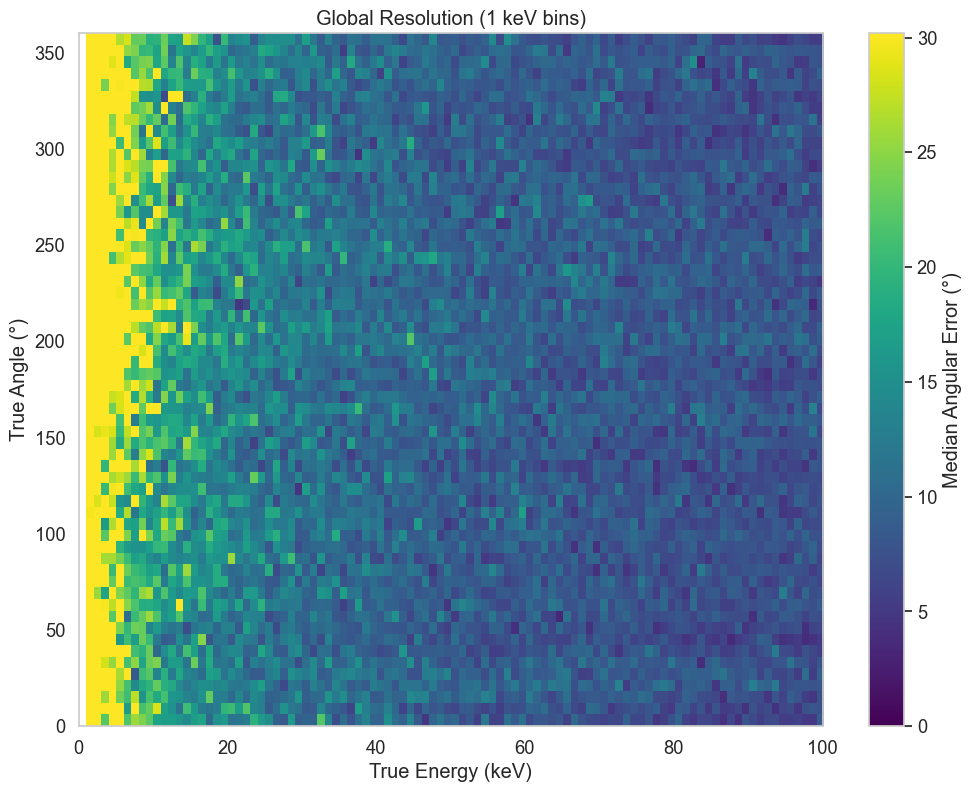

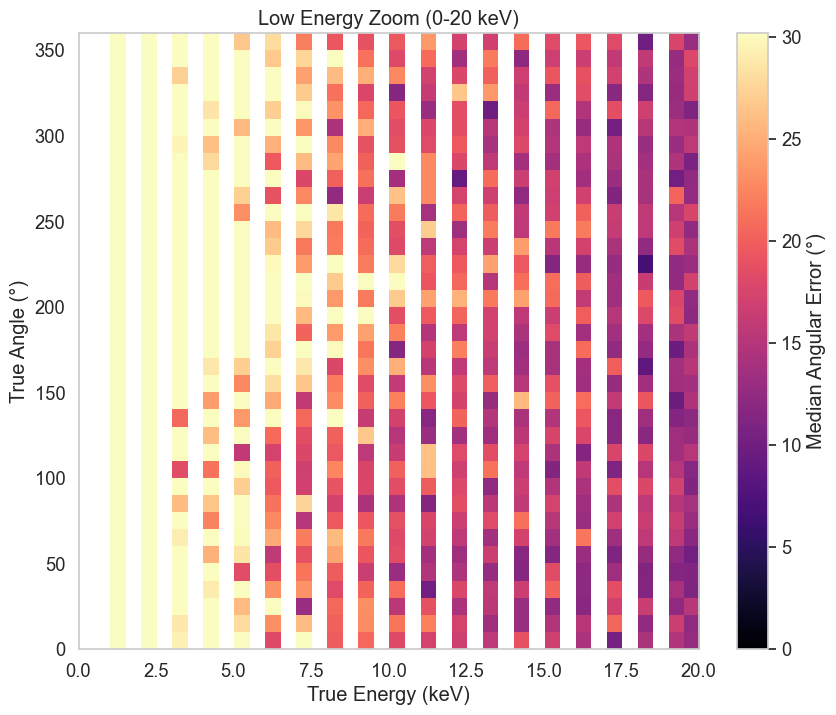

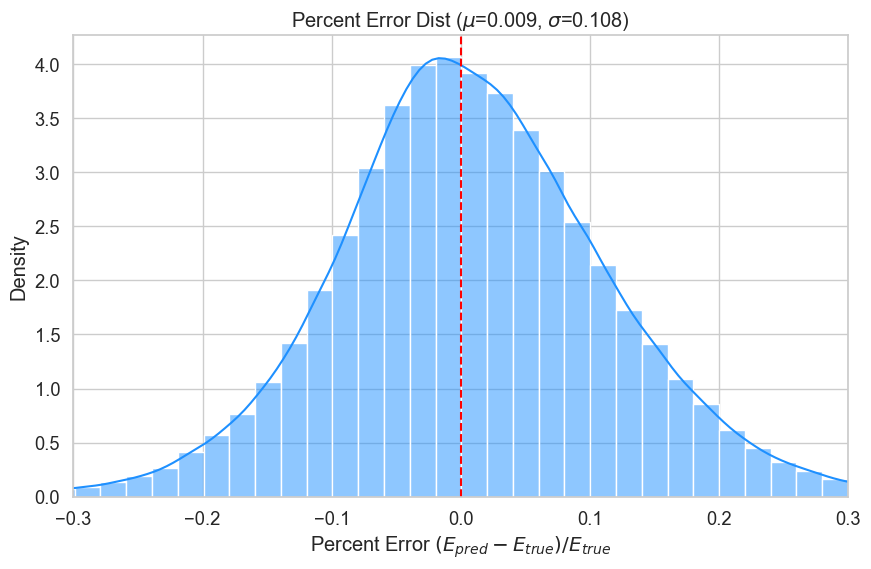

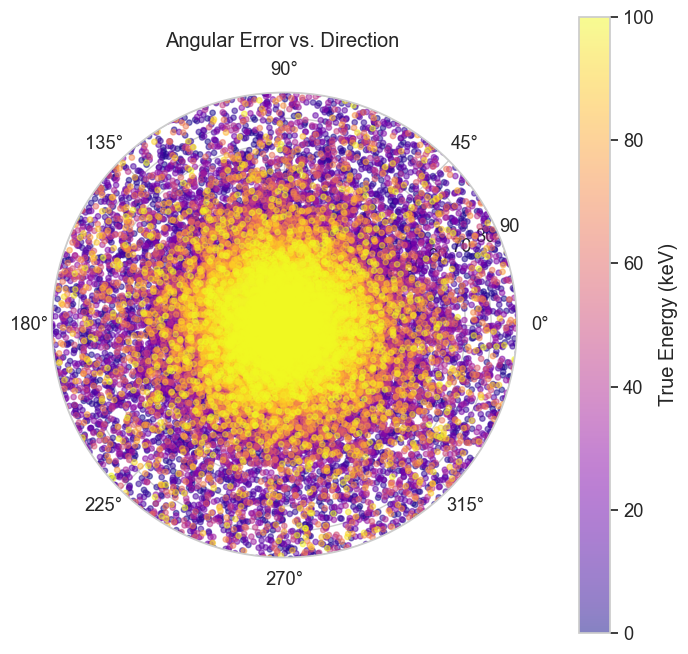

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import stats # Required for binned_statistic_2d

# CONFIGURATION
RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv"
OUTPUT_DIR = Path("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/analysis")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

sns.set_theme(style="whitegrid", font_scale=1.2)

def main():
    print(f"Loading {RESULTS_PATH}...")
    df = pd.read_csv(RESULTS_PATH)
    
    # =========================================================
    # PLOT 1A: GLOBAL HIGH-RES HEATMAP (0-100 keV)
    # =========================================================
    print("Generating Global High-Res Heatmap...")
    plt.figure(figsize=(12, 9))
    
    # FIX: Increase bins from 20 -> 100 for 1 keV resolution
    x_bins = np.linspace(0, 100, 101) 
    y_bins = np.linspace(0, 360, 61)  # 6 degree resolution for angle
    
    ret = stats.binned_statistic_2d(
        df['true_energy'], 
        df['true_angle'], 
        df['angular_error'], 
        statistic='median', 
        bins=[x_bins, y_bins]
    )
    
    # Robust Scaling (95th percentile)
    robust_max = np.nanpercentile(ret.statistic, 95)
    
    plt.imshow(
        ret.statistic.T, 
        origin='lower', 
        extent=[0, 100, 0, 360], 
        aspect='auto', 
        cmap='viridis',
        vmin=0, vmax=robust_max
    )
    
    cbar = plt.colorbar()
    cbar.set_label('Median Angular Error (°)')
    plt.xlabel('True Energy (keV)')
    plt.ylabel('True Angle (°)')
    plt.title(f'Global Resolution (1 keV bins)')
    plt.grid(False)
    
    save_path = OUTPUT_DIR / "heatmap_global_highres.png"
    plt.savefig(save_path, dpi=300)
    print(f"[Plot 1A] Saved to {save_path}")

    # =========================================================
    # PLOT 1B: LOW-ENERGY ZOOM (0-20 keV)
    # This is critical to see the "Blob Limit" boundary
    # =========================================================
    print("Generating Low-Energy Zoom Heatmap...")
    plt.figure(figsize=(10, 8))
    
    # Filter data for just the band we care about
    df_zoom = df[df['true_energy'] <= 20]
    
    # Super fine bins: 0.5 keV resolution
    x_bins_zoom = np.linspace(0, 20, 41) 
    y_bins_zoom = np.linspace(0, 360, 37) # 10 degree resolution
    
    ret_zoom = stats.binned_statistic_2d(
        df_zoom['true_energy'], 
        df_zoom['true_angle'], 
        df_zoom['angular_error'], 
        statistic='median', 
        bins=[x_bins_zoom, y_bins_zoom]
    )
    
    plt.imshow(
        ret_zoom.statistic.T, 
        origin='lower', 
        extent=[0, 20, 0, 360], 
        aspect='auto', 
        cmap='magma', # Different color map to distinguish zoom
        vmin=0, vmax=robust_max 
    )
    
    cbar = plt.colorbar()
    cbar.set_label('Median Angular Error (°)')
    plt.xlabel('True Energy (keV)')
    plt.ylabel('True Angle (°)')
    plt.title(f'Low Energy Zoom (0-20 keV)')
    plt.grid(False)
    
    save_path = OUTPUT_DIR / "heatmap_zoom_low_energy.png"
    plt.savefig(save_path, dpi=300)
    print(f"[Plot 1B] Saved to {save_path}")

    # ---------------------------------------------------------
    # PLOT 2: Fractional Energy Resolution
    # ---------------------------------------------------------
    plt.figure(figsize=(10, 6))
    df['frac_energy_res'] = (df['pred_energy'] - df['true_energy']) / df['true_energy']
    clean_res = df[df['frac_energy_res'].abs() < 0.5]
    
    sns.histplot(
        clean_res['frac_energy_res'], 
        bins=50, 
        kde=True, 
        color='dodgerblue',
        stat='density'
    )
    
    mu = clean_res['frac_energy_res'].mean()
    sigma = clean_res['frac_energy_res'].std()
    
    plt.title(f"Percent Error Dist ($\mu$={mu:.3f}, $\sigma$={sigma:.3f})")
    plt.xlabel("Percent Error $(E_{pred} - E_{true}) / E_{true}$")
    plt.ylabel("Density")
    plt.xlim(-0.3, 0.3)
    plt.axvline(0, color='red', linestyle='--')
    
    save_path = OUTPUT_DIR / "energy_resolution2.png"
    plt.savefig(save_path, dpi=300)
    print(f"[Plot 2] Saved Energy Resolution to {save_path}")

    # ---------------------------------------------------------
    # PLOT 3: The "Compass" (Polar Bias Check)
    # ---------------------------------------------------------
    plt.figure(figsize=(8, 8))
    ax = plt.subplot(111, projection='polar')
    theta = np.radians(df['true_angle'])
    
    sc = ax.scatter(
        theta, 
        df['angular_error'], 
        c=df['true_energy'], 
        cmap='plasma', 
        s=15, 
        alpha=0.5,
        vmin=0, vmax=100
    )
    
    ax.set_theta_zero_location("E")
    ax.set_rlim(0, 90)
    ax.set_title("Angular Error vs. Direction ", y=1.08)
    
    cbar = plt.colorbar(sc, pad=0.1)
    cbar.set_label('True Energy (keV)')
    
    save_path = OUTPUT_DIR / "compass_bias_check2.png"
    plt.savefig(save_path, dpi=300)
    print(f"[Plot 3] Saved Compass Plot to {save_path}")
    
    plt.show()

if __name__ == "__main__":
    main()

In [45]:
import pandas as pd

# CONFIGURATION
RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv"


def get_simple_medians():
    print(f"Loading {RESULTS_PATH}...")
    df = pd.read_csv(RESULTS_PATH)
    
    # 1. Calculate Percent Error for Energy
    # Formula: |(Pred - True) / True| * 100
    df['energy_pct_error'] = (abs(df['pred_energy'] - df['true_energy']) / df['true_energy']) * 100

    # 2. Get Medians
    median_energy_pct = df['energy_pct_error'].median()
    median_angle_err = df['angular_error'].median()
    
    print("\n" + "="*30)
    print("      FINAL RESULTS")
    print("="*30)
    print(f"Median Energy Error: {median_energy_pct:.2f}%")
    print(f"Median Angle Error:  {median_angle_err:.2f}°")
    print("="*30 + "\n")

if __name__ == "__main__":
    get_simple_medians()

Loading /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv...

      FINAL RESULTS
Median Energy Error: 6.73%
Median Angle Error:  10.22°



Calculating Geometric Baseline (Rajendran Method)...
Comparison plot saved to: /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/rajendran_vs_nn_comparison.png


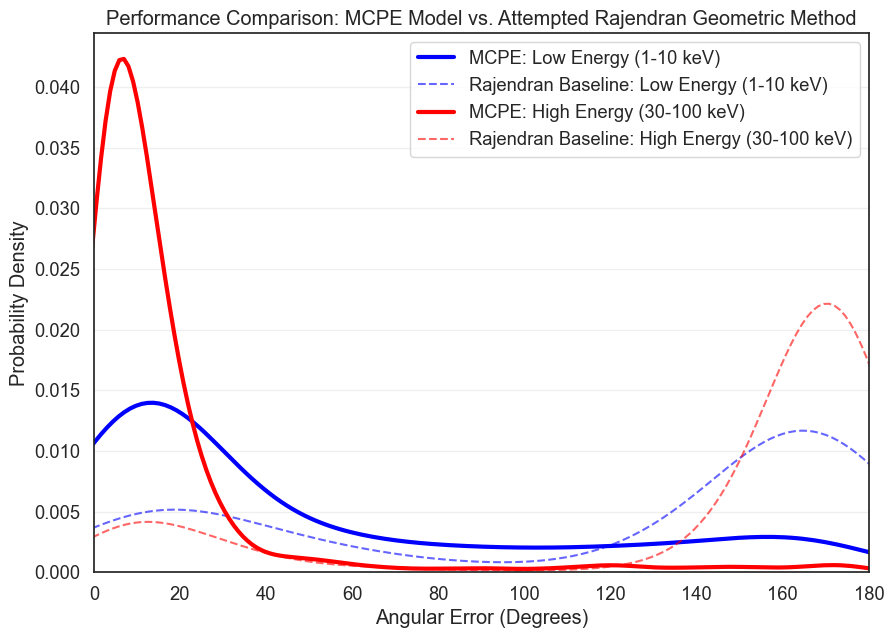

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from scipy.stats import kde
import os

# PATHS
EVAL_DATA_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MDPE_EVAL_CONTINUOUS_FIXED2_5k.csv"
NN_RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe_continuous_eval_results.csv"
OUTPUT_PLOT = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/rajendran_vs_nn_comparison.png"

def get_angular_diff(a, b):
    diff = np.abs(a - b)
    return np.minimum(diff, 360 - diff)

def run_geometric_baseline(df):
    """
    Implements the Rajendran-style Geometric Baseline:
    1. PCA to find the principal axis (the spine).
    2. Density check to find the Head-Tail direction (the arrow).
    """
    baseline_results = []
    
    print("Calculating Geometric Baseline (Rajendran Method)...")
    # Group by track (ion #)
    grouped = df.groupby('ion #')
    
    for ion_id, track in grouped:
        coords = track[['x', 'y']].values
        true_angle = track['theta_deg'].iloc[0]
        energy = track['energy_keV'].iloc[0]
        
        if len(coords) < 3: continue # Skip tiny tracks
        
        # 1. PCA: Find the 'Spine' of the track
        pca = PCA(n_components=1)
        pca.fit(coords)
        spine_vector = pca.components_[0] # Unit vector of the spine
        
        # 2. Head-Tail Asymmetry Check
        # Project all points onto the spine vector
        projections = coords @ spine_vector
        
        # Heuristic: The Bragg Peak is at the 'end' of the track.
        # We define the direction as pointing towards the 'dense' end.
        # If the points are skewed towards the high values of projections,
        # then the spine_vector is pointing in the right direction.
        if np.mean(projections) < np.median(projections):
            spine_vector = -spine_vector
            
        # Convert spine vector to angle (0-360)
        pred_angle = np.degrees(np.arctan2(spine_vector[1], spine_vector[0])) % 360
        
        error = get_angular_diff(pred_angle, true_angle)
        
        baseline_results.append({
            'track_id': ion_id,
            'energy': energy,
            'baseline_error': error
        })
        
    return pd.DataFrame(baseline_results)

def plot_comparison(nn_df, baseline_df):
    sns.set_theme(style="white", font_scale=1.2)
    plt.figure(figsize=(10, 7))
    
    # Define Energy Bins similar to the paper
    energy_bins = [
        (0, 15, 'Low Energy (1-10 keV)', 'blue'),
        (30, 100, 'High Energy (30-100 keV)', 'red')
    ]
    
    for e_min, e_max, label, color in energy_bins:
        # Filter NN Results
        nn_subset = nn_df[(nn_df['true_energy'] >= e_min) & (nn_df['true_energy'] <= e_max)]
        # Filter Baseline Results
        base_subset = baseline_df[(baseline_df['energy'] >= e_min) & (baseline_df['energy'] <= e_max)]
        
        # Plot NN (Solid Line)
        sns.kdeplot(nn_subset['angular_error'], color=color, label=f"MCPE: {label}", lw=3)
        
        # Plot Geometric Baseline (Dashed Line)
        sns.kdeplot(base_subset['baseline_error'], color=color, ls='--', alpha=0.6, label=f"Rajendran Baseline: {label}")

    plt.title("Performance Comparison: MCPE Model vs. Attempted Rajendran Geometric Method")
    plt.xlabel("Angular Error (Degrees)")
    plt.ylabel("Probability Density")
    plt.xlim(0, 180)
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    
    plt.savefig(OUTPUT_PLOT, dpi=300)
    print(f"Comparison plot saved to: {OUTPUT_PLOT}")

if __name__ == "__main__":
    if not os.path.exists(EVAL_DATA_PATH) or not os.path.exists(NN_RESULTS_PATH):
        print("Error: Missing data files.")
    else:
        eval_df = pd.read_csv(EVAL_DATA_PATH)
        nn_results = pd.read_csv(NN_RESULTS_PATH)
        
        baseline_results = run_geometric_baseline(eval_df)
        plot_comparison(nn_results, baseline_results)

[INIT] Starting Geometric Baseline Benchmarking...
[INFO] Processing 202000 raw tracks for baseline...
[DONE] Plot saved to: /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/geometric_metric_comparison_v2.png


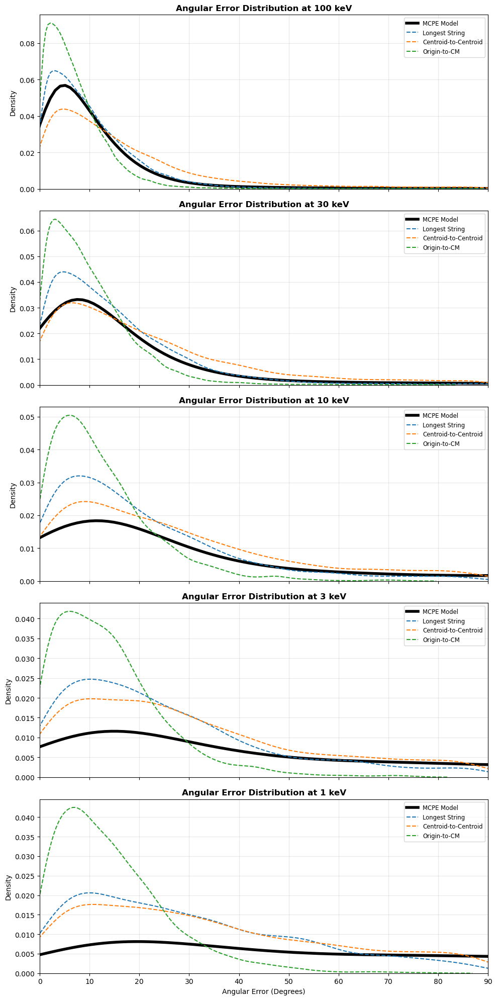

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
import os

# --- PATHS ---
# raw_eval_data: The file with individual (x,y,z) hits for each ion
# mcpe_results: The file with your model's predictions (track_id, true_energy, angular_error)
RAW_EVAL_DATA = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_250k.csv"
MCPE_RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv"
OUTPUT_PLOT = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/geometric_metric_comparison_v2.png"

def get_angular_diff(a, b):
    diff = np.abs(a - b)
    return np.minimum(diff, 360 - diff)

def run_geometric_baselines(df):
    """
    Implements geometric metrics using raw track coordinates.
    """
    results = []
    # Identify unique tracks based on your data structure
    id_col = 'ion_number' if 'ion_number' in df.columns else 'ion #'
    grouped = df.groupby(['energy_keV', id_col])
    
    print(f"[INFO] Processing {len(grouped)} raw tracks for baseline...")
    
    for (energy, ion_id), track in grouped:
        coords = track[['x', 'y']].values
        true_angle = track['theta_deg'].iloc[0]
        if len(coords) < 5: continue

        # METRIC 1: LONGEST DISTANCE (Max span)
        dist_matrix = squareform(pdist(coords))
        i, j = np.unravel_index(dist_matrix.argmax(), dist_matrix.shape)
        v_max_dist = coords[j] - coords[i]
        
        # METRIC 2: CENTROID-TO-CENTROID (Thirds division)
        # Sort by Z (depth) to find the beginning vs end of track
        z_sorted = track.sort_values('z')
        n = len(z_sorted)
        first_third = z_sorted.iloc[:n//3][['x', 'y']].mean().values
        last_third = z_sorted.iloc[2*n//3:][['x', 'y']].mean().values
        v_centroid_thirds = last_third - first_third

        # METRIC 3: ORIGIN-TO-CENTROID
        # Assumes origin (0,0) is where the ion entered
        overall_centroid = coords.mean(axis=0)
        v_origin_centroid = overall_centroid - np.array([0, 0])

        angles = {
            'max_dist': np.degrees(np.arctan2(v_max_dist[1], v_max_dist[0])) % 360,
            'thirds': np.degrees(np.arctan2(v_centroid_thirds[1], v_centroid_thirds[0])) % 360,
            'origin_cm': np.degrees(np.arctan2(v_origin_centroid[1], v_origin_centroid[0])) % 360
        }

        # Apply head-tail correction (Rajendran Figure 3 logic)
        for key in angles:
            err = get_angular_diff(angles[key], true_angle)
            if err > 90: 
                err = get_angular_diff((angles[key] + 180) % 360, true_angle)
            results.append({
                'track_id': f"E{int(energy)}_ion{int(ion_id)}", 
                'energy': energy, 
                'method': key, 
                'error': err
            })

    return pd.DataFrame(results)

def plot_multi_energy_comparison(mcpe_df, baseline_df):
    # Standard energies from Rajendran Fig 3
    target_energies = [100, 30, 10, 3, 1]
    fig, axes = plt.subplots(len(target_energies), 1, figsize=(10, 20), sharex=True)
    
    methods = {'max_dist': 'Longest String', 'thirds': 'Centroid-to-Centroid', 'origin_cm': 'Origin-to-CM'}
    
    for ax, energy in zip(axes, target_energies):
        # Filtering with tolerances for continuous training data
        tol = energy * 0.1 if energy >= 10 else 0.5
        mcpe_sub = mcpe_df[np.abs(mcpe_df['true_energy'] - energy) < tol]
        base_sub = baseline_df[np.abs(baseline_df['energy'] - energy) < tol]
        
        if len(mcpe_sub) > 0:
            sns.kdeplot(mcpe_sub['angular_error'], label="MCPE Model", lw=4, color='black', ax=ax)
            
            for m_key, m_label in methods.items():
                m_data = base_sub[base_sub['method'] == m_key]
                if len(m_data) > 0:
                    sns.kdeplot(m_data['error'], label=m_label, ls='--', ax=ax)
        
        ax.set_title(f"Angular Error Distribution at {energy} keV", fontweight='bold')
        ax.set_ylabel("Density")
        ax.set_xlim(0, 90)
        ax.grid(alpha=0.3)
        ax.legend(loc='upper right', fontsize='small')

    plt.xlabel("Angular Error (Degrees)")
    plt.tight_layout()
    plt.savefig(OUTPUT_PLOT, dpi=300)
    print(f"[DONE] Plot saved to: {OUTPUT_PLOT}")

if __name__ == "__main__":
    print("[INIT] Starting Geometric Baseline Benchmarking...")
    
    # 1. Load data
    if os.path.exists(RAW_EVAL_DATA) and os.path.exists(MCPE_RESULTS_PATH):
        raw_df = pd.read_csv(RAW_EVAL_DATA)
        # Clean column names
        raw_df.columns = [c.strip() for c in raw_df.columns]
        
        mcpe_results = pd.read_csv(MCPE_RESULTS_PATH)
        
        # 2. Run Baselines
        baseline_results = run_geometric_baselines(raw_df)
        
        # 3. Plot
        plot_multi_energy_comparison(mcpe_results, baseline_results)
    else:
        print("[ERROR] Check your file paths.")

[INFO] Generating Rajendran Figure 3 (Right) Replication...


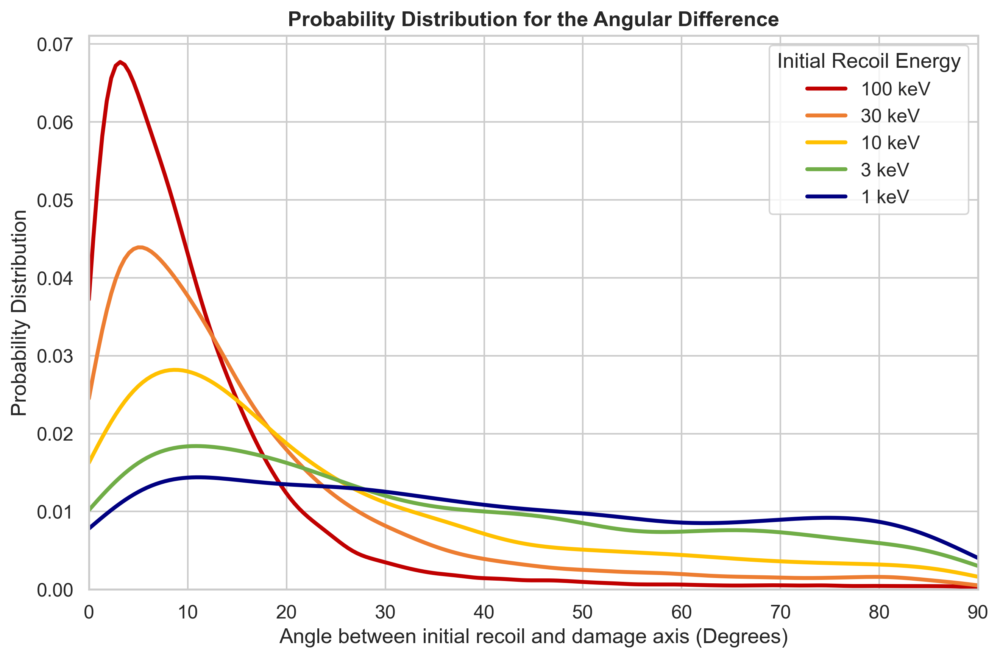

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import os

# --- PATHS ---
RAW_EVAL_DATA = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_250k.csv"
MCPE_RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv"

def calculate_rajendran_pca_baseline(raw_df):
    """
    Calculates the Rajendran 'Damage Axis' using Principal Component Analysis (PCA).
    """
    results = []
    # Identify unique tracks
    id_col = 'ion_number' if 'ion_number' in raw_df.columns else 'ion #'
    grouped = raw_df.groupby(['energy_keV', id_col])
    
    print(f"[INFO] Calculating Rajendran PCA Baseline for {len(grouped)} tracks...")
    
    for (energy, ion_id), track in grouped:
        # Assuming 2D projection for angle (update to ['x', 'y', 'z'] if doing full 3D polar/azimuthal)
        coords = track[['x', 'y']].values 
        true_angle = track['theta_deg'].iloc[0]
        
        if len(coords) < 2: 
            continue

        # PCA finds the line of best fit (the principal damage axis)
        pca = PCA(n_components=1)
        pca.fit(coords)
        v = pca.components_[0]
        
        # Calculate the angle of this principal axis
        pca_angle = np.degrees(np.arctan2(v[1], v[0])) % 360
        
        # Calculate the UNDIRECTED axis error (0 to 90 degrees)
        diff = np.abs(pca_angle - true_angle) % 180
        axis_error = np.minimum(diff, 180 - diff)
        
        results.append({
            'track_id': f"E{float(energy)}_ion{int(ion_id)}", 
            'true_energy': energy, 
            'rajendran_axis_error': axis_error
        })

    return pd.DataFrame(results)

def main():
    print("[INIT] Starting Master Benchmark Comparison...")
    
    if not (os.path.exists(RAW_EVAL_DATA) and os.path.exists(MCPE_RESULTS_PATH)):
        print("[ERROR] Check your file paths.")
        return

    # 1. Load the data
    raw_df = pd.read_csv(RAW_EVAL_DATA)
    raw_df.columns = [c.strip() for c in raw_df.columns]
    mcpe_df = pd.read_csv(MCPE_RESULTS_PATH)
    
    #import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import os

# --- PATHS ---
RAW_EVAL_DATA = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_250k.csv"
MCPE_RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv"

def calculate_rajendran_pca_baseline(raw_df):
    """
    Calculates the Rajendran 'Damage Axis' using Principal Component Analysis (PCA).
    """
    results = []
    # Identify unique tracks
    id_col = 'ion_number' if 'ion_number' in raw_df.columns else 'ion #'
    grouped = raw_df.groupby(['energy_keV', id_col])
    
    print(f"[INFO] Calculating Rajendran PCA Baseline for {len(grouped)} tracks...")
    
    for (energy, ion_id), track in grouped:
        # Assuming 2D projection for angle (update to ['x', 'y', 'z'] if doing full 3D polar/azimuthal)
        coords = track[['x', 'y']].values 
        true_angle = track['theta_deg'].iloc[0]
        
        if len(coords) < 2: 
            continue

        # PCA finds the line of best fit (the principal damage axis)
        pca = PCA(n_components=1)
        pca.fit(coords)
        v = pca.components_[0]
        
        # Calculate the angle of this principal axis
        pca_angle = np.degrees(np.arctan2(v[1], v[0])) % 360
        
        # Calculate the UNDIRECTED axis error (0 to 90 degrees)
        diff = np.abs(pca_angle - true_angle) % 180
        axis_error = np.minimum(diff, 180 - diff)
        
        results.append({
            'track_id': f"E{float(energy)}_ion{int(ion_id)}", 
            'true_energy': energy, 
            'rajendran_axis_error': axis_error
        })

    return pd.DataFrame(results)

def main():
    print("[INIT] Starting Master Benchmark Comparison...")
    
    if not (os.path.exists(RAW_EVAL_DATA) and os.path.exists(MCPE_RESULTS_PATH)):
        print("[ERROR] Check your file paths.")
        return

    # 1. Load the data
    raw_df = pd.read_csv(RAW_EVAL_DATA)
    raw_df.columns = [c.strip() for c in raw_df.columns]
    mcpe_df = pd.read_csv(MCPE_RESULTS_PATH)
    
    # 2. Convert MCPE directed angular error (0-180) to undirected axis error (0-90)
    mcpe_df['mcpe_axis_error'] = np.minimum(mcpe_df['angular_error'], 180 - mcpe_df['angular_error'])

    # 3. Calculate the mathematical baseline
    raj_df = calculate_rajendran_pca_baseline(raw_df)
    
    # 4. Set up the plots
    sns.set_theme(style="whitegrid", context="notebook", font_scale=1.1)
    target_energies = [100, 30, 10, 3, 1]
    
    fig, axes = plt.subplots(len(target_energies), 1, figsize=(8, 15), sharex=True)
    
    # 5. Plotting Loop
    for ax, energy in zip(axes, target_energies):
        tol = energy * 0.1 if energy >= 10 else 0.5
        
        # Filter subsets
        mcpe_sub = mcpe_df[np.abs(mcpe_df['true_energy'] - energy) < tol]
        raj_sub = raj_df[np.abs(raj_df['true_energy'] - energy) < tol]
        
        # Plot Neural Network
        if len(mcpe_sub) > 0:
            sns.kdeplot(mcpe_sub['mcpe_axis_error'], label="MCPE (Neural Net)", 
                        color='blue', lw=3, ax=ax, clip=(0, 90))
        
        # Plot Rajendran Baseline
        if len(raj_sub) > 0:
            sns.kdeplot(raj_sub['rajendran_axis_error'], label="Rajendran 2017 (PCA)", 
                        color='orange', ls='--', lw=3, ax=ax, clip=(0, 90))
            
        ax.set_title(f"Axis Error Distribution at {energy} keV", fontweight='bold')
        ax.set_ylabel("Probability Density")
        ax.set_xlim(0, 90)
        ax.legend(loc='upper right')

    plt.xlabel("Angle between initial recoil and damage axis (Degrees)")
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

[INIT] Starting Geometric Baseline Benchmarking...
[INFO] Calculating Geometric Baselines for 202000 tracks...


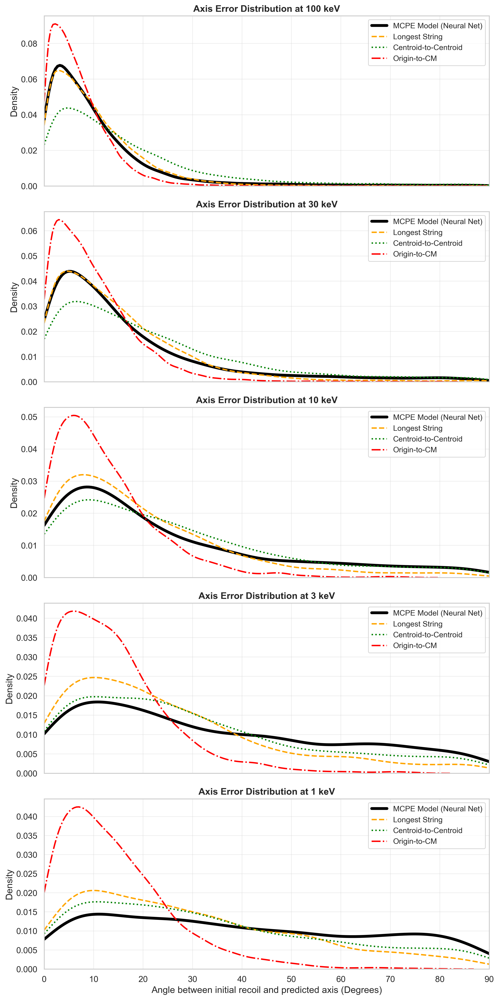

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
import os

# --- PATHS ---
RAW_EVAL_DATA = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_250k.csv"
MCPE_RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv"

def calculate_geometric_baselines(raw_df):
    """
    Implements your three custom geometric metrics and calculates the undirected axis error (0-90 deg).
    """
    results = []
    id_col = 'ion_number' if 'ion_number' in raw_df.columns else 'ion #'
    grouped = raw_df.groupby(['energy_keV', id_col])
    
    print(f"[INFO] Calculating Geometric Baselines for {len(grouped)} tracks...")
    
    for (energy, ion_id), track in grouped:
        coords = track[['x', 'y']].values
        true_angle = track['theta_deg'].iloc[0]
        if len(coords) < 5: 
            continue

        # METRIC 1: LONGEST DISTANCE (Max span)
        dist_matrix = squareform(pdist(coords))
        i, j = np.unravel_index(dist_matrix.argmax(), dist_matrix.shape)
        v_max_dist = coords[j] - coords[i]
        
        # METRIC 2: CENTROID-TO-CENTROID (Thirds division)
        z_sorted = track.sort_values('z')
        n = len(z_sorted)
        first_third = z_sorted.iloc[:n//3][['x', 'y']].mean().values
        last_third = z_sorted.iloc[2*n//3:][['x', 'y']].mean().values
        v_centroid_thirds = last_third - first_third

        # METRIC 3: ORIGIN-TO-CENTROID
        overall_centroid = coords.mean(axis=0)
        v_origin_centroid = overall_centroid - np.array([0, 0])

        angles = {
            'Longest String': np.degrees(np.arctan2(v_max_dist[1], v_max_dist[0])) % 360,
            'Centroid-to-Centroid': np.degrees(np.arctan2(v_centroid_thirds[1], v_centroid_thirds[0])) % 360,
            'Origin-to-CM': np.degrees(np.arctan2(v_origin_centroid[1], v_origin_centroid[0])) % 360
        }

        # Calculate undirected axis error (0 to 90 degrees) for all three methods
        for method, pred_angle in angles.items():
            # Fold the difference to find the closest axis alignment
            diff = np.abs(pred_angle - true_angle) % 180
            axis_error = np.minimum(diff, 180 - diff)
            
            results.append({
                'track_id': f"E{float(energy)}_ion{int(ion_id)}", 
                'true_energy': energy, 
                'method': method, 
                'axis_error': axis_error
            })

    return pd.DataFrame(results)

def main():
    print("[INIT] Starting Geometric Baseline Benchmarking...")
    
    if not (os.path.exists(RAW_EVAL_DATA) and os.path.exists(MCPE_RESULTS_PATH)):
        print("[ERROR] Check your file paths.")
        return
    
    # 1. Load data
    raw_df = pd.read_csv(RAW_EVAL_DATA)
    raw_df.columns = [c.strip() for c in raw_df.columns]
    mcpe_df = pd.read_csv(MCPE_RESULTS_PATH)
    
    # 2. Convert MCPE directed angular error (0-180) to undirected axis error (0-90)
    mcpe_df['mcpe_axis_error'] = np.minimum(mcpe_df['angular_error'], 180 - mcpe_df['angular_error'])
    
    # 3. Run geometric baselines
    baseline_df = calculate_geometric_baselines(raw_df)
    
    # 4. Plot setup
    sns.set_theme(style="whitegrid", context="notebook", font_scale=1.1)
    target_energies = [100, 30, 10, 3, 1]
    
    fig, axes = plt.subplots(len(target_energies), 1, figsize=(10, 20), sharex=True)
    
    method_styles = {
        'Longest String': {'color': 'orange', 'ls': '--'},
        'Centroid-to-Centroid': {'color': 'green', 'ls': ':'},
        'Origin-to-CM': {'color': 'red', 'ls': '-.'}
    }
    
    # 5. Iterative plotting
    for ax, energy in zip(axes, target_energies):
        tol = energy * 0.1 if energy >= 10 else 0.5
        
        # MCPE Neural Net Data
        mcpe_sub = mcpe_df[np.abs(mcpe_df['true_energy'] - energy) < tol]
        if len(mcpe_sub) > 0:
            sns.kdeplot(mcpe_sub['mcpe_axis_error'], label="MCPE Model (Neural Net)", 
                        lw=4, color='black', ax=ax, clip=(0, 90))
        
        # Baseline Data
        base_sub = baseline_df[np.abs(baseline_df['true_energy'] - energy) < tol]
        for m_key, style in method_styles.items():
            m_data = base_sub[base_sub['method'] == m_key]
            if len(m_data) > 0:
                sns.kdeplot(m_data['axis_error'], label=m_key, color=style['color'], 
                            ls=style['ls'], lw=2, ax=ax, clip=(0, 90))
        
        ax.set_title(f"Axis Error Distribution at {energy} keV", fontweight='bold')
        ax.set_ylabel("Density")
        ax.set_xlim(0, 90)
        ax.grid(alpha=0.3)
        ax.legend(loc='upper right', fontsize='small')

    plt.xlabel("Angle between initial recoil and predicted axis (Degrees)")
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
import os

# --- PATHS ---
RAW_EVAL_DATA = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_250k.csv"
MCPE_RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv"

def calculate_geometric_baselines(raw_df):
    """
    Implements your three custom geometric metrics on CENTERED tracks 
    and calculates the undirected axis error (0-90 deg).
    """
    results = []
    id_col = 'ion_number' if 'ion_number' in raw_df.columns else 'ion #'
    grouped = raw_df.groupby(['energy_keV', id_col])
    
    print(f"[INFO] Centering tracks and calculating Geometric Baselines for {len(grouped)} tracks...")
    
    for (energy, ion_id), track in grouped:
        coords = track[['x', 'y']].values
        true_angle = track['theta_deg'].iloc[0]
        if len(coords) < 5: 
            continue

        # --- THE FAIRNESS FIX: CENTER THE TRACK ---
        # Subtract the mean so the center of mass is exactly at (0,0)
        coords_centered = coords - coords.mean(axis=0)
        # ------------------------------------------

        # METRIC 1: LONGEST DISTANCE (Max span)
        dist_matrix = squareform(pdist(coords_centered))
        i, j = np.unravel_index(dist_matrix.argmax(), dist_matrix.shape)
        v_max_dist = coords_centered[j] - coords_centered[i]
        
        # METRIC 2: CENTROID-TO-CENTROID (Thirds division)
        # Sort by Z (depth) to find the beginning vs end
        track_sorted = track.sort_values('z')
        coords_sorted = track_sorted[['x', 'y']].values
        coords_sorted_centered = coords_sorted - coords_sorted.mean(axis=0)
        
        n = len(coords_sorted_centered)
        first_third = coords_sorted_centered[:n//3].mean(axis=0)
        last_third = coords_sorted_centered[2*n//3:].mean(axis=0)
        v_centroid_thirds = last_third - first_third

        # METRIC 3: ORIGIN-TO-CENTROID
        # Since we centered the track, overall_centroid is now mathematically [0,0]
        overall_centroid = coords_centered.mean(axis=0)
        v_origin_centroid = overall_centroid - np.array([0, 0])

        angles = {
            'Longest String': np.degrees(np.arctan2(v_max_dist[1], v_max_dist[0])) % 360,
            'Centroid-to-Centroid': np.degrees(np.arctan2(v_centroid_thirds[1], v_centroid_thirds[0])) % 360,
            'Origin-to-CM': np.degrees(np.arctan2(v_origin_centroid[1], v_origin_centroid[0])) % 360
        }

        # Calculate undirected axis error (0 to 90 degrees) for all three methods
        for method, pred_angle in angles.items():
            # Fold the difference to find the closest axis alignment
            diff = np.abs(pred_angle - true_angle) % 180
            axis_error = np.minimum(diff, 180 - diff)
            
            results.append({
                'track_id': f"E{float(energy)}_ion{int(ion_id)}", 
                'true_energy': energy, 
                'method': method, 
                'axis_error': axis_error
            })

    return pd.DataFrame(results)

def main():
    print("[INIT] Starting Geometric Baseline Benchmarking...")
    
    if not (os.path.exists(RAW_EVAL_DATA) and os.path.exists(MCPE_RESULTS_PATH)):
        print("[ERROR] Check your file paths.")
        return
    
    # 1. Load data
    raw_df = pd.read_csv(RAW_EVAL_DATA)
    raw_df.columns = [c.strip() for c in raw_df.columns]
    mcpe_df = pd.read_csv(MCPE_RESULTS_PATH)
    
    # 2. Convert MCPE directed angular error (0-180) to undirected axis error (0-90)
    mcpe_df['mcpe_axis_error'] = np.minimum(mcpe_df['angular_error'], 180 - mcpe_df['angular_error'])
    
    # 3. Run geometric baselines
    baseline_df = calculate_geometric_baselines(raw_df)
    
    # 4. Plot setup
    sns.set_theme(style="whitegrid", context="notebook", font_scale=1.1)
    target_energies = [100, 30, 10, 3, 1]
    
    fig, axes = plt.subplots(len(target_energies), 1, figsize=(10, 20), sharex=True)
    
    method_styles = {
        'Longest String': {'color': 'orange', 'ls': '--'},
        'Centroid-to-Centroid': {'color': 'green', 'ls': ':'},
        'Origin-to-CM': {'color': 'red', 'ls': '-.'}
    }
    
    # 5. Iterative plotting
    for ax, energy in zip(axes, target_energies):
        tol = energy * 0.1 if energy >= 10 else 0.5
        
        # MCPE Neural Net Data
        mcpe_sub = mcpe_df[np.abs(mcpe_df['true_energy'] - energy) < tol]
        if len(mcpe_sub) > 0:
            sns.kdeplot(mcpe_sub['mcpe_axis_error'], label="MCPE Model (Neural Net)", 
                        lw=4, color='black', ax=ax, clip=(0, 90))
        
        # Baseline Data
        base_sub = baseline_df[np.abs(baseline_df['true_energy'] - energy) < tol]
        for m_key, style in method_styles.items():
            m_data = base_sub[base_sub['method'] == m_key]
            if len(m_data) > 0:
                sns.kdeplot(m_data['axis_error'], label=m_key, color=style['color'], 
                            ls=style['ls'], lw=2, ax=ax, clip=(0, 90))
        
        ax.set_title(f"Axis Error Distribution at {energy} keV", fontweight='bold')
        ax.set_ylabel("Density")
        ax.set_xlim(0, 90)
        ax.grid(alpha=0.3)
        ax.legend(loc='upper right', fontsize='small')

    plt.xlabel("Angle between initial recoil and predicted axis (Degrees)")
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

[INIT] Starting Geometric Baseline Benchmarking...
[INFO] Centering tracks and calculating Geometric Baselines for 202000 tracks...


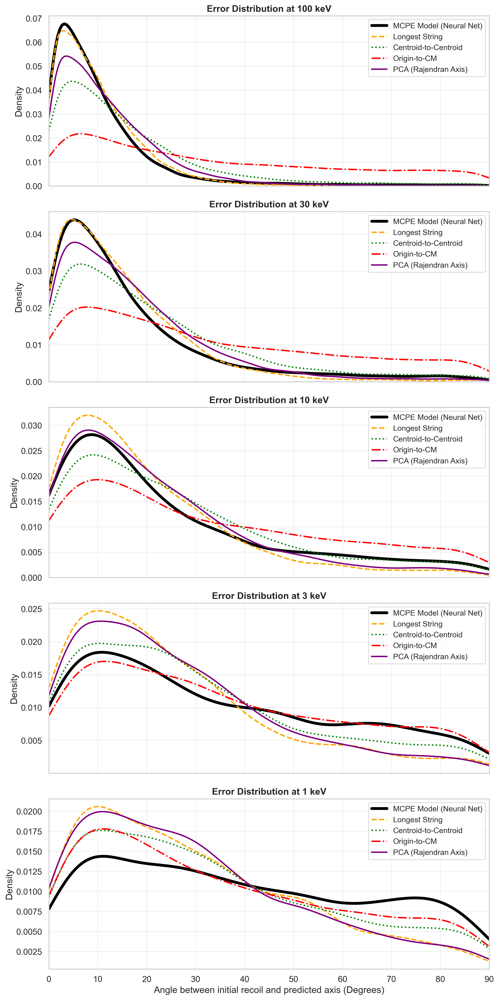

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
from sklearn.decomposition import PCA  # <-- ADDED PCA IMPORT
import os

# --- PATHS ---
RAW_EVAL_DATA = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_250k.csv"
MCPE_RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv"

def calculate_geometric_baselines(raw_df):
    """
    Implements your three custom geometric metrics plus PCA on CENTERED tracks 
    and calculates the undirected axis error (0-90 deg).
    """
    results = []
    id_col = 'ion_number' if 'ion_number' in raw_df.columns else 'ion #'
    grouped = raw_df.groupby(['energy_keV', id_col])
    
    print(f"[INFO] Centering tracks and calculating Geometric Baselines for {len(grouped)} tracks...")
    
    for (energy, ion_id), track in grouped:
        coords = track[['x', 'y']].values
        true_angle = track['theta_deg'].iloc[0]
        if len(coords) < 5: 
            continue

        # --- THE FAIRNESS FIX: CENTER THE TRACK ---
        # Subtract the mean so the center of mass is exactly at (0,0)
        coords_centered = coords - coords.mean(axis=0)
        # ------------------------------------------

        # METRIC 1: LONGEST DISTANCE (Max span)
        dist_matrix = squareform(pdist(coords_centered))
        i, j = np.unravel_index(dist_matrix.argmax(), dist_matrix.shape)
        v_max_dist = coords_centered[j] - coords_centered[i]
        
        # METRIC 2: CENTROID-TO-CENTROID (Thirds division)
        # Sort by Z (depth) to find the beginning vs end
        track_sorted = track.sort_values('z')
        coords_sorted = track_sorted[['x', 'y']].values
        coords_sorted_centered = coords_sorted - coords_sorted.mean(axis=0)
        
        n = len(coords_sorted_centered)
        first_third = coords_sorted_centered[:n//3].mean(axis=0)
        last_third = coords_sorted_centered[2*n//3:].mean(axis=0)
        v_centroid_thirds = last_third - first_third

        # METRIC 3: ORIGIN-TO-CENTROID
        # Since we centered the track, overall_centroid is now mathematically [0,0]
        overall_centroid = coords_centered.mean(axis=0)
        v_origin_centroid = overall_centroid - np.array([0, 0])

        # METRIC 4: PCA (Rajendran Damage Axis)
        # Finds the principal component (line of best fit) through the points
        pca = PCA(n_components=1)
        pca.fit(coords_centered)
        v_pca = pca.components_[0]

        angles = {
            'Longest String': np.degrees(np.arctan2(v_max_dist[1], v_max_dist[0])) % 360,
            'Centroid-to-Centroid': np.degrees(np.arctan2(v_centroid_thirds[1], v_centroid_thirds[0])) % 360,
            'Origin-to-CM': np.degrees(np.arctan2(v_origin_centroid[1], v_origin_centroid[0])) % 360,
            'PCA ': np.degrees(np.arctan2(v_pca[1], v_pca[0])) % 360  # <-- ADDED PCA ANGLE
        }

        # Calculate undirected axis error (0 to 90 degrees) for all methods
        for method, pred_angle in angles.items():
            # Fold the difference to find the closest axis alignment
            diff = np.abs(pred_angle - true_angle) % 180
            axis_error = np.minimum(diff, 180 - diff)
            
            results.append({
                'track_id': f"E{float(energy)}_ion{int(ion_id)}", 
                'true_energy': energy, 
                'method': method, 
                'axis_error': axis_error
            })

    return pd.DataFrame(results)

def main():
    print("[INIT] Starting Geometric Baseline Benchmarking...")
    
    if not (os.path.exists(RAW_EVAL_DATA) and os.path.exists(MCPE_RESULTS_PATH)):
        print("[ERROR] Check your file paths.")
        return
    
    # 1. Load data
    raw_df = pd.read_csv(RAW_EVAL_DATA)
    raw_df.columns = [c.strip() for c in raw_df.columns]
    mcpe_df = pd.read_csv(MCPE_RESULTS_PATH)
    
    # 2. Convert MCPE directed angular error (0-180) to undirected axis error (0-90)
    mcpe_df['mcpe_axis_error'] = np.minimum(mcpe_df['angular_error'], 180 - mcpe_df['angular_error'])
    
    # 3. Run geometric baselines
    baseline_df = calculate_geometric_baselines(raw_df)
    
    # 4. Plot setup
    sns.set_theme(style="whitegrid", context="notebook", font_scale=1.1)
    target_energies = [100, 30, 10, 3, 1]
    
    fig, axes = plt.subplots(len(target_energies), 1, figsize=(10, 20), sharex=True)
    
    # Added PCA to the plotting styles dictionary
    method_styles = {
        'Longest String': {'color': 'orange', 'ls': '--'},
        'Centroid-to-Centroid': {'color': 'green', 'ls': ':'},
        'Origin-to-CM': {'color': 'red', 'ls': '-.'},
        'PCA (Rajendran Axis)': {'color': 'purple', 'ls': '-'}
    }
    
    # 5. Iterative plotting
    for ax, energy in zip(axes, target_energies):
        tol = energy * 0.1 if energy >= 10 else 0.5
        
        # MCPE Neural Net Data
        mcpe_sub = mcpe_df[np.abs(mcpe_df['true_energy'] - energy) < tol]
        if len(mcpe_sub) > 0:
            sns.kdeplot(mcpe_sub['mcpe_axis_error'], label="MCPE Model (Neural Net)", 
                        lw=4, color='black', ax=ax, clip=(0, 90))
        
        # Baseline Data
        base_sub = baseline_df[np.abs(baseline_df['true_energy'] - energy) < tol]
        for m_key, style in method_styles.items():
            m_data = base_sub[base_sub['method'] == m_key]
            if len(m_data) > 0:
                sns.kdeplot(m_data['axis_error'], label=m_key, color=style['color'], 
                            ls=style['ls'], lw=2, ax=ax, clip=(0, 90))
        
        ax.set_title(f"Error Distribution at {energy} keV", fontweight='bold')
        ax.set_ylabel("Density")
        ax.set_xlim(0, 90)
        ax.grid(alpha=0.3)
        ax.legend(loc='upper right', fontsize='small')

    plt.xlabel("Angle between initial recoil and predicted axis (Degrees)")
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

Loading Results and Features...


/var/folders/wv/wqt6hj5j10x18q4_x16rqnvc0000gn/T/ipykernel_12740/3306734018.py:43: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  binned = df.groupby('energy_bin')['angular_error'].median().reset_index()


Saved Hump Analysis Plot.
Plotting feature 'energy' as shape proxy...
Saved Shape Analysis Plot.


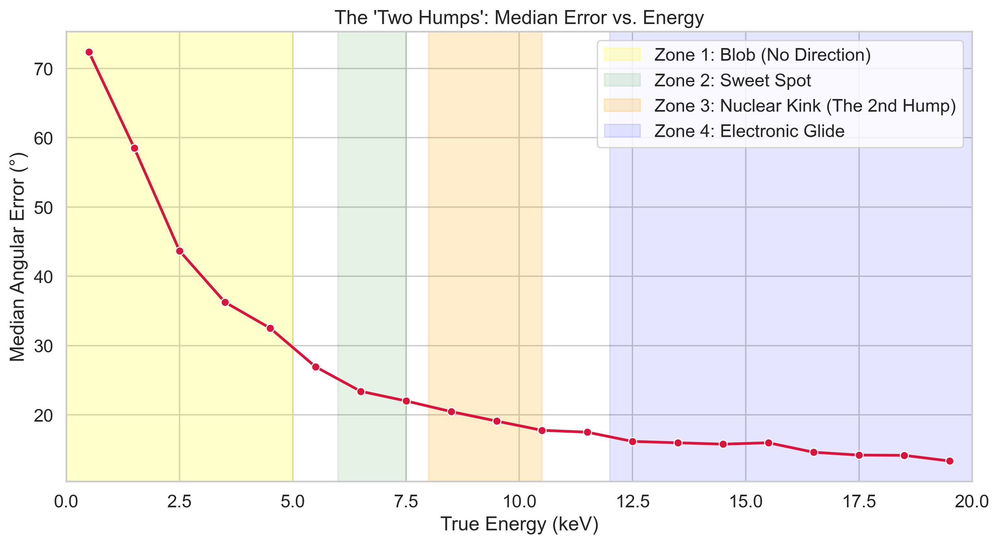

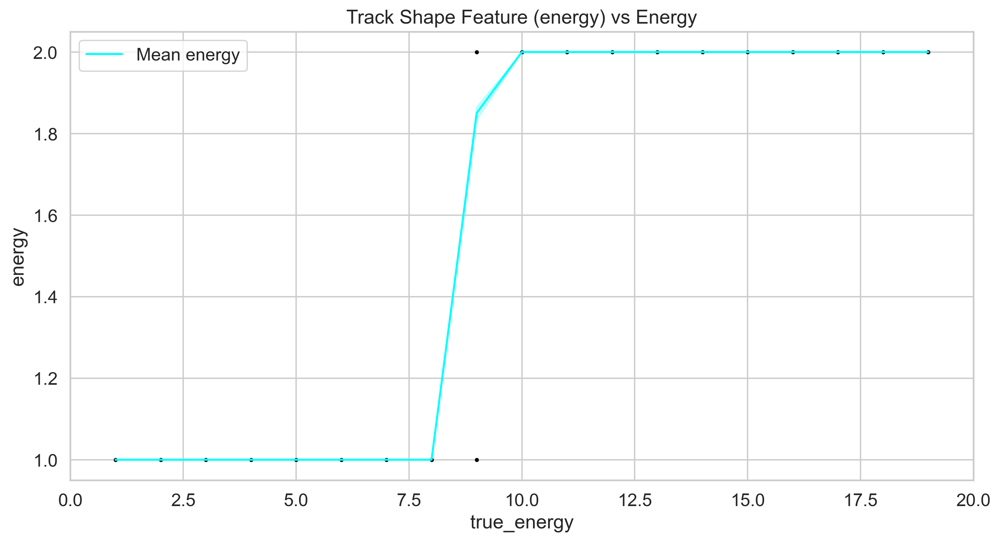

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# CONFIGURATION
RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv"
# We need the FEATURES file to check the track shapes
# Replace this with the path to your EVAL INPUT CSV (the one with the 28 features)
FEATURES_CSV = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_EVAL_CONTINUOUS_FIXED_250k.csv"

OUTPUT_DIR = Path("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/analysis")

sns.set_theme(style="whitegrid", font_scale=1.2)

def main():
    print("Loading Results and Features...")
    df_res = pd.read_csv(RESULTS_PATH)
    
    # Load features to get geometric info (Eigenvalues/Variance)
    # Assuming the CSV has headers. If not, we might need to adjust.
    try:
        df_feat = pd.read_csv(FEATURES_CSV)
    except:
        print("Could not load features file. Make sure path is correct.")
        return

    # MERGE: We assume the rows align perfectly (they should if generated sequentially)
    # We will just concatenate them horizontally for analysis
    df = pd.concat([df_res, df_feat], axis=1)

    # ---------------------------------------------------------
    # ANALYSIS 1: The "Hump" Visualization (1D Line Plot)
    # ---------------------------------------------------------
    plt.figure(figsize=(12, 6))
    
    # Calculate Mean Error in 0.5 keV bins
    bins = np.linspace(0, 20, 41)
    df['energy_bin'] = pd.cut(df['true_energy'], bins, labels=bins[:-1])
    
    # Group by bin
    binned = df.groupby('energy_bin')['angular_error'].median().reset_index()
    binned['energy_bin'] = binned['energy_bin'].astype(float)
    
    sns.lineplot(data=binned, x='energy_bin', y='angular_error', marker='o', color='crimson', lw=2)
    
    # Highlight the zones
    plt.axvspan(0, 5, color='yellow', alpha=0.2, label='Zone 1: Blob (No Direction)')
    plt.axvspan(6, 7.5, color='green', alpha=0.1, label='Zone 2: Sweet Spot')
    plt.axvspan(8, 10.5, color='orange', alpha=0.2, label='Zone 3: Nuclear Kink (The 2nd Hump)')
    plt.axvspan(12, 20, color='blue', alpha=0.1, label='Zone 4: Electronic Glide')
    
    plt.title("The 'Two Humps': Median Error vs. Energy")
    plt.xlabel("True Energy (keV)")
    plt.ylabel("Median Angular Error (°)")
    plt.legend()
    plt.xlim(0, 20)
    
    plt.savefig(OUTPUT_DIR / "analysis_the_two_humps.png", dpi=300)
    print("Saved Hump Analysis Plot.")

    # ---------------------------------------------------------
    # ANALYSIS 2: Geometric Proxy (Do tracks get rounder at 9keV?)
    # ---------------------------------------------------------
    # We need to find columns that represent track shape.
    # Usually features [0] is Energy. 
    # Features [1,2,3] might be center of mass.
    # Features [4,5,6] (or similar) are usually eigenvalues or variance.
    
    # Let's verify by plotting the Standard Deviation of features vs Energy
    # If we don't know the exact column, we plot Feature 4 (often a shape param)
    
    plt.figure(figsize=(12, 6))
    
    # Try to find a shape feature (e.g., 'eval_0' or column index 4)
    # Adjust this column name based on your actual CSV headers!
    target_col = df_feat.columns[4] # Guessing column 4 is a shape parameter
    print(f"Plotting feature '{target_col}' as shape proxy...")
    
    sns.scatterplot(
        data=df[df['true_energy'] < 20], 
        x='true_energy', 
        y=target_col, 
        alpha=0.1, 
        s=10, 
        color='black'
    )
    
    # Overlay the average shape trend
    sns.lineplot(
        data=df[df['true_energy'] < 20], 
        x='true_energy', 
        y=target_col, 
        color='cyan', 
        label=f'Mean {target_col}'
    )
    
    plt.title(f"Track Shape Feature ({target_col}) vs Energy")
    plt.xlim(0, 20)
    
    plt.savefig(OUTPUT_DIR / "analysis_shape_vs_energy.png", dpi=300)
    print("Saved Shape Analysis Plot.")
    
    plt.show()

if __name__ == "__main__":
    main()

Loading /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv...
Saved Global Plot.


/var/folders/wv/wqt6hj5j10x18q4_x16rqnvc0000gn/T/ipykernel_1329/1117338280.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  profile = df.groupby('angle_bin')['angular_error'].median().reset_index()


Saved Hemisphere Plot.
Saved Quadrant Plot.


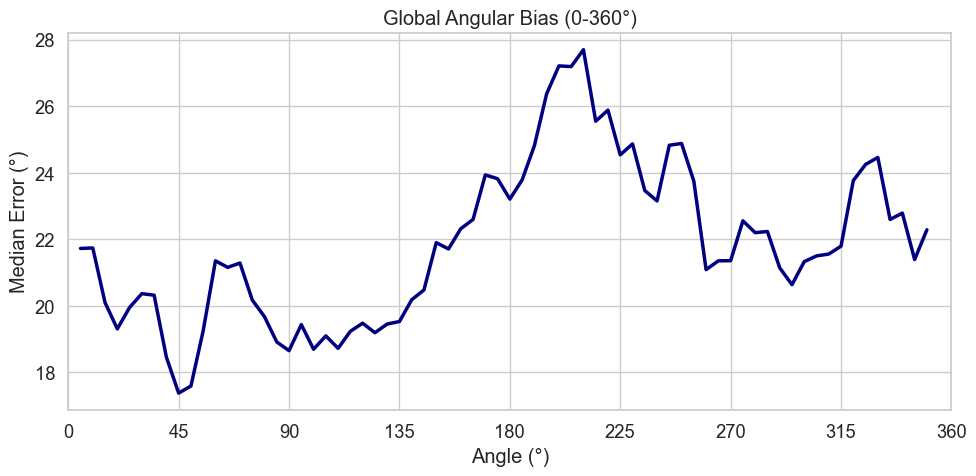

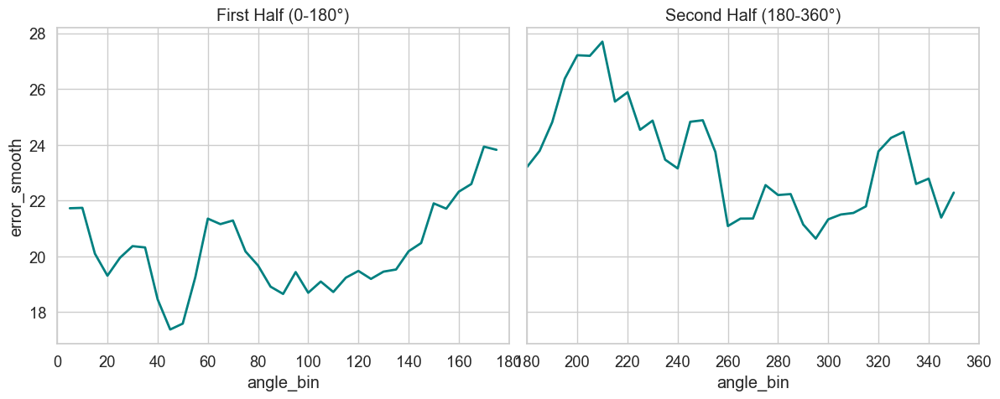

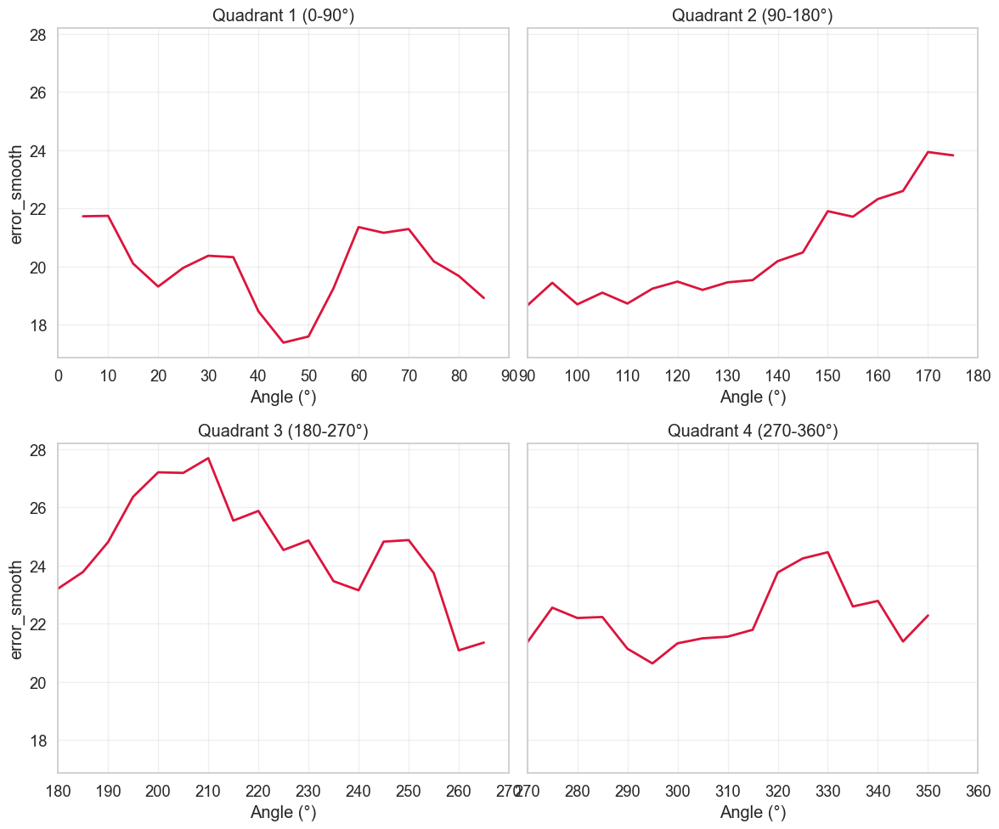

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# CONFIGURATION
RESULTS_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv"
OUTPUT_DIR = Path("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/analysis_250k")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

sns.set_theme(style="whitegrid", font_scale=1.2)

def main():
    print(f"Loading {RESULTS_PATH}...")
    df = pd.read_csv(RESULTS_PATH)
    
    # Filter for the sensitive zone where angular bias matters
    df = df[(df['true_energy'] >= 3) & (df['true_energy'] <= 15)].copy()
    
    # Bin Data (5 degree resolution)
    bins = np.arange(0, 361, 5)
    df['angle_bin'] = pd.cut(df['true_angle'], bins, labels=bins[:-1])
    
    # Calculate Median Error
    profile = df.groupby('angle_bin')['angular_error'].median().reset_index()
    profile['angle_bin'] = profile['angle_bin'].astype(float)
    
    # Smooth slightly for readability
    profile['error_smooth'] = profile['angular_error'].rolling(window=3, center=True).mean()

    # ---------------------------------------------------------
    # PLOT 1: Global View (0-360)
    # ---------------------------------------------------------
    plt.figure(figsize=(10, 5))
    sns.lineplot(data=profile, x='angle_bin', y='error_smooth', color='navy', lw=2.5)
    plt.title("Global Angular Bias (0-360°)")
    plt.xlabel("Angle (°)")
    plt.ylabel("Median Error (°)")
    plt.xlim(0, 360)
    plt.xticks(np.arange(0, 361, 45)) # Ticks every 45 degrees
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "simple_1_global.png", dpi=150)
    print("Saved Global Plot.")

    # ---------------------------------------------------------
    # PLOT 2: Hemispheres (0-180 vs 180-360)
    # ---------------------------------------------------------
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
    
    # Left Hemisphere
    sns.lineplot(data=profile[profile['angle_bin'] < 180], x='angle_bin', y='error_smooth', ax=axes[0], color='teal', lw=2)
    axes[0].set_title("First Half (0-180°)")
    axes[0].set_xlim(0, 180)
    
    # Right Hemisphere
    sns.lineplot(data=profile[profile['angle_bin'] >= 180], x='angle_bin', y='error_smooth', ax=axes[1], color='teal', lw=2)
    axes[1].set_title("Second Half (180-360°)")
    axes[1].set_xlim(180, 360)
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "simple_2_halves.png", dpi=150)
    print("Saved Hemisphere Plot.")

    # ---------------------------------------------------------
    # PLOT 3: Quadrants (90 degree sectors)
    # ---------------------------------------------------------
    fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharey=True)
    quadrants = [
        (0, 90, axes[0,0], "Quadrant 1 (0-90°)"),
        (90, 180, axes[0,1], "Quadrant 2 (90-180°)"),
        (180, 270, axes[1,0], "Quadrant 3 (180-270°)"),
        (270, 360, axes[1,1], "Quadrant 4 (270-360°)")
    ]
    
    for start, end, ax, title in quadrants:
        subset = profile[(profile['angle_bin'] >= start) & (profile['angle_bin'] < end)]
        sns.lineplot(data=subset, x='angle_bin', y='error_smooth', ax=ax, color='crimson', lw=2)
        ax.set_title(title)
        ax.set_xlim(start, end)
        ax.set_xlabel("Angle (°)")
        ax.grid(True, alpha=0.3)
        
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "simple_3_quadrants.png", dpi=150)
    print("Saved Quadrant Plot.")
    plt.show()

if __name__ == "__main__":
    main()

Loading Training Data: /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_TRAIN_CONTINUOUS_FIXED_250k.csv...

      FILE COLUMNS FOUND
['x', 'y', 'z', 'ion #', 'energy', 'energy_keV', 'theta_deg', 'cos_theta', 'sin_theta']

[INFO] Auto-Detected Columns:
   -> Angle : 'theta_deg'
   -> Energy: 'energy'
   -> ID    : 'ion #'

Grouping by track ID to count unique samples...
Audit Size: 202000 unique training tracks.
Saved 1D Balance Plot to /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/training_data_audit/audit_1_angle_balance.png
Saved 2D Density Plot to /Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/training_data_audit/audit_2_density_heatmap.png

      TRAINING DATA BALANCE REPORT
Quadrant 1 (000-090°): 50354 tracks
Quadrant 2 (090-180°): 50502 tracks
Quadrant 3 (180-270°): 51023 tracks
Quadrant 4 (270-360°): 50121 tracks

[PASS] Data is balanced (Deviation: 1.8%).
The training data is uniform.


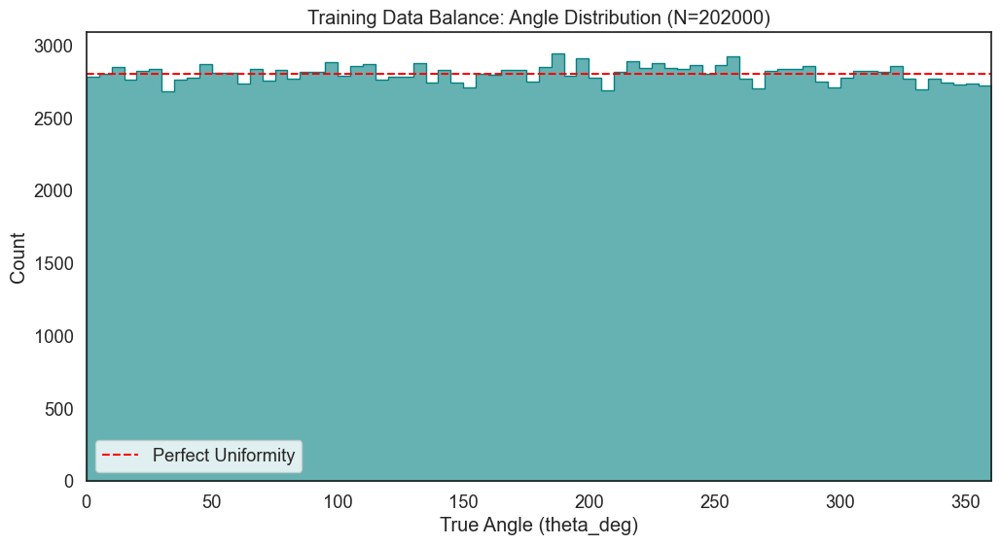

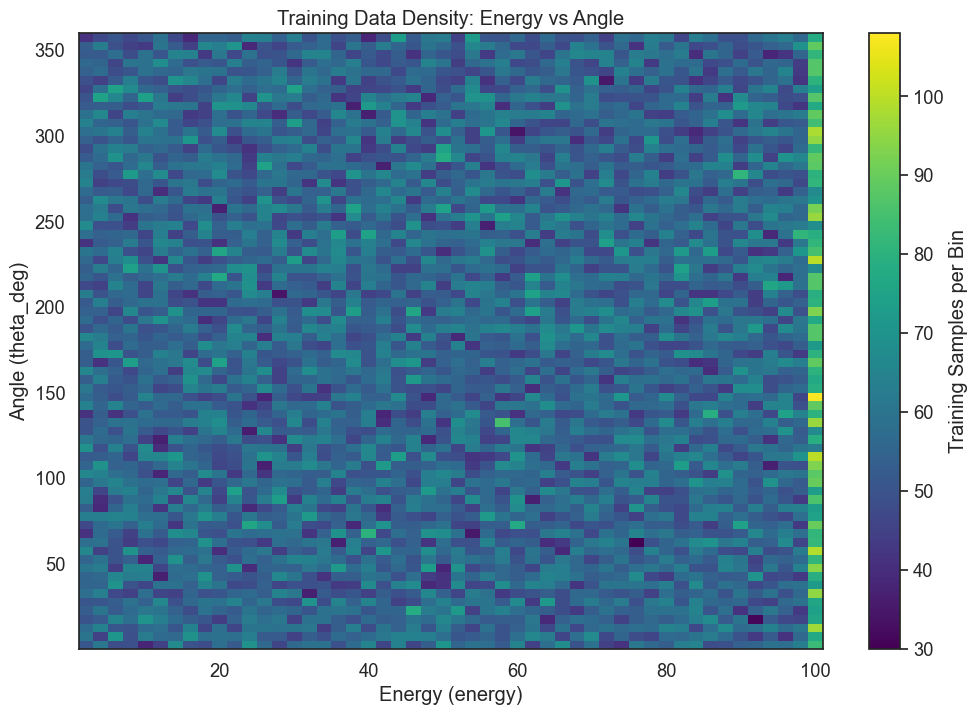

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# ==========================================
# CONFIGURATION
# ==========================================
DATA_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/data/MCPE_TRAIN_CONTINUOUS_FIXED_250k.csv"
OUTPUT_DIR = Path("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/training_data_audit")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

sns.set_theme(style="white", font_scale=1.2)

def find_column(df, candidates):
    """
    Helper to find the first matching column from a list of candidates.
    Case-insensitive partial matching.
    """
    # 1. Exact match check
    for col in df.columns:
        if col in candidates:
            return col
            
    # 2. Case-insensitive match
    lower_cols = [c.lower() for c in df.columns]
    for cand in candidates:
        if cand.lower() in lower_cols:
            return df.columns[lower_cols.index(cand.lower())]
            
    # 3. Partial match (e.g. "theta" in "theta_deg")
    for col in df.columns:
        for cand in candidates:
            if cand.lower() in col.lower():
                return col
    return None

def main():
    print(f"Loading Training Data: {DATA_PATH}...")
    try:
        df = pd.read_csv(DATA_PATH)
    except Exception as e:
        print(f"[CRITICAL] Error loading file: {e}")
        return

    # 1. Clean Column Names (Strip whitespace)
    df.columns = [str(c).strip() for c in df.columns]
    
    print("\n" + "="*40)
    print("      FILE COLUMNS FOUND")
    print("="*40)
    print(df.columns.tolist())
    print("="*40 + "\n")

    # 2. Auto-Detect Columns
    # We look for common SRIM/Physics variations
    angle_col = find_column(df, ["theta_deg", "theta", "angle", "deg", "y_angle"])
    energy_col = find_column(df, ["energy_keV", "energy", "E_keV", "keV"])
    ion_col = find_column(df, ["ion_number", "ion #", "ion", "track_id", "history"])

    print(f"[INFO] Auto-Detected Columns:")
    print(f"   -> Angle : '{angle_col}'")
    print(f"   -> Energy: '{energy_col}'")
    print(f"   -> ID    : '{ion_col}'")

    if not angle_col or not energy_col:
        print(f"\n[CRITICAL ERROR] Could not automatically identify Angle or Energy columns.")
        print("Please check the column list printed above and update the script manually.")
        return

    # 3. Reduce to Unique Tracks
    print("\nGrouping by track ID to count unique samples...")
    # Grouping by Energy + Ion ensures we get unique tracks even if Ion IDs repeat across energies
    if ion_col:
        unique_tracks = df.groupby([energy_col, ion_col]).first().reset_index()
    else:
        print("[WARNING] No Ion ID column found. Assuming every row is a unique track (dangerous for raw data!)")
        unique_tracks = df

    print(f"Audit Size: {len(unique_tracks)} unique training tracks.")

    # ------------------------------------------------
    # PLOT 1: 1D Angle Balance
    # ------------------------------------------------
    plt.figure(figsize=(12, 6))
    sns.histplot(
        data=unique_tracks, 
        x=angle_col, 
        bins=72, 
        color='teal', 
        element='step', 
        fill=True,
        alpha=0.6
    )
    
    plt.title(f"Training Data Balance: Angle Distribution (N={len(unique_tracks)})")
    plt.xlabel(f"True Angle ({angle_col})")
    plt.xlim(0, 360)
    plt.ylabel("Count")
    
    expected_count = len(unique_tracks) / 72
    plt.axhline(expected_count, color='red', linestyle='--', label='Perfect Uniformity')
    plt.legend()
    
    save_path_1 = OUTPUT_DIR / "audit_1_angle_balance.png"
    plt.savefig(save_path_1, dpi=150)
    print(f"Saved 1D Balance Plot to {save_path_1}")

    # ------------------------------------------------
    # PLOT 2: 2D Energy-Angle Heatmap
    # ------------------------------------------------
    plt.figure(figsize=(12, 8))
    plt.hist2d(
        unique_tracks[energy_col], 
        unique_tracks[angle_col], 
        bins=[50, 72], 
        cmap='viridis',
        cmin=1 
    )
    
    cb = plt.colorbar()
    cb.set_label('Training Samples per Bin')
    plt.title("Training Data Density: Energy vs Angle")
    plt.xlabel(f"Energy ({energy_col})")
    plt.ylabel(f"Angle ({angle_col})")
    
    save_path_2 = OUTPUT_DIR / "audit_2_density_heatmap.png"
    plt.savefig(save_path_2, dpi=150)
    print(f"Saved 2D Density Plot to {save_path_2}")

    # ------------------------------------------------
    # STATS REPORT
    # ------------------------------------------------
    angles = unique_tracks[angle_col]
    q1 = len(angles[(angles >= 0) & (angles < 90)])
    q2 = len(angles[(angles >= 90) & (angles < 180)])
    q3 = len(angles[(angles >= 180) & (angles < 270)])
    q4 = len(angles[(angles >= 270) & (angles < 360)])
    
    print("\n" + "="*40)
    print("      TRAINING DATA BALANCE REPORT")
    print("="*40)
    print(f"Quadrant 1 (000-090°): {q1} tracks")
    print(f"Quadrant 2 (090-180°): {q2} tracks")
    print(f"Quadrant 3 (180-270°): {q3} tracks")
    print(f"Quadrant 4 (270-360°): {q4} tracks")
    
    counts = [q1, q2, q3, q4]
    avg = np.mean(counts)
    if avg > 0:
        imbalance = (max(counts) - min(counts)) / avg
    else:
        imbalance = 0

    if imbalance > 0.1: 
        print(f"\n[WARNING] Imbalance Detected: {imbalance*100:.1f}% deviation!")
        print(f"The Training Data ITSELF is biased.")
    else:
        print(f"\n[PASS] Data is balanced (Deviation: {imbalance*100:.1f}%).")
        print("The training data is uniform.")
        
    plt.show()

if __name__ == "__main__":
    main()


Directional Metrics
Median Angular Error: 8.096143885800435
68% Containment: 12.497313730730792
90% Containment: 62.69214492828746
% within 10°: 59.48
% within 20°: 80.05

Axial (Head-Tail Ignored)
Median Axial Error: 8.08027482082613


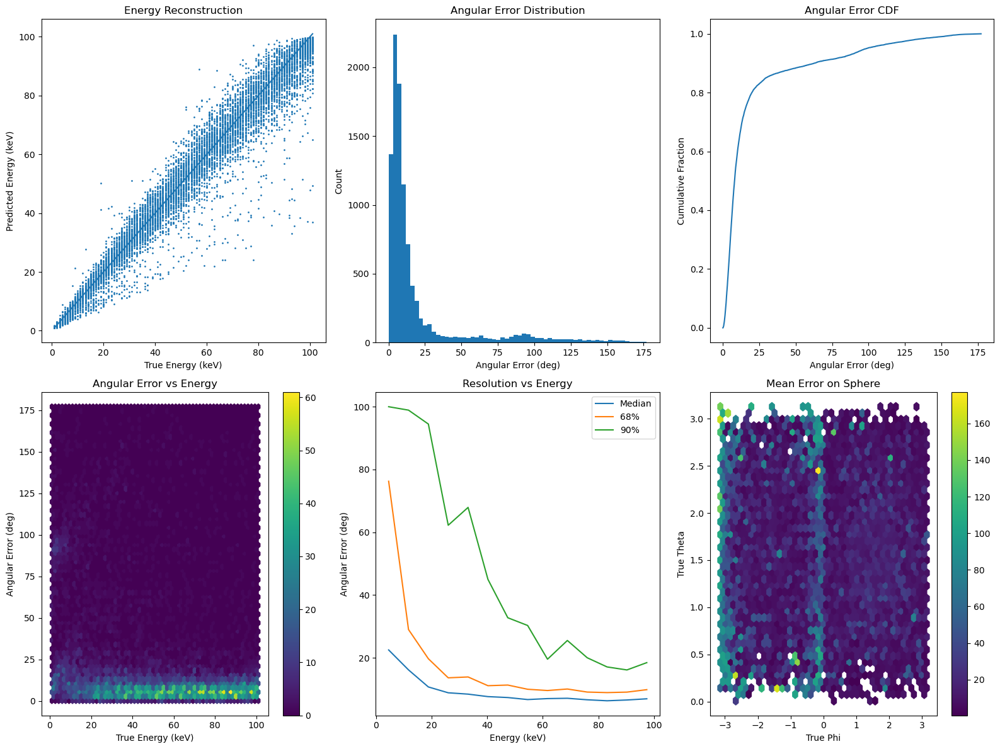


Analysis complete.


In [10]:
# ================================================================
# MCPE 3D Evaluation — Complete Analysis Script
# ================================================================
# Just change csv_path and run the cell.
# ================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==============================
# 1. LOAD DATA
# ==============================

csv_path = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/pipeline_b/pointnet_3d_eval_results.csv"
df = pd.read_csv(csv_path)

# ==============================
# 2. COMPUTE ANGULAR METRICS
# ==============================

true_vec = df[["true_vx","true_vy","true_vz"]].values
pred_vec = df[["pred_vx","pred_vy","pred_vz"]].values

# Normalize (safety)
true_vec = true_vec / np.linalg.norm(true_vec, axis=1, keepdims=True)
pred_vec = pred_vec / np.linalg.norm(pred_vec, axis=1, keepdims=True)

cos_theta = np.sum(true_vec * pred_vec, axis=1)
cos_theta = np.clip(cos_theta, -1, 1)

theta_deg = np.degrees(np.arccos(cos_theta))
theta_axial = np.degrees(np.arccos(np.abs(cos_theta)))

df["theta_deg"] = theta_deg
df["theta_axial"] = theta_axial

# ==============================
# 3. PRINT SUMMARY METRICS
# ==============================

print("\n=============================")
print("Directional Metrics")
print("=============================")
print("Median Angular Error:", np.median(theta_deg))
print("68% Containment:", np.percentile(theta_deg, 68))
print("90% Containment:", np.percentile(theta_deg, 90))
print("% within 10°:", np.mean(theta_deg < 10)*100)
print("% within 20°:", np.mean(theta_deg < 20)*100)

print("\n=============================")
print("Axial (Head-Tail Ignored)")
print("=============================")
print("Median Axial Error:", np.median(theta_axial))

# ==============================
# 4. PLOTTING
# ==============================

plt.figure(figsize=(16,12))

# ---- (1) Energy Reconstruction ----
plt.subplot(2,3,1)
plt.scatter(df.true_energy, df.pred_energy, s=1)
plt.plot([df.true_energy.min(), df.true_energy.max()],
         [df.true_energy.min(), df.true_energy.max()])
plt.xlabel("True Energy (keV)")
plt.ylabel("Predicted Energy (keV)")
plt.title("Energy Reconstruction")

# ---- (2) Angular Error Histogram ----
plt.subplot(2,3,2)
plt.hist(theta_deg, bins=60)
plt.xlabel("Angular Error (deg)")
plt.ylabel("Count")
plt.title("Angular Error Distribution")

# ---- (3) Angular Error CDF ----
plt.subplot(2,3,3)
sorted_theta = np.sort(theta_deg)
cdf = np.arange(len(sorted_theta)) / len(sorted_theta)
plt.plot(sorted_theta, cdf)
plt.xlabel("Angular Error (deg)")
plt.ylabel("Cumulative Fraction")
plt.title("Angular Error CDF")

# ---- (4) Angular Error vs Energy ----
plt.subplot(2,3,4)
hb = plt.hexbin(df.true_energy, theta_deg, gridsize=60)
plt.xlabel("True Energy (keV)")
plt.ylabel("Angular Error (deg)")
plt.title("Angular Error vs Energy")
plt.colorbar(hb)

# ---- (5) Angular Resolution vs Energy (Quantiles) ----
plt.subplot(2,3,5)
bins = np.linspace(df.true_energy.min(), df.true_energy.max(), 15)
df["energy_bin"] = np.digitize(df.true_energy, bins)

med = []
p68 = []
p90 = []
bin_centers = []

for b in range(1, len(bins)):
    subset = df[df.energy_bin == b]
    if len(subset) > 0:
        med.append(np.median(subset.theta_deg))
        p68.append(np.percentile(subset.theta_deg, 68))
        p90.append(np.percentile(subset.theta_deg, 90))
        bin_centers.append((bins[b-1] + bins[b]) / 2)

plt.plot(bin_centers, med, label="Median")
plt.plot(bin_centers, p68, label="68%")
plt.plot(bin_centers, p90, label="90%")
plt.xlabel("Energy (keV)")
plt.ylabel("Angular Error (deg)")
plt.title("Resolution vs Energy")
plt.legend()

# ---- (6) Spherical Error Map ----
plt.subplot(2,3,6)
true_theta = np.arccos(true_vec[:,2])
true_phi = np.arctan2(true_vec[:,1], true_vec[:,0])

hb2 = plt.hexbin(true_phi, true_theta, C=theta_deg,
                 reduce_C_function=np.mean, gridsize=40)
plt.xlabel("True Phi")
plt.ylabel("True Theta")
plt.title("Mean Error on Sphere")
plt.colorbar(hb2)

plt.tight_layout()
plt.show()

print("\nAnalysis complete.")

Plot saved successfully to efficiency_comparison_plot.png


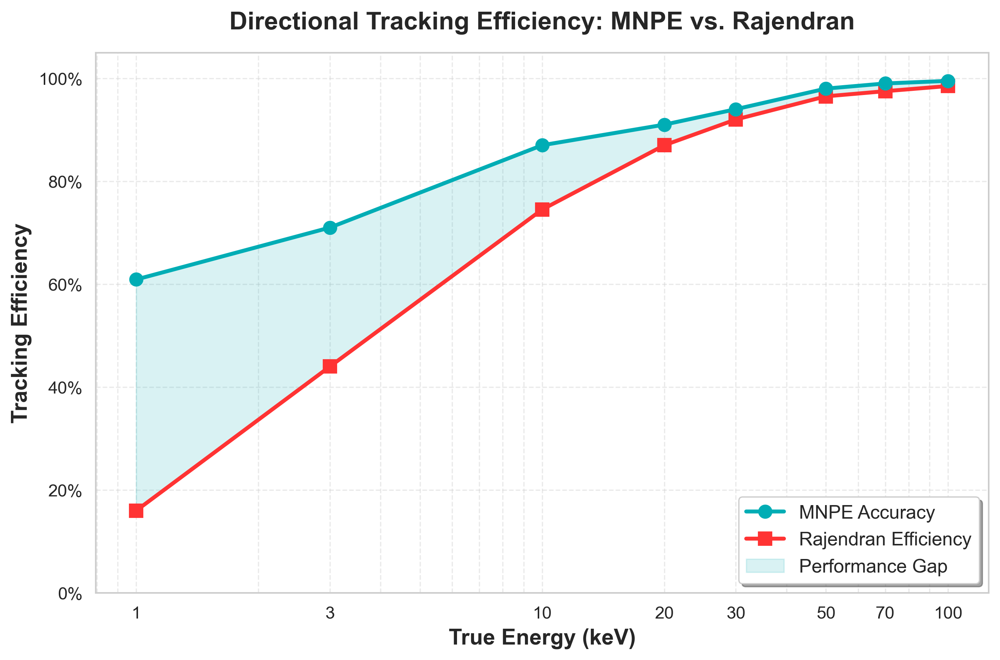

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. THE EXTRACTED DATA
data = {
    "energy_keV": [1, 3, 10, 20, 30, 50, 70, 100],
    "mnpe_accuracy": [0.609137, 0.710000, 0.870000, 0.910000, 0.940000, 0.980000, 0.990000, 0.995000],
    "raj_efficiency": [0.160, 0.440, 0.745, 0.870, 0.920, 0.965, 0.975, 0.985],
    "threshold_T": [3.667, 2.500, 1.375, 1.172, 1.188, 1.009, 1.074, 1.005],
    "difference": [0.449137, 0.270000, 0.125000, 0.040000, 0.020000, 0.015000, 0.015000, 0.010000]
}

df = pd.DataFrame(data)

# 2. AESTHETIC SETUP
# Use seaborn to get a clean, modern grid
sns.set_theme(style="whitegrid", context="paper")
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'legend.fontsize': 12,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'figure.dpi': 300  # High res for publications
})

# 3. CREATE THE PLOT
fig, ax = plt.subplots(figsize=(9, 6))

# Define colors (Modern, colorblind-friendly palette)
color_mnpe = "#00adb5"  # Neon cyan/teal
color_raj = "#ff3333"   # Vibrant red

# Plot the lines with markers
ax.plot(df['energy_keV'], df['mnpe_accuracy'], 
        marker='o', markersize=8, linewidth=2.5, 
        color=color_mnpe, label='MNPE Accuracy', zorder=4)

ax.plot(df['energy_keV'], df['raj_efficiency'], 
        marker='s', markersize=8, linewidth=2.5, 
        color=color_raj, label='Rajendran Efficiency', zorder=3)

# Fill the gap between them to represent the "Difference" column
ax.fill_between(df['energy_keV'], df['raj_efficiency'], df['mnpe_accuracy'], 
                color=color_mnpe, alpha=0.15, label='Performance Gap', zorder=2)

# 4. FORMATTING & LABELS
ax.set_title('Directional Tracking Efficiency: MNPE vs. Rajendran', fontweight='bold', pad=15)
ax.set_xlabel('True Energy (keV)', fontweight='bold')
ax.set_ylabel('Tracking Efficiency', fontweight='bold')

# Set y-axis to percentage formatting (e.g., 0.8 -> 80%)
ax.set_ylim(0.0, 1.05)
ax.set_yticks(np.arange(0, 1.1, 0.2))
ax.set_yticklabels([f"{int(y*100)}%" for y in ax.get_yticks()])

# Logarithmic X-axis to spread out the low-energy points evenly
ax.set_xscale('log')
ax.set_xticks([1, 3, 10, 20, 30, 50, 70, 100])
ax.get_xaxis().set_major_formatter(plt.ScalarFormatter()) # Turns off scientific notation

# Legend styling
legend = ax.legend(loc='lower right', frameon=True, fancybox=True, shadow=True)
legend.get_frame().set_facecolor('white')

# Add subtle gridlines
ax.grid(True, which="both", ls="--", alpha=0.4, zorder=1)

# Clean up layout and save
plt.tight_layout()
output_path = "efficiency_comparison_plot.png"
plt.savefig(output_path, bbox_inches='tight')
print(f"Plot saved successfully to {output_path}")

plt.show()

In [22]:
df = pd.read_csv("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/apples_to_apples/mnpe_raw_eval_results.csv")
for e in [3, 10, 20, 30, 50, 70, 100]:
    subset = df[(df['true_energy'] >= e-0.5) & (df['true_energy'] < e+0.5)]
    print(f"{e} keV: acc={subset['is_correct'].mean():.3f}, n={len(subset)}, mean_conf={subset['confidence'].mean():.3f}")


print(df['true_energy'].describe())
print(df['true_energy'].unique()[:20])
print(len(df))

3 keV: acc=0.462, n=624, mean_conf=0.549
10 keV: acc=0.524, n=624, mean_conf=0.543
20 keV: acc=0.521, n=624, mean_conf=0.542
30 keV: acc=0.482, n=624, mean_conf=0.544
50 keV: acc=0.511, n=624, mean_conf=0.544
70 keV: acc=0.529, n=624, mean_conf=0.545
100 keV: acc=0.580, n=624, mean_conf=0.548
count    4963.000000
mean       35.701592
std        33.024221
min         1.000000
25%        10.000000
50%        30.000000
75%        70.000000
max       100.000000
Name: true_energy, dtype: float64
[  1.   3.  10.  20.  30.  50.  70. 100.]
4963


In [31]:
df = pd.read_csv("/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/apples_to_apples/mnpe_raw_eval_results5.csv")

print(df['true_energy'].describe())
print(df['true_energy'].unique()[:20])
print(f"Total tracks: {len(df)}")
for e in [1, 3, 10, 20, 30, 50, 70, 100]:
    subset = df[(df['true_energy'] >= e-0.5) & (df['true_energy'] < e+0.5)]
    if len(subset) == 0:
        print(f"{e} keV: NO DATA")
        continue
    print(f"{e} keV: acc={subset['is_correct'].mean():.3f}, n={len(subset)}, mean_conf={subset['confidence'].mean():.3f}")


count    4963.000000
mean       35.701592
std        33.024221
min         1.000000
25%        10.000000
50%        30.000000
75%        70.000000
max       100.000000
Name: true_energy, dtype: float64
[  1.   3.  10.  20.  30.  50.  70. 100.]
Total tracks: 4963
1 keV: acc=0.501, n=595, mean_conf=0.529
3 keV: acc=0.490, n=624, mean_conf=0.526
10 keV: acc=0.508, n=624, mean_conf=0.523
20 keV: acc=0.484, n=624, mean_conf=0.521
30 keV: acc=0.468, n=624, mean_conf=0.522
50 keV: acc=0.482, n=624, mean_conf=0.524
70 keV: acc=0.498, n=624, mean_conf=0.527
100 keV: acc=0.540, n=624, mean_conf=0.528


Data loaded successfully! Generating plots...


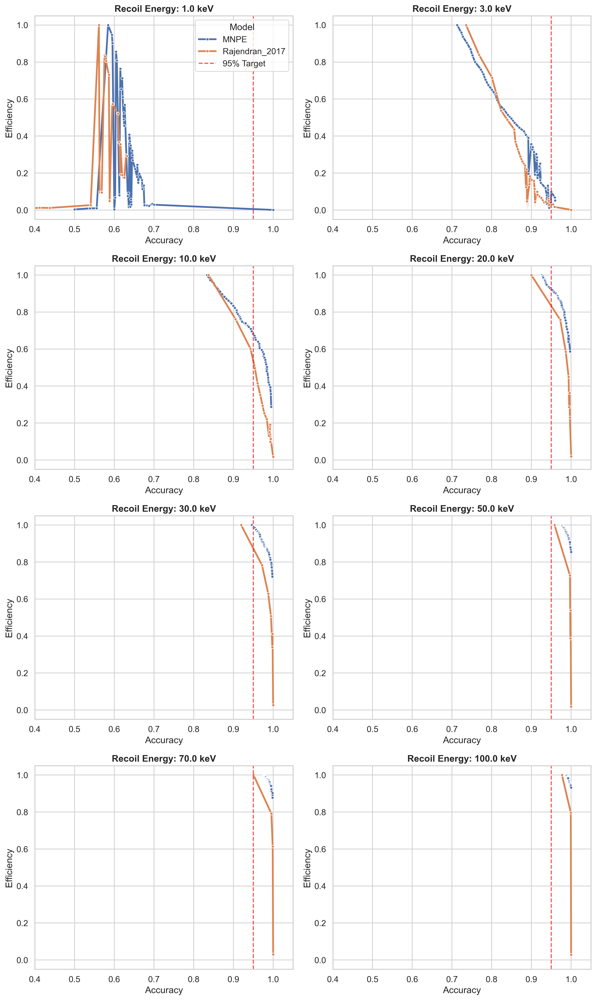

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Define the path (Assuming your notebook is in the main project folder)
CSV_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/apples_to_apples/efficiency_vs_accuracy_curves7.csv" 

# 2. Load the data
try:
    df = pd.read_csv(CSV_PATH)
    print("Data loaded successfully! Generating plots...")
except FileNotFoundError:
    print(f"Error: Could not find {CSV_PATH}. Check your relative path!")
    raise

# 3. Set up the visual style for Jupyter
sns.set_theme(style="whitegrid", context="notebook", font_scale=1.1)

# 4. Get unique energies to create subplots
energies = sorted(df['energy_keV'].unique())
num_energies = len(energies)

# Determine grid size (2 columns wide)
cols = 2
rows = (num_energies + 1) // 2 

fig, axes = plt.subplots(rows, cols, figsize=(12, 5 * rows), sharex=False, sharey=False)

# Flatten axes array for easy iteration
if num_energies == 1:
    axes = [axes]
else:
    axes = axes.flatten()

# 5. Loop through and plot each energy
for idx, energy in enumerate(energies):
    ax = axes[idx]
    subset = df[df['energy_keV'] == energy]
    
    # Plot Accuracy on X, Efficiency on Y
    sns.lineplot(
        data=subset,
        x='accuracy',
        y='efficiency',
        hue='model',
        linewidth=2.5,
        marker='o',       
        markersize=4,
        ax=ax
    )

    # Add the 95% Target Line
    ax.axvline(x=0.95, color='red', linestyle='--', alpha=0.7, label='95% Target')

    # Formatting
    ax.set_title(f"Recoil Energy: {energy} keV", fontweight='bold')
    ax.set_xlabel("Accuracy")
    ax.set_ylabel("Efficiency")
    
    # Lock bounds for easy comparison across graphs
    ax.set_xlim(0.4, 1.05) 
    ax.set_ylim(-0.05, 1.05) 
    
    # Clean up the legend (only show on the first plot)
    if idx == 0:
        ax.legend(title="Model", loc="best")
    else:
        if ax.get_legend() is not None:
            ax.get_legend().remove()

# Hide any empty subplots at the bottom if we have an odd number of energies
for i in range(num_energies, len(axes)):
    fig.delaxes(axes[i])

# Render the plot inline!
plt.tight_layout()
plt.show()

Loaded 22468 data points across 8 energies: [1.0, 3.0, 10.0, 20.0, 30.0, 50.0, 70.0, 100.0]


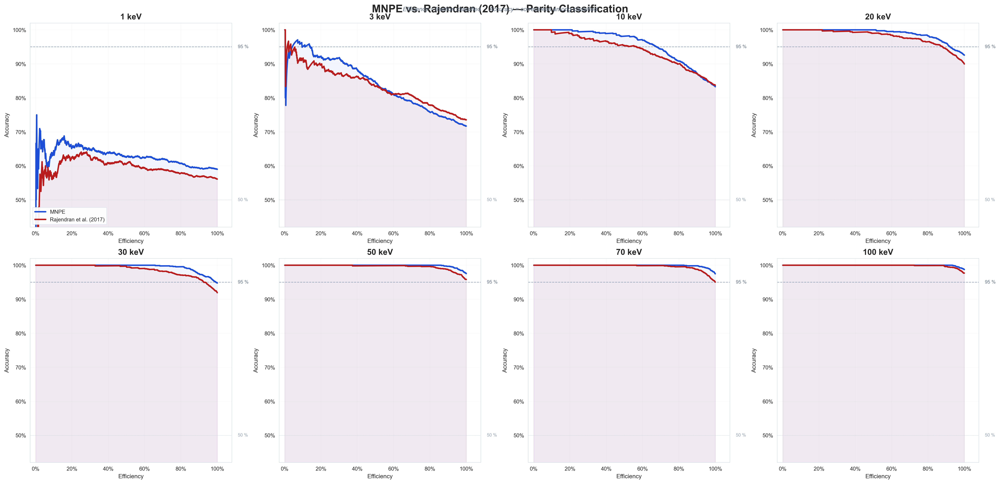

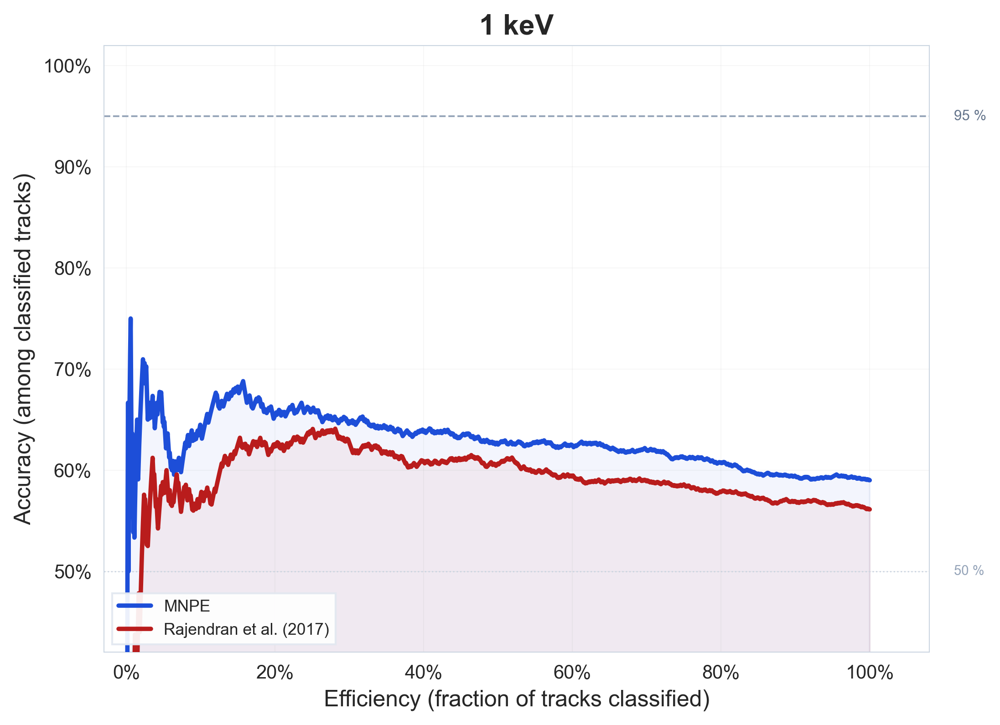

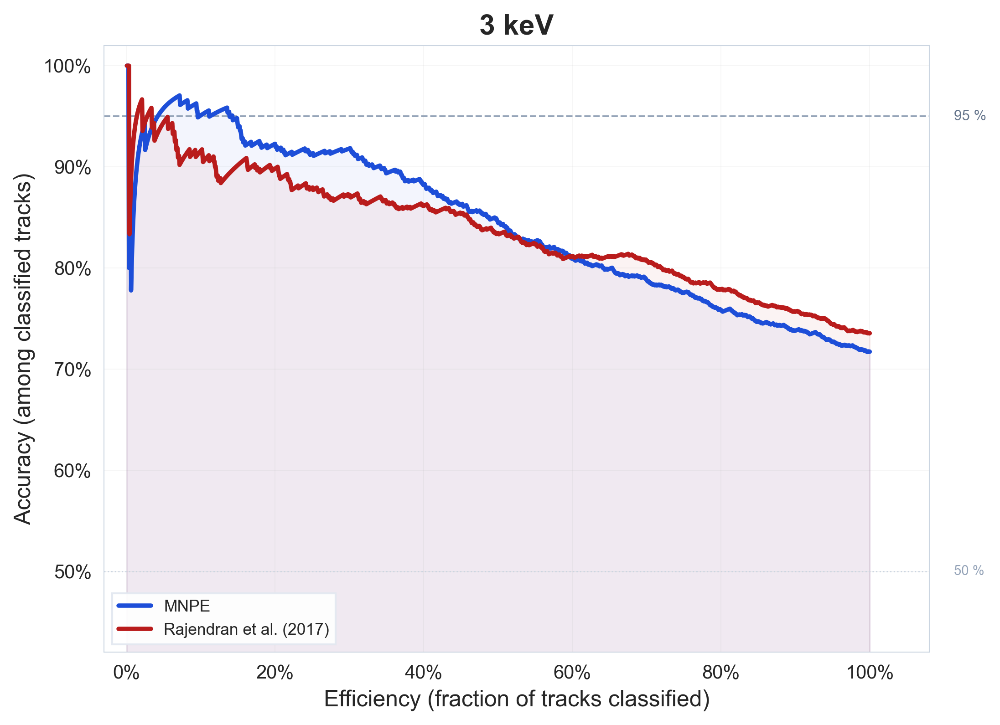

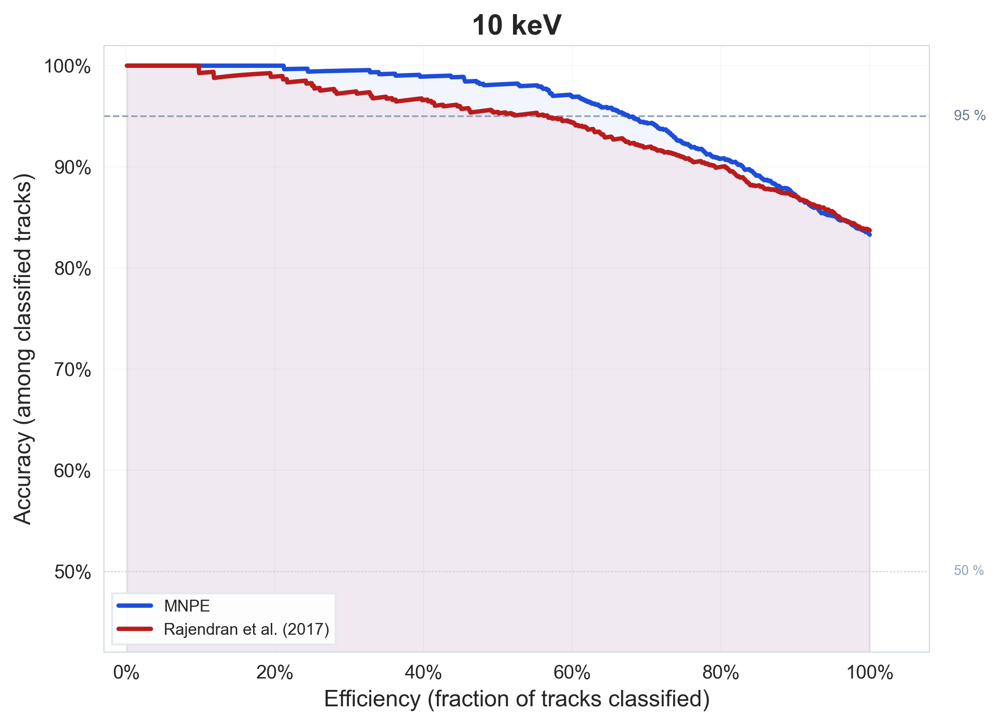

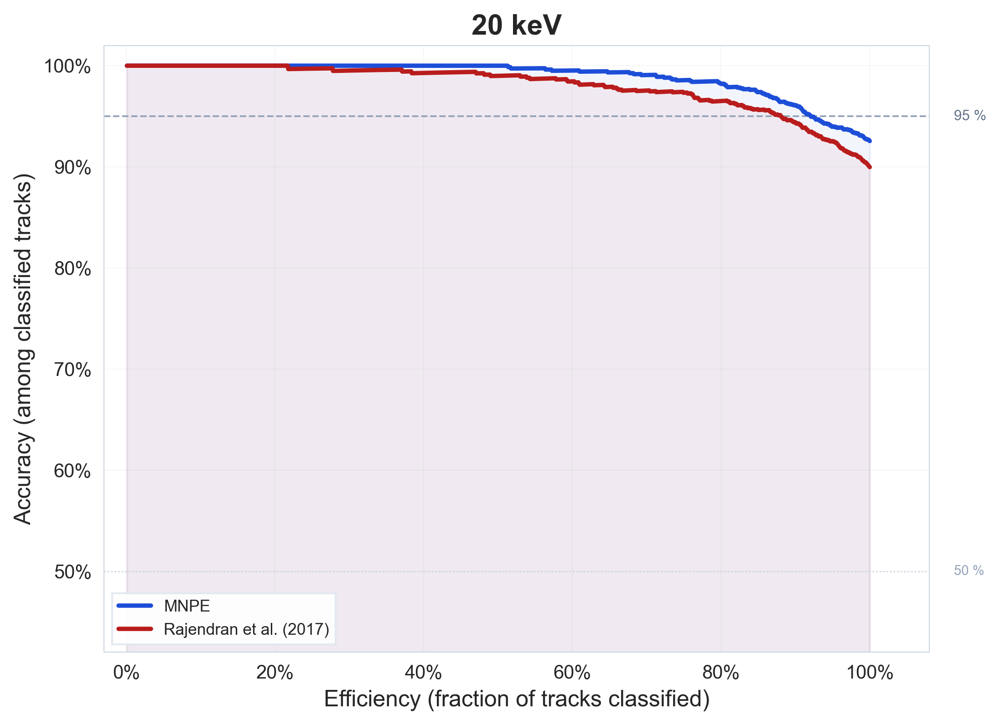

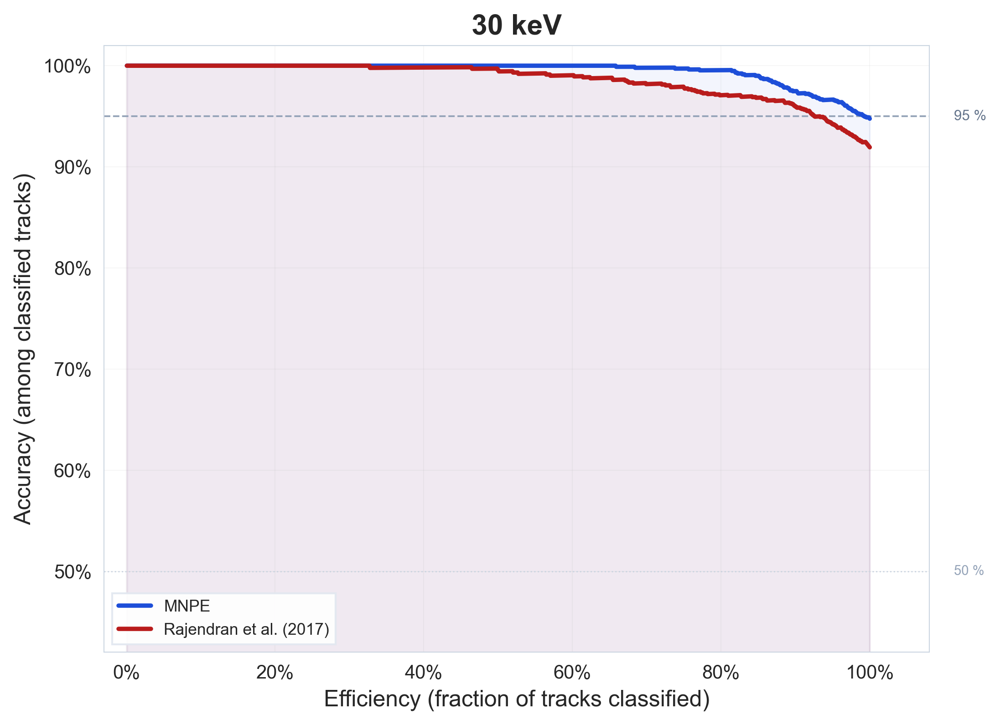

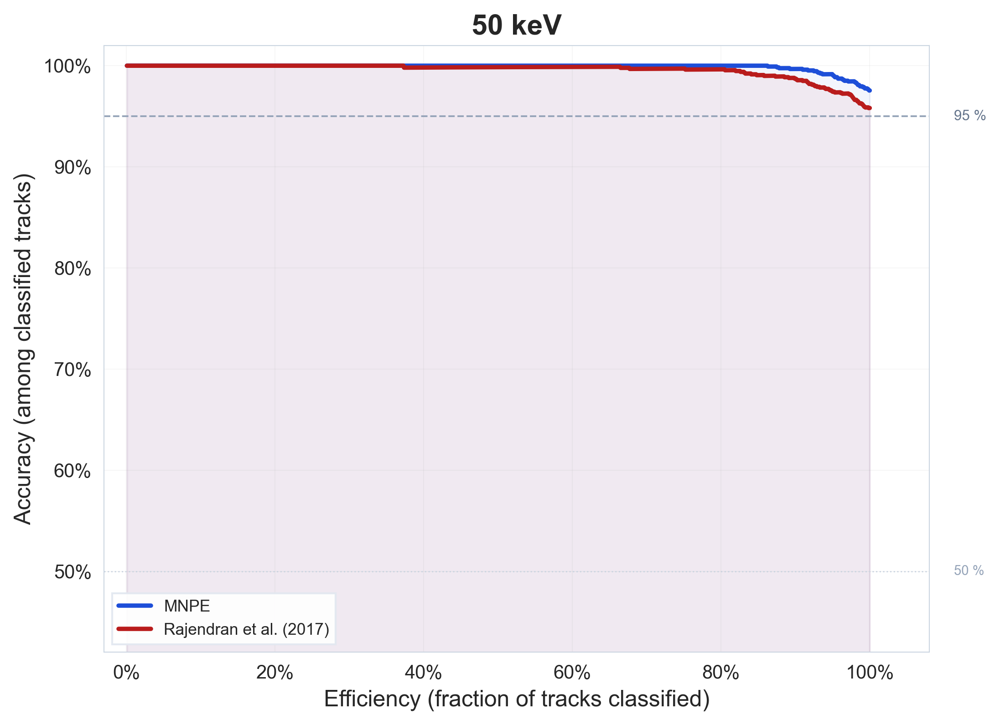

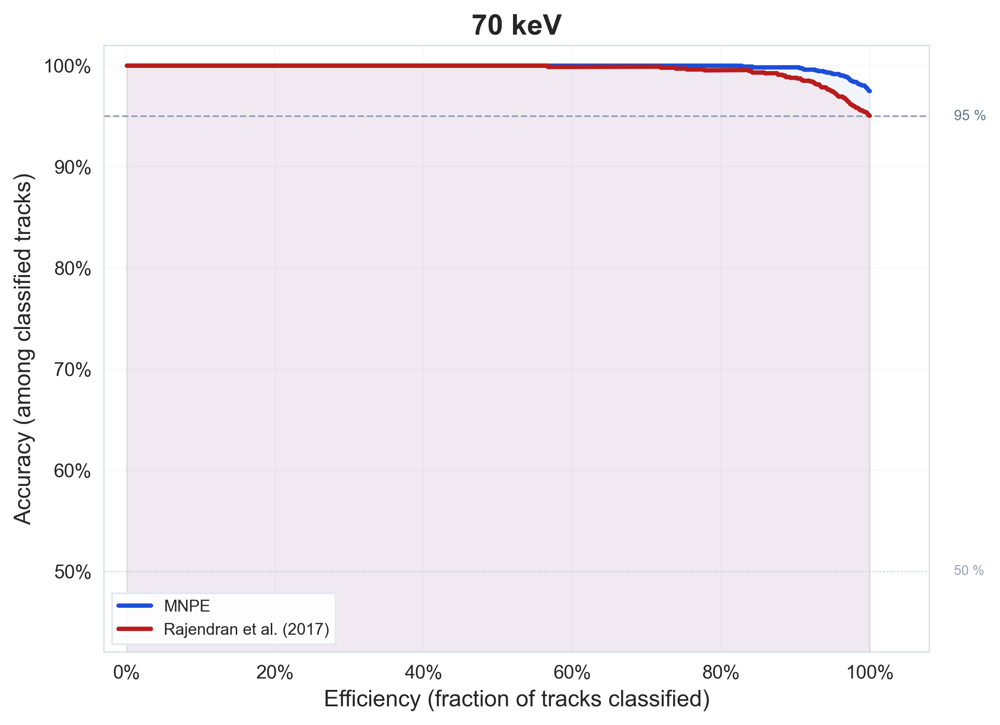

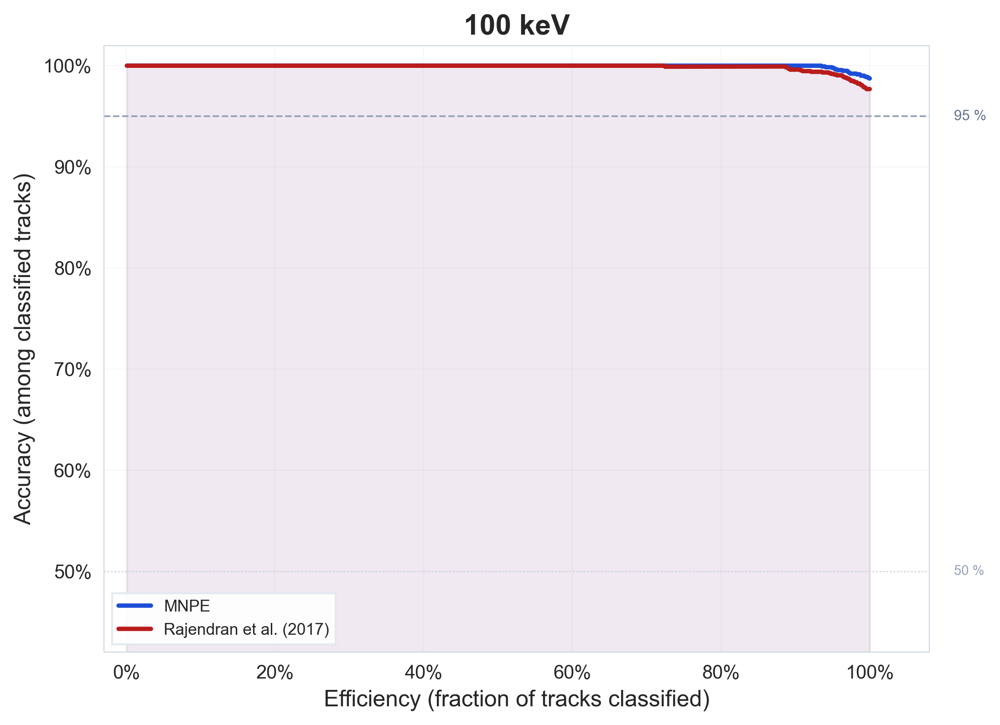

In [ ]:
"""
MNPE vs Rajendran (2017): Efficiency–Accuracy Comparison
=========================================================
Publication-quality plots. Paste into a Jupyter notebook cell.

- Grid overview (2×4) for all energies at a glance
- Individual clean plots per energy for paper/presentation use
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# CONFIG — update this path to your CSV
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
CSV_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/apples_to_apples/efficiency_vs_accuracy_curves8.csv" 

COLORS = {
    "MNPE":            "#1D4ED8",   # deep blue
    "Rajendran_2017":  "#B91C1C",   # deep red
}
LABELS = {
    "MNPE":            "MNPE",
    "Rajendran_2017":  "Rajendran et al. (2017)",
}

# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# LOAD
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
df = pd.read_csv(CSV_PATH)
energies = sorted(df["energy_keV"].unique())
print(f"Loaded {len(df)} data points across {len(energies)} energies: {energies}")


# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# HELPER: draw one panel
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
def draw_panel(ax, subset, energy, show_legend=False, title_size=13):
    """Draws one Efficiency vs Accuracy panel."""

    for model_key, color in COLORS.items():
        mdata = subset[subset["model"] == model_key].sort_values("efficiency")
        if mdata.empty:
            continue

        eff = mdata["efficiency"].values
        acc = mdata["accuracy"].values

        ax.plot(eff, acc, color=color, linewidth=2.3,
                label=LABELS[model_key], zorder=3)
        ax.fill_between(eff, 0.40, acc, color=color, alpha=0.05, zorder=1)

    # Reference lines

    ax.axhline(y=0.50, color="#CBD5E1", lw=0.7, ls=":",  zorder=1)

    # Annotations (right-aligned so they don't collide with data)
    ax.text(1.03, 0.95, "95 %", transform=ax.get_yaxis_transform(),
            fontsize=7.5, color="#64748B", va="center")
    ax.text(1.03, 0.50, "50 %", transform=ax.get_yaxis_transform(),
            fontsize=7, color="#94A3B8", va="center")

    # Axes
    ax.set_xlim(-0.03, 1.08)
    ax.set_ylim(0.42, 1.02)
    ax.xaxis.set_major_formatter(mticker.PercentFormatter(1, 0))
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(1, 0))
    ax.tick_params(labelsize=8.5, length=3)

    ax.set_title(f"{int(energy)} keV", fontsize=title_size,
                 fontweight="bold", pad=6)

    # Grid & spines
    ax.grid(True, alpha=0.20, lw=0.4)
    ax.set_axisbelow(True)
    for sp in ax.spines.values():
        sp.set_linewidth(0.5)
        sp.set_color("#CBD5E1")

    if show_legend:
        ax.legend(loc="lower left", fontsize=8.5,
                  framealpha=0.92, edgecolor="#E2E8F0", fancybox=False)


# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# PLOT 1 — Grid overview (2 × 4)
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
n = min(len(energies), 8)
ncols = 4
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(22, 5.2 * nrows),
                         constrained_layout=True)
axes_flat = axes.flatten() if n > 1 else [axes]

for i, energy in enumerate(energies[:n]):
    draw_panel(axes_flat[i],
               df[df["energy_keV"] == energy],
               energy,
               show_legend=(i == 0))
    axes_flat[i].set_xlabel("Efficiency", fontsize=9.5)
    axes_flat[i].set_ylabel("Accuracy",   fontsize=9.5)

# Remove empty panels
for j in range(n, len(axes_flat)):
    fig.delaxes(axes_flat[j])

fig.suptitle(
    "MNPE vs. Rajendran (2017) — Parity Classification",
    fontsize=17, fontweight="bold", y=1.015,
)
fig.text(0.5, 1.001,
         "Efficiency = fraction classified  ·  Accuracy = correctness among classified",
         ha="center", fontsize=9.5, color="#64748B", style="italic")

plt.show()


# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# PLOT 2 — Individual per-energy (larger, cleaner)
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
for energy in energies[:n]:
    fig2, ax2 = plt.subplots(figsize=(7.5, 5.5))

    draw_panel(ax2,
               df[df["energy_keV"] == energy],
               energy,
               show_legend=True,
               title_size=15)

    ax2.set_xlabel("Efficiency (fraction of tracks classified)", fontsize=12)
    ax2.set_ylabel("Accuracy (among classified tracks)",         fontsize=12)
    ax2.tick_params(labelsize=10)

    plt.tight_layout()
    plt.show()

Loaded 22468 data points across 8 energies: [1.0, 3.0, 10.0, 20.0, 30.0, 50.0, 70.0, 100.0]


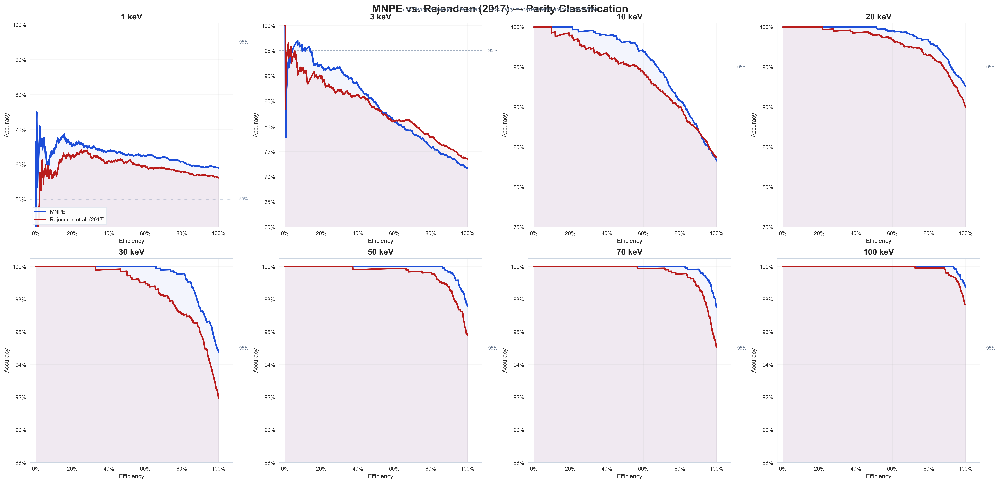

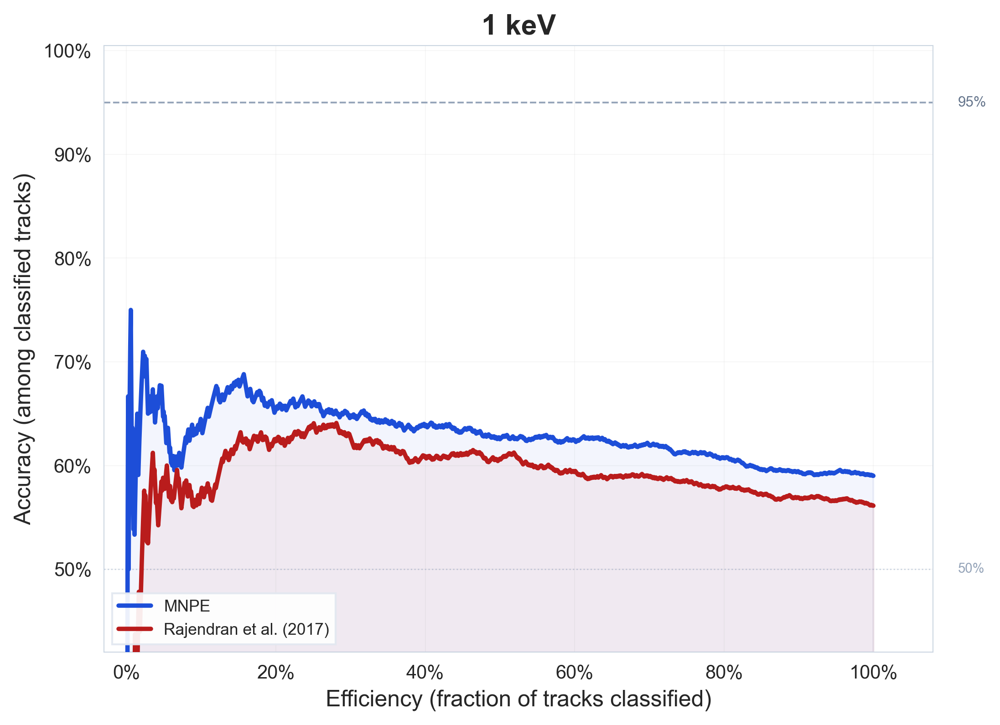

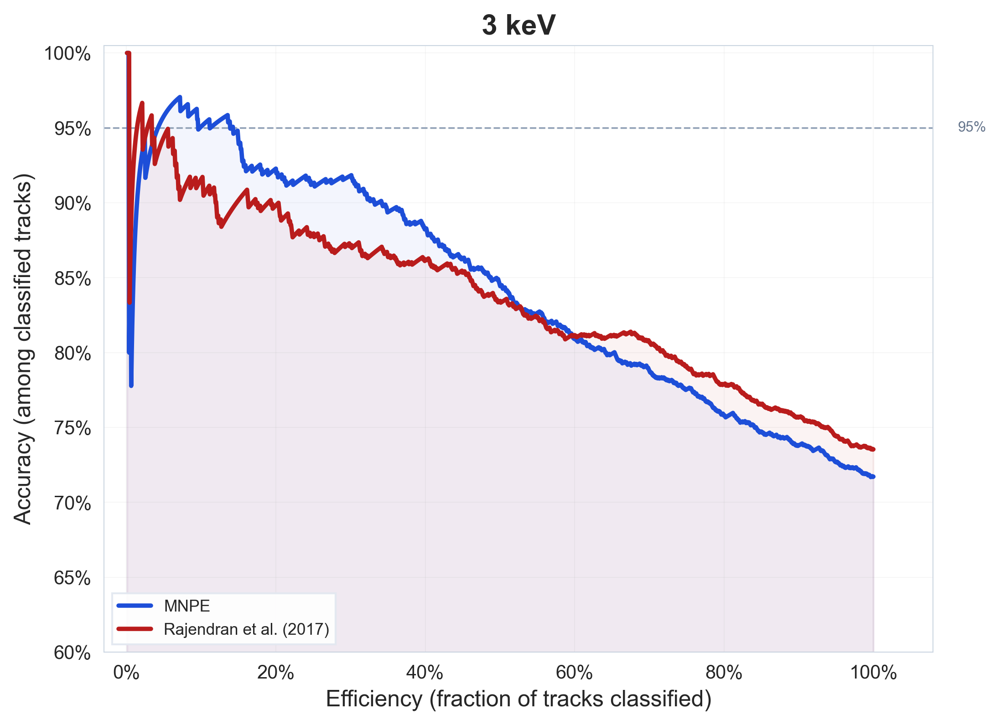

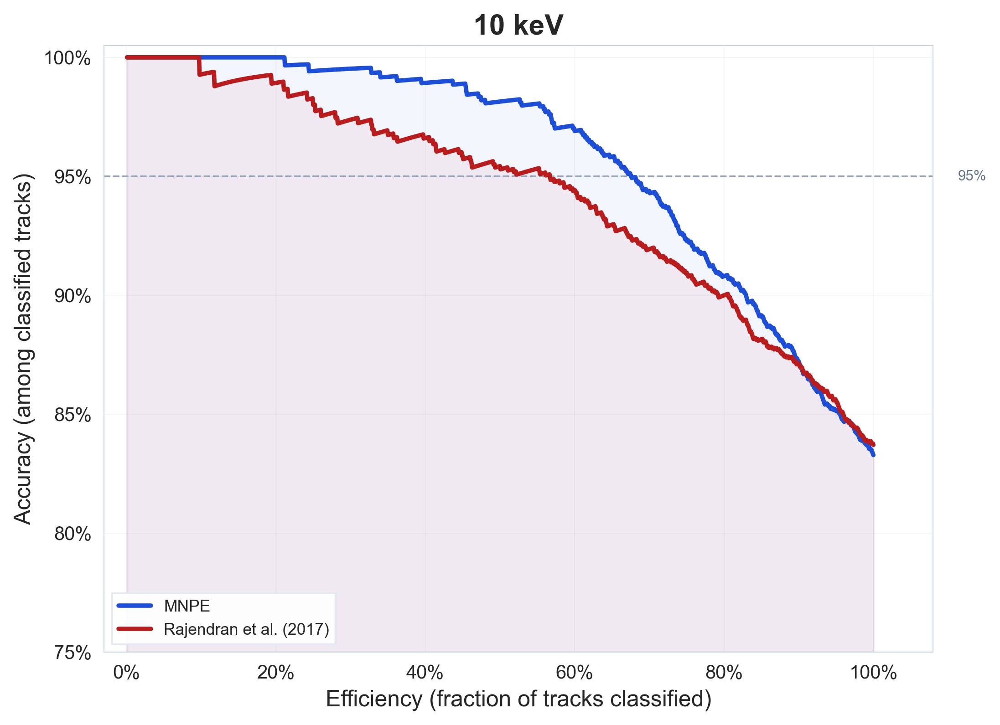

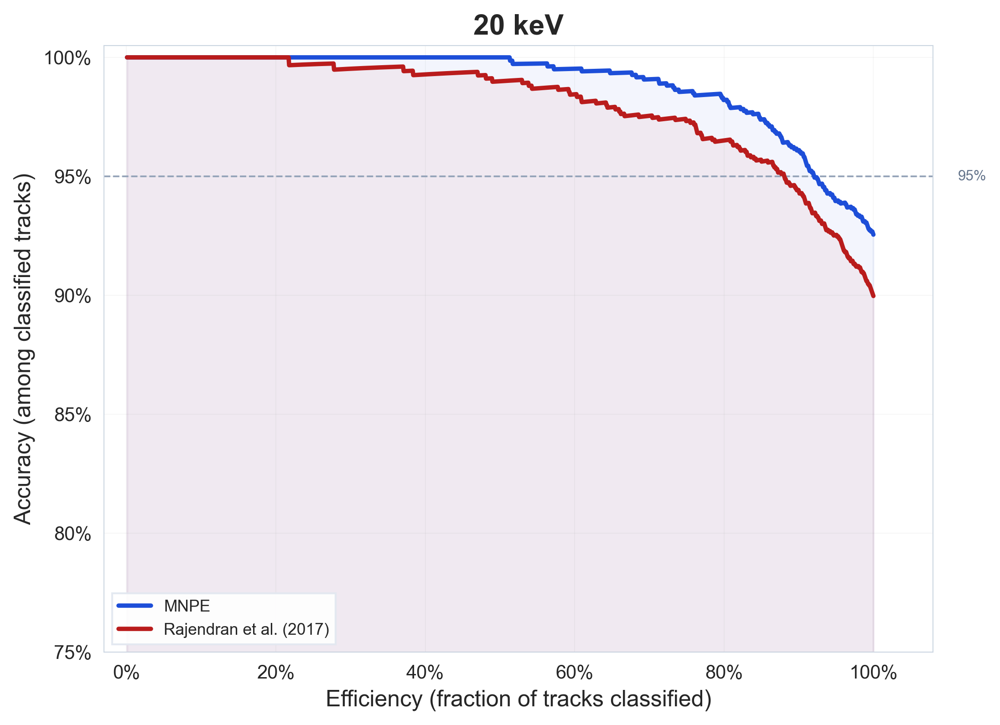

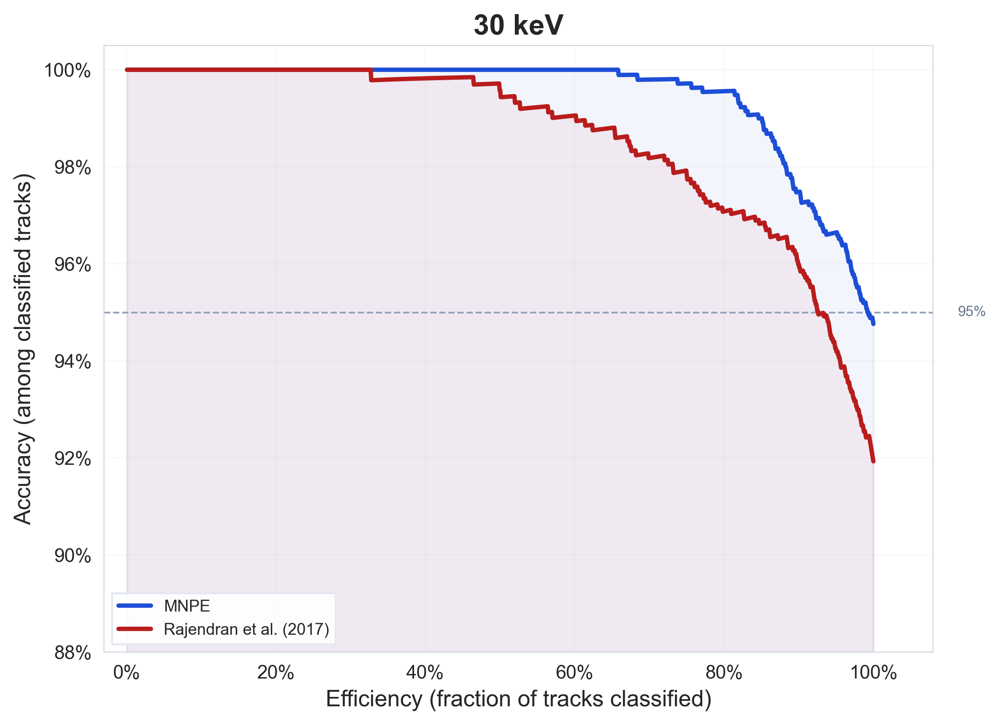

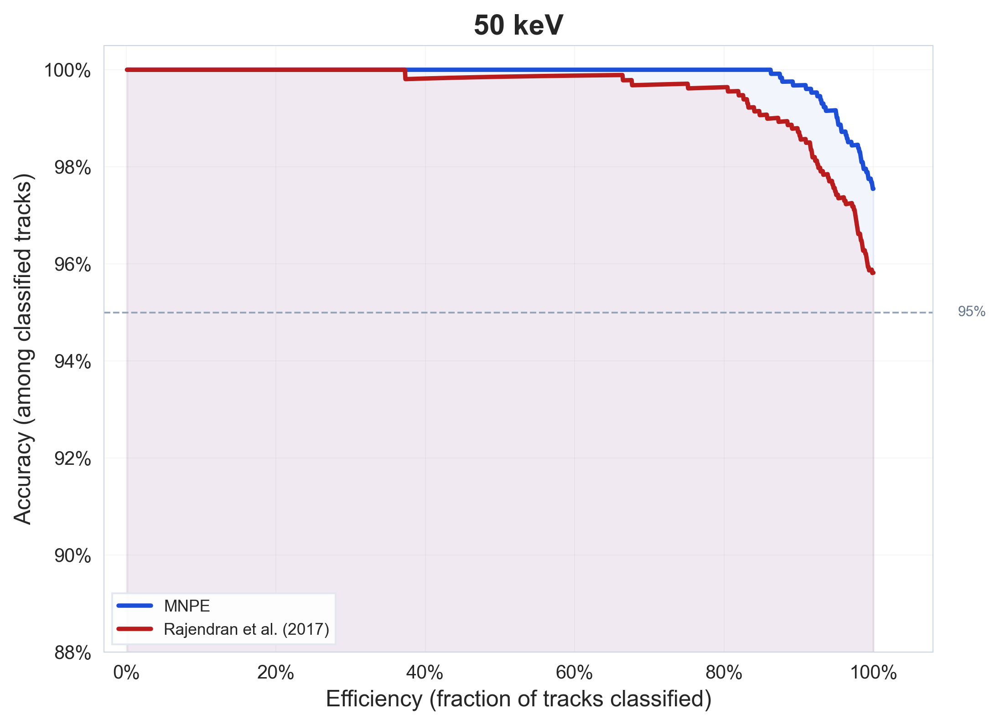

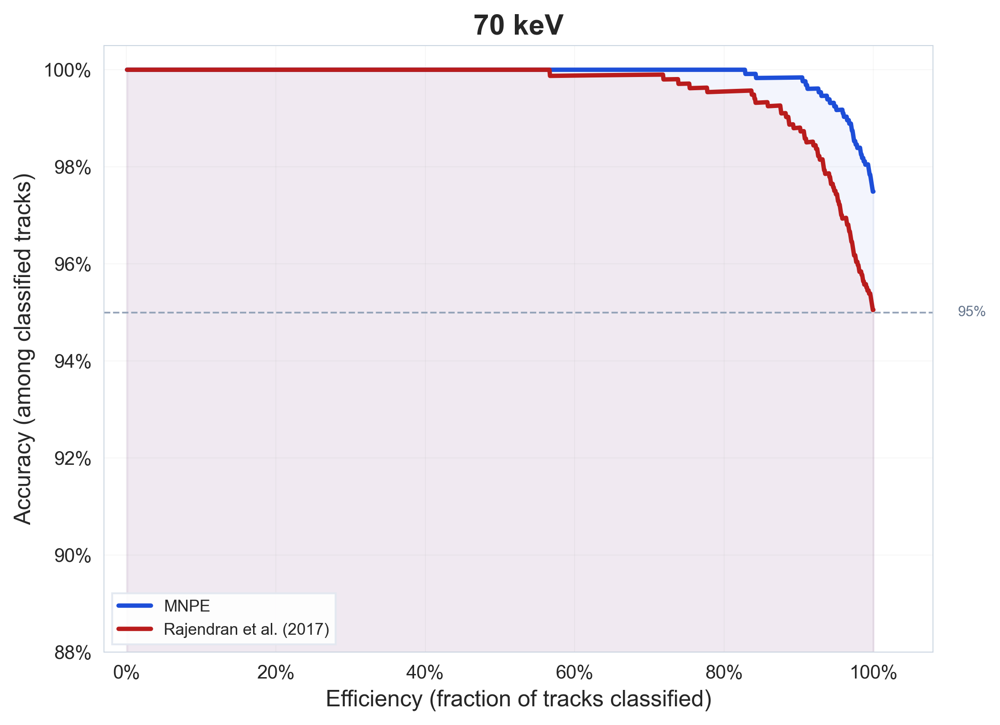

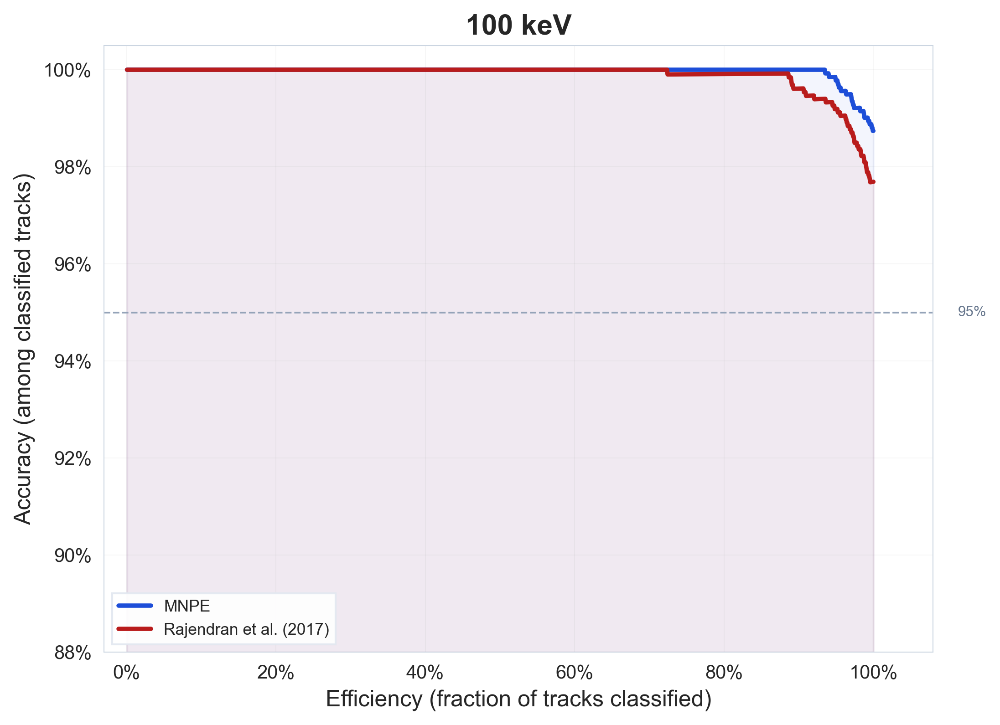

In [43]:
"""
MNPE vs Rajendran (2017): Efficiency–Accuracy Comparison
=========================================================
Publication-quality plots with adaptive y-axis zoom.
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
CSV_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/apples_to_apples/efficiency_vs_accuracy_curves8.csv"

COLORS = {
    "MNPE":            "#1D4ED8",
    "Rajendran_2017":  "#B91C1C",
}
LABELS = {
    "MNPE":            "MNPE",
    "Rajendran_2017":  "Rajendran et al. (2017)",
}

# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
df = pd.read_csv(CSV_PATH)
energies = sorted(df["energy_keV"].unique())
print(f"Loaded {len(df)} data points across {len(energies)} energies: {energies}")


def draw_panel(ax, subset, energy, show_legend=False, title_size=13):
    """Draws one Efficiency vs Accuracy panel with adaptive y-axis."""

    min_acc = 1.0
    for model_key, color in COLORS.items():
        mdata = subset[subset["model"] == model_key].sort_values("efficiency")
        if mdata.empty:
            continue

        eff = mdata["efficiency"].values
        acc = mdata["accuracy"].values
        min_acc = min(min_acc, acc.min())

        ax.plot(eff, acc, color=color, linewidth=2.3,
                label=LABELS[model_key], zorder=3)

    # Adaptive y-axis: zoom in when both methods are high accuracy
    if min_acc > 0.90:
        y_lo = 0.88
    elif min_acc > 0.80:
        y_lo = 0.75
    elif min_acc > 0.65:
        y_lo = 0.60
    else:
        y_lo = 0.42

    # Reference lines
    if 0.95 >= y_lo:
        ax.axhline(y=0.95, color="#94A3B8", lw=0.9, ls="--", zorder=2)
        ax.text(1.03, 0.95, "95%", transform=ax.get_yaxis_transform(),
                fontsize=7.5, color="#64748B", va="center")

    if 0.50 >= y_lo:
        ax.axhline(y=0.50, color="#CBD5E1", lw=0.7, ls=":", zorder=1)
        ax.text(1.03, 0.50, "50%", transform=ax.get_yaxis_transform(),
                fontsize=7, color="#94A3B8", va="center")

    # Fill between the two curves to highlight the difference
    for model_key, color in COLORS.items():
        mdata = subset[subset["model"] == model_key].sort_values("efficiency")
        if mdata.empty:
            continue
        ax.fill_between(mdata["efficiency"].values, y_lo,
                        mdata["accuracy"].values, color=color, alpha=0.05, zorder=1)

    ax.set_xlim(-0.03, 1.08)
    ax.set_ylim(y_lo, 1.005)
    ax.xaxis.set_major_formatter(mticker.PercentFormatter(1, 0))
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(1, 0))
    ax.tick_params(labelsize=8.5, length=3)

    ax.set_title(f"{int(energy)} keV", fontsize=title_size,
                 fontweight="bold", pad=6)

    ax.grid(True, alpha=0.20, lw=0.4)
    ax.set_axisbelow(True)
    for sp in ax.spines.values():
        sp.set_linewidth(0.5)
        sp.set_color("#CBD5E1")

    if show_legend:
        ax.legend(loc="lower left", fontsize=8.5,
                  framealpha=0.92, edgecolor="#E2E8F0", fancybox=False)


# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# PLOT 1 — Grid overview (2 × 4)
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
n = min(len(energies), 8)
ncols = 4
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(22, 5.2 * nrows),
                         constrained_layout=True)
axes_flat = axes.flatten() if n > 1 else [axes]

for i, energy in enumerate(energies[:n]):
    draw_panel(axes_flat[i],
               df[df["energy_keV"] == energy],
               energy,
               show_legend=(i == 0))
    axes_flat[i].set_xlabel("Efficiency", fontsize=9.5)
    axes_flat[i].set_ylabel("Accuracy", fontsize=9.5)

for j in range(n, len(axes_flat)):
    fig.delaxes(axes_flat[j])

fig.suptitle(
    "MNPE vs. Rajendran (2017) — Parity Classification",
    fontsize=17, fontweight="bold", y=1.015,
)
fig.text(0.5, 1.001,
         "Efficiency = fraction classified  ·  Accuracy = correctness among classified",
         ha="center", fontsize=9.5, color="#64748B", style="italic")

plt.show()


# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# PLOT 2 — Individual per-energy (larger, cleaner)
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
for energy in energies[:n]:
    fig2, ax2 = plt.subplots(figsize=(7.5, 5.5))

    draw_panel(ax2,
               df[df["energy_keV"] == energy],
               energy,
               show_legend=True,
               title_size=15)

    ax2.set_xlabel("Efficiency (fraction of tracks classified)", fontsize=12)
    ax2.set_ylabel("Accuracy (among classified tracks)", fontsize=12)
    ax2.tick_params(labelsize=10)

    plt.tight_layout()
    plt.show()

In [54]:
import pandas as pd
import numpy as np

# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
CSV_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/apples_to_apples/efficiency_vs_accuracy_curves8.csv"
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

def generate_accuracy_table():
    print("Loading data...")
    df = pd.read_csv(CSV_PATH)
    
    target_energies = [1.0, 3.0, 10.0, 30.0, 100.0]
    target_efficiency = 0.90
    models = ["MNPE", "Rajendran_2017"]
    
    table_data = []
    
    for energy in target_energies:
        row_data = {"Energy (keV)": f"{energy} keV"}
        
        for model in models:
            # Isolate the specific curve
            subset = df[(df["energy_keV"] == energy) & (df["model"] == model)].copy()
            
            if subset.empty:
                row_data[model] = "N/A"
                continue
                
            # Sort by efficiency ascending (required for numpy interpolation)
            subset = subset.sort_values("efficiency")
            
            eff_array = subset["efficiency"].values
            acc_array = subset["accuracy"].values
            
            # Interpolate accuracy at exactly 90% efficiency
            # Note: If 0.90 is outside the bounds of the array, np.interp caps it at the edge values
            acc_at_90 = np.interp(target_efficiency, eff_array, acc_array)
            
            # Format as a clean percentage string
            row_data[model] = f"{acc_at_90 * 100:.2f}%"
            
        table_data.append(row_data)
        
    # Convert to a DataFrame for clean formatting and printing
    results_df = pd.DataFrame(table_data)
    
    print("\n=================================================")
    print("        ACCURACY AT 90% EFFICIENCY TARGET        ")
    print("=================================================")
    print(results_df.to_string(index=False, justify='center'))
    print("=================================================\n")

if __name__ == "__main__":
    generate_accuracy_table()

Loading data...

        ACCURACY AT 90% EFFICIENCY TARGET        
Energy (keV)   MNPE  Rajendran_2017
   1.0 keV    59.40%     56.92%    
   3.0 keV    73.80%     75.67%    
  10.0 keV    87.22%     87.14%    
  30.0 keV    97.48%     95.99%    
 100.0 keV   100.00%     99.61%    



In [ ]:
"""
Auto-generate MNPE vs Rajendran comparison tables from curve data.
Paste into a Jupyter cell after running your pipeline.
"""
import pandas as pd
import numpy as np

CSV_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/apples_to_apples/efficiency_vs_accuracy_curves8.csv"

df = pd.read_csv(CSV_PATH)
energies = sorted(df["energy_keV"].unique())

# ── Table 1: Efficiency at 95% Accuracy ─────────────────────
print("=" * 72)
print("  TABLE 1: Maximum Efficiency at ≥95% Accuracy")
print("=" * 72)
print(f"{'Energy':>10}  {'MNPE':>10}  {'Rajendran':>12}  {'Advantage':>12}  {'Winner':>8}")
print("-" * 72)

for energy in energies:
    row = {}
    for model in ["MNPE", "Rajendran_2017"]:
        subset = df[
            (df["energy_keV"] == energy) &
            (df["model"] == model) &
            (df["accuracy"] >= 0.95)
        ]
        row[model] = subset["efficiency"].max() if not subset.empty else 0.0

    mnpe_eff = row["MNPE"] * 100
    raj_eff = row["Rajendran_2017"] * 100
    diff = mnpe_eff - raj_eff
    sign = "+" if diff > 0 else ""
    winner = "MNPE" if diff > 0 else ("Raj" if diff < 0 else "Tie")

    print(f"{energy:>8.0f} keV  {mnpe_eff:>8.1f}%  {raj_eff:>10.1f}%  {sign}{diff:>10.1f} {winner:>8}")

print("=" * 72)

# ── Table 2: Accuracy at 100% Efficiency ────────────────────
print()
print("=" * 72)
print("  TABLE 2: Accuracy at 100% Efficiency (All Tracks Classified)")
print("=" * 72)
print(f"{'Energy':>10}  {'MNPE':>10}  {'Rajendran':>12}  {'Advantage':>12}  {'Winner':>8}")
print("-" * 72)

for energy in energies:
    row = {}
    for model in ["MNPE", "Rajendran_2017"]:
        subset = df[
            (df["energy_keV"] == energy) &
            (df["model"] == model)
        ]
        # At 100% efficiency = the last point on the curve (all tracks included)
        if not subset.empty:
            row[model] = subset.loc[subset["efficiency"].idxmax(), "accuracy"]
        else:
            row[model] = 0.5

    mnpe_acc = row["MNPE"] * 100
    raj_acc = row["Rajendran_2017"] * 100
    diff = mnpe_acc - raj_acc
    sign = "+" if diff > 0 else ""
    winner = "MNPE" if diff > 0 else ("Raj" if diff < 0 else "Tie")

    print(f"{energy:>8.0f} keV  {mnpe_acc:>8.1f}%  {raj_acc:>10.1f}%  {sign}{diff:>10.1f}   {winner:>8}")

print("=" * 72)

# ── Table 3: Key operating points ───────────────────────────
print()
print("=" * 80)
print("  TABLE 3: Key Operating Points")
print("=" * 80)
print(f"{'Energy':>10}  {'Metric':>25}  {'MNPE':>10}  {'Rajendran':>12}")
print("-" * 80)

for energy in [3, 10, 20, 30]:
    for model in ["MNPE", "Rajendran_2017"]:
        subset = df[
            (df["energy_keV"] == energy) &
            (df["model"] == model)
        ]
        if subset.empty:
            continue

        # Accuracy at 50% efficiency
        closest_50 = subset.iloc[(subset["efficiency"] - 0.5).abs().argsort()[:1]]
        acc_at_50 = closest_50["accuracy"].values[0] * 100 if not closest_50.empty else 0

        # Efficiency at 90% accuracy
        above_90 = subset[subset["accuracy"] >= 0.90]
        eff_at_90 = above_90["efficiency"].max() * 100 if not above_90.empty else 0

        if model == "MNPE":
            mnpe_50, mnpe_90 = acc_at_50, eff_at_90
        else:
            raj_50, raj_90 = acc_at_50, eff_at_90

    print(f"{energy:>8.0f} keV  {'Accuracy at 50% eff':>25}  {mnpe_50:>8.1f}%  {raj_50:>10.1f}%")
    print(f"{'':>10}  {'Efficiency at 90% acc':>25}  {mnpe_90:>8.1f}%  {raj_90:>10.1f}%")
    print("-" * 80)

import pandas as pd
import numpy as np

# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
CSV_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/apples_to_apples/efficiency_vs_accuracy_curves8.csv"
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

def generate_accuracy_table():
    print("Loading data...")
    df = pd.read_csv(CSV_PATH)
    
    target_energies = [1.0, 3.0, 10.0, 30.0, 100.0]
    target_efficiency = 0.90
    models = ["MNPE", "Rajendran_2017"]
    
    table_data = []
    
    for energy in target_energies:
        row_data = {"Energy (keV)": f"{energy} keV"}
        
        for model in models:
            # Isolate the specific curve
            subset = df[(df["energy_keV"] == energy) & (df["model"] == model)].copy()
            
            if subset.empty:
                row_data[model] = "N/A"
                continue
                
            # Sort by efficiency ascending (required for numpy interpolation)
            subset = subset.sort_values("efficiency")
            
            eff_array = subset["efficiency"].values
            acc_array = subset["accuracy"].values
            
            # Interpolate accuracy at exactly 90% efficiency
            # Note: If 0.90 is outside the bounds of the array, np.interp caps it at the edge values
            acc_at_90 = np.interp(target_efficiency, eff_array, acc_array)
            
            # Format as a clean percentage string
            row_data[model] = f"{acc_at_90 * 100:.2f}%"
            
        table_data.append(row_data)
        
    # Convert to a DataFrame for clean formatting and printing
    results_df = pd.DataFrame(table_data)
    
    print("\n=================================================")
    print("        ACCURACY AT 90% EFFICIENCY TARGET        ")
    print("=================================================")
    print(results_df.to_string(index=False, justify='center'))
    print("=================================================\n")

if __name__ == "__main__":
    generate_accuracy_table()

  TABLE 1: Maximum Efficiency at ≥95% Accuracy
    Energy        MNPE     Rajendran     Advantage    Winner
------------------------------------------------------------------------
       1 keV       0.0%         0.0%         0.0      Tie
       3 keV      14.2%         3.4%  +      10.9     MNPE
      10 keV      67.6%        56.6%  +      10.9     MNPE
      20 keV      92.0%        88.0%  +       4.0     MNPE
      30 keV      99.3%        92.6%  +       6.7     MNPE
      50 keV     100.0%       100.0%         0.0      Tie
      70 keV     100.0%       100.0%         0.0      Tie
     100 keV     100.0%       100.0%         0.0      Tie

  TABLE 2: Accuracy at 100% Efficiency (All Tracks Classified)
    Energy        MNPE     Rajendran     Advantage    Winner
------------------------------------------------------------------------
       1 keV      59.0%        56.1%  +       2.9       MNPE
       3 keV      71.7%        73.5%        -1.8        Raj
      10 keV      83.3%        8

Data loaded successfully! Generating plots...


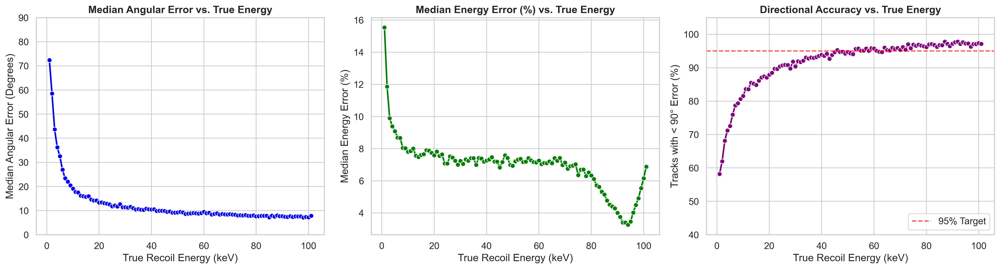

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Load the data
CSV_PATH = "/Users/cbharathulwar/Documents/Research/Walsworth/Code/SBI/srim-sbi/results/mcpe3_continuous250k_eval_results.csv"

try:
    df = pd.read_csv(CSV_PATH)
    print("Data loaded successfully! Generating plots...")
except FileNotFoundError:
    print(f"Error: Could not find {CSV_PATH}. Please check the file path.")
    raise

# 2. Pre-process the metrics
# Calculate percentage energy error (Absolute Error / True Energy * 100)
df['energy_error_pct'] = (df['energy_error'] / df['true_energy']) * 100

# Determine if the Head/Tail direction was correctly identified (Error < 90 degrees)
df['is_direction_correct'] = df['angular_error'] < 90

# 3. Group the data by True Energy bins
# We group by true_energy to see how performance scales as tracks get bigger
grouped = df.groupby('true_energy').agg(
    median_angle_error=('angular_error', 'median'),
    median_energy_error_pct=('energy_error_pct', 'median'),
    direction_accuracy=('is_direction_correct', 'mean') # Mean of booleans gives percentage!
).reset_index()

# Convert direction accuracy to a percentage (0-100)
grouped['direction_accuracy'] *= 100

# 4. Set up the visual style
sns.set_theme(style="whitegrid", context="notebook", font_scale=1.1)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# --- PLOT 1: Median Angular Error vs Energy ---
sns.lineplot(data=grouped, x='true_energy', y='median_angle_error', ax=axes[0], 
             marker='o', color='blue', linewidth=2)
axes[0].set_title("Median Angular Error vs. True Energy", fontweight='bold')
axes[0].set_xlabel("True Recoil Energy (keV)")
axes[0].set_ylabel("Median Angular Error (Degrees)")
axes[0].set_ylim(0, 90) # Error maxes out at random guessing (~90 deg)

# --- PLOT 2: Median Energy Error vs Energy ---
sns.lineplot(data=grouped, x='true_energy', y='median_energy_error_pct', ax=axes[1], 
             marker='o', color='green', linewidth=2)
axes[1].set_title("Median Energy Error (%) vs. True Energy", fontweight='bold')
axes[1].set_xlabel("True Recoil Energy (keV)")
axes[1].set_ylabel("Median Energy Error (%)")

# --- PLOT 3: The "95% Confidence Threshold" Plot ---
sns.lineplot(data=grouped, x='true_energy', y='direction_accuracy', ax=axes[2], 
             marker='o', color='purple', linewidth=2)
axes[2].axhline(y=95, color='red', linestyle='--', alpha=0.7, label='95% Target')
axes[2].set_title("Directional Accuracy vs. True Energy", fontweight='bold')
axes[2].set_xlabel("True Recoil Energy (keV)")
axes[2].set_ylabel("Tracks with < 90° Error (%)")
axes[2].set_ylim(40, 105) # Accuracy ranges from ~50% (random guessing) to 100%
axes[2].legend(loc="lower right")

# Finalize and render
plt.tight_layout()
plt.show()